In [1]:
import os

# General packages
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.express as px
from PIL import Image

from IPython.display import Image as IImage
from IPython.display import display
import warnings
warnings.filterwarnings("ignore")

In [2]:
import glob
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet

In [3]:
df = pd.read_csv('/raid/AISSEL/htest/datasets/ped_data/ped_ftest/Pedestrian.csv')
df

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh
0,-1,1,https://www.ci.oswego.or.us/bfp/2021/12/17/con...,https://www.ci.oswego.or.us/bfp/wp-content/upl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Building a Better Boones Ferry Road,NaN,Building a Better Boones Ferry Road\n\nSearch\...
1,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN
2,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN
3,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,8 seconds Film Boerne Shooting Locations Texas...,NaN,NaN
4,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,All the pretty Horses Film Boerne Shooting Loc...,NaN,NaN
...,...,...,...,...,...,...,...,...
60215,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO\nExtremely stable ...
60216,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Access Scaffolding BRIO,Access Scaffolding BRIO,Access Scaffolding BRIO\nTemporary stair tower...
60217,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/ulma/media...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,No 20,No 20,I accept the Data Protection and Cookies Polic...
60218,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/projects/b...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"ES-60 Viaduct, Poland","ES-60 Viaduct, Poland","ES-60 Viaduct, Poland\nThe new ES-60 Viaduct, ..."


In [4]:
df['alt'].isna().sum()

15726

In [5]:
df['title'].isna().sum()

47665

In [6]:
filtered_df = df[df['title'].notnull()]
filtered_df

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh
90,-1,1,https://sierranevadageotourism.org/entries/dow...,https://cdn.elebase.io/29559e61-1a75-4e70-a155...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Downieville's Gold Rush Days gets people out o...,Downieville's Gold Rush Days gets people out o...,NaN
91,-1,1,https://sierranevadageotourism.org/entries/dow...,https://cdn.elebase.io/29559e61-1a75-4e70-a155...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"The Downieville Classic is a grueling race, no...","The Downieville Classic is a grueling race, no...",NaN
92,-1,1,https://sierranevadageotourism.org/entries/dow...,https://cdn.elebase.io/29559e61-1a75-4e70-a155...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Downtown Downieville. Seems we're all fond of ...,Downtown Downieville. Seems we're all fond of ...,NaN
93,-1,1,https://sierranevadageotourism.org/entries/dow...,https://cdn.elebase.io/29559e61-1a75-4e70-a155...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Downieville is a very active town with lots of...,Downieville is a very active town with lots of...,NaN
94,-1,1,https://sierranevadageotourism.org/entries/dow...,https://cdn.elebase.io/29559e61-1a75-4e70-a155...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Downieville is a vibrant town of today with a ...,Downieville is a vibrant town of today with a ...,NaN
...,...,...,...,...,...,...,...,...
60215,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO\nExtremely stable ...
60216,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Access Scaffolding BRIO,Access Scaffolding BRIO,Access Scaffolding BRIO\nTemporary stair tower...
60217,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/ulma/media...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,No 20,No 20,I accept the Data Protection and Cookies Polic...
60218,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/projects/b...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"ES-60 Viaduct, Poland","ES-60 Viaduct, Poland","ES-60 Viaduct, Poland\nThe new ES-60 Viaduct, ..."


In [7]:
filtered_df['alt'].isna().sum()

673

In [8]:
df['Paragragh'].isna().sum()

14960

In [9]:
# dff = df.dropna()
dff = df[df['alt'].notna()]
dff = dff.reset_index(drop=True)
dff

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh
0,-1,1,https://www.ci.oswego.or.us/bfp/2021/12/17/con...,https://www.ci.oswego.or.us/bfp/wp-content/upl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Building a Better Boones Ferry Road,NaN,Building a Better Boones Ferry Road\n\nSearch\...
1,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN
2,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN
3,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,8 seconds Film Boerne Shooting Locations Texas...,NaN,NaN
4,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,All the pretty Horses Film Boerne Shooting Loc...,NaN,NaN
...,...,...,...,...,...,...,...,...
44489,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO\nExtremely stable ...
44490,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Access Scaffolding BRIO,Access Scaffolding BRIO,Access Scaffolding BRIO\nTemporary stair tower...
44491,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/ulma/media...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,No 20,No 20,I accept the Data Protection and Cookies Polic...
44492,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/projects/b...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"ES-60 Viaduct, Poland","ES-60 Viaduct, Poland","ES-60 Viaduct, Poland\nThe new ES-60 Viaduct, ..."


In [10]:
dff[dff["Paragragh"] == '<img']

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh


In [11]:
dff['caption_length'] = dff['alt'].astype('str').str.split().str.len()
dff

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length
0,-1,1,https://www.ci.oswego.or.us/bfp/2021/12/17/con...,https://www.ci.oswego.or.us/bfp/wp-content/upl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Building a Better Boones Ferry Road,NaN,Building a Better Boones Ferry Road\n\nSearch\...,6
1,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN,7
2,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN,7
3,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,8 seconds Film Boerne Shooting Locations Texas...,NaN,NaN,9
4,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,All the pretty Horses Film Boerne Shooting Loc...,NaN,NaN,11
...,...,...,...,...,...,...,...,...,...
44489,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO\nExtremely stable ...,3
44490,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Access Scaffolding BRIO,Access Scaffolding BRIO,Access Scaffolding BRIO\nTemporary stair tower...,3
44491,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/ulma/media...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,No 20,No 20,I accept the Data Protection and Cookies Polic...,2
44492,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/projects/b...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"ES-60 Viaduct, Poland","ES-60 Viaduct, Poland","ES-60 Viaduct, Poland\nThe new ES-60 Viaduct, ...",3


In [12]:
dff = dff[dff['caption_length'] > 1]
dff = dff.reset_index(drop=True)
dff

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length
0,-1,1,https://www.ci.oswego.or.us/bfp/2021/12/17/con...,https://www.ci.oswego.or.us/bfp/wp-content/upl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Building a Better Boones Ferry Road,NaN,Building a Better Boones Ferry Road\n\nSearch\...,6
1,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN,7
2,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN,7
3,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,8 seconds Film Boerne Shooting Locations Texas...,NaN,NaN,9
4,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,All the pretty Horses Film Boerne Shooting Loc...,NaN,NaN,11
...,...,...,...,...,...,...,...,...,...
40620,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO\nExtremely stable ...,3
40621,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Access Scaffolding BRIO,Access Scaffolding BRIO,Access Scaffolding BRIO\nTemporary stair tower...,3
40622,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/ulma/media...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,No 20,No 20,I accept the Data Protection and Cookies Polic...,2
40623,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/projects/b...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"ES-60 Viaduct, Poland","ES-60 Viaduct, Poland","ES-60 Viaduct, Poland\nThe new ES-60 Viaduct, ...",3


In [13]:
dff

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length
0,-1,1,https://www.ci.oswego.or.us/bfp/2021/12/17/con...,https://www.ci.oswego.or.us/bfp/wp-content/upl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Building a Better Boones Ferry Road,NaN,Building a Better Boones Ferry Road\n\nSearch\...,6
1,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN,7
2,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Film Boerne Shooting Location Texas Hill Country,NaN,NaN,7
3,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,8 seconds Film Boerne Shooting Locations Texas...,NaN,NaN,9
4,-1,1,https://www.filmboerne.com/,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,All the pretty Horses Film Boerne Shooting Loc...,NaN,NaN,11
...,...,...,...,...,...,...,...,...,...
40620,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO\nExtremely stable ...,3
40621,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Access Scaffolding BRIO,Access Scaffolding BRIO,Access Scaffolding BRIO\nTemporary stair tower...,3
40622,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/ulma/media...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,No 20,No 20,I accept the Data Protection and Cookies Polic...,2
40623,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/projects/b...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"ES-60 Viaduct, Poland","ES-60 Viaduct, Poland","ES-60 Viaduct, Poland\nThe new ES-60 Viaduct, ...",3


In [14]:
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/test/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/test/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [15]:
def find_gpus(nums=6):
    os.system('nvidia-smi -q -d Memory |grep -A4 GPU|grep Free >tmp_free_gpus')
    with open('tmp_free_gpus', 'r') as lines_txt:
        frees = lines_txt.readlines()
        idx_freeMemory_pair = [ (idx,int(x.split()[2]))
                              for idx,x in enumerate(frees) ]
    idx_freeMemory_pair.sort(key=lambda my_tuple:my_tuple[1],reverse=True)
    usingGPUs = [str(idx_memory_pair[0])
                    for idx_memory_pair in idx_freeMemory_pair[:nums] ]
    usingGPUs =  ','.join(usingGPUs)
    print('using GPU idx: #', usingGPUs)
    return usingGPUs

In [16]:
os.environ['CUDA_VISIBLE_DEVICES'] = find_gpus(nums=2)

using GPU idx: # 1,0


In [17]:
from nltk.corpus import stopwords
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [18]:
from bertopic import BERTopic

In [19]:
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

In [20]:
lemmatizer = WordNetLemmatizer()

In [21]:
def get_topics(concept='pedestrian'):
    if concept == 'pedestrian':
        model_path = '../ped_auto_model'
    elif concept == 'aircraft':
        model_path = '../aircraft_auto_model'
    elif concept == 'car':
        model_path = '../car_auto_model'
    auto_model = BERTopic(nr_topics="auto")
    auto_model = BERTopic.load(model_path)
    similar_topics, similarity = auto_model.find_topics(concept, top_n=50)

    topics = dict()
    for t in similar_topics:
        l1 = auto_model.get_topic(t)
        el_list = []
        el_list.append(concept)
        for el in l1:
            w = lemmatizer.lemmatize(el[0], get_wordnet_pos(el[0]))
            el_list.append(w)
        topics[t]= set(el_list)
    return topics

# SBERT Semantic Search

In [22]:
from sentence_transformers import SentenceTransformer, util
embedder = SentenceTransformer('all-MiniLM-L6-v2')

In [23]:
def calc_all_sim(queries, corpus, doc_len):
    query_embeddings = embedder.encode(queries, convert_to_tensor=True)
    corpus_embeddings = embedder.encode(corpus, convert_to_tensor=True)
    
    corpus_embeddings = corpus_embeddings.to('cuda')
    corpus_embeddings = util.normalize_embeddings(corpus_embeddings)

    query_embeddings = query_embeddings.to('cuda')
    query_embeddings = util.normalize_embeddings(query_embeddings)
    
    hits = util.semantic_search(query_embeddings, corpus_embeddings, score_function=util.dot_score, top_k=doc_len)
    return hits

In [24]:
def get_sim(u,v):
    emb1 = embedder.encode(u)
#     emb2 = model.encode(v)
    
    return float(util.cos_sim(emb1, v)[0][0])


In [25]:
auto_model = BERTopic(nr_topics="auto")
auto_model = BERTopic.load('../ped_auto_model')

In [26]:
av_similar_topics, av_similarity =auto_model.find_topics("pedestrian", top_n=50)
print(av_similar_topics)

[196, 412, 172, 363, 198, 114, 419, 294, 388, 314, 98, 80, 134, 432, 394, 53, 56, 150, 278, -1, 43, 265, 345, 378, 11, 331, 202, 169, 327, 309, 68, 216, 40, 99, 426, 344, 47, 8, 416, 112, 137, 441, 192, 20, 296, 144, 12, 224, 250, 376]


In [27]:
topics = get_topics(concept='pedestrian')

In [28]:
el_list = [list(topics[el]) for el in topics]
q_id = [el for el in topics]
queries = [' '.join(el) for el in el_list]
queries

['crosswalk traffic signal stripe cross pedestrian crossing',
 'arrest perp walkability walkable pedestrian walk pers',
 'vehicle traffic car road lane pedestrian street transportation',
 'bystander stalk intervene victim intervention witness pedestrian assault stalker',
 'vehicle parking tow car garage park pedestrian parkjockey',
 'wheelchair disability paralympic athlete paralympics sportspeople sport pedestrian',
 'manhattan suffix boulevard avenue road pedestrian intersection street',
 'penalty fine traffic speed licence drive ticket pedestrian offence reckless violation',
 'diffusion brownian markov stochastic step wiener distribution percolation pedestrian walk',
 'circle traffic interchange road lane roundabout pedestrian intersection junction',
 'marker direction signage parking traffic road lane cross pedestrian sign',
 'nhtsa vehicle accident brake collision momentum drive pedestrian fatality velocity',
 'toronto expressway gardiner avenue edmonton road lane freeway highway 

In [29]:
for el in topics:
    print(el, topics[el])

196 {'crosswalk', 'traffic', 'signal', 'stripe', 'cross', 'pedestrian', 'crossing'}
412 {'arrest', 'perp', 'walkability', 'walkable', 'pedestrian', 'walk', 'pers'}
172 {'vehicle', 'traffic', 'car', 'road', 'lane', 'pedestrian', 'street', 'transportation'}
363 {'bystander', 'stalk', 'intervene', 'victim', 'intervention', 'witness', 'pedestrian', 'assault', 'stalker'}
198 {'vehicle', 'parking', 'tow', 'car', 'garage', 'park', 'pedestrian', 'parkjockey'}
114 {'wheelchair', 'disability', 'paralympic', 'athlete', 'paralympics', 'sportspeople', 'sport', 'pedestrian'}
419 {'manhattan', 'suffix', 'boulevard', 'avenue', 'road', 'pedestrian', 'intersection', 'street'}
294 {'penalty', 'fine', 'traffic', 'speed', 'licence', 'drive', 'ticket', 'pedestrian', 'offence', 'reckless', 'violation'}
388 {'diffusion', 'brownian', 'markov', 'stochastic', 'step', 'wiener', 'distribution', 'percolation', 'pedestrian', 'walk'}
314 {'circle', 'traffic', 'interchange', 'road', 'lane', 'roundabout', 'pedestrian',

In [30]:
corpus = dff['alt'].tolist()
doc_len = len(corpus)
doc_len

40625

In [31]:
gk = dff.groupby('Topic')

In [32]:
gk.get_group(99)


,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length
40141,99,10,https://pxhere.com/en/photo/1041160,https://c.pxhere.com/photos/94/6b/scaffold_arc...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"architecture, structure, window, roof, constru...","architecture, structure, window, roof, constru...","architecture, structure, window, roof, constru...",6
40142,99,101,https://www.pinterest.com/pin/740490363737910880/,https://i.pinimg.com/originals/3f/e4/2d/3fe42d...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,How To Build Traditional Premixed Concrete Pre...,NaN,VisitSaveFrom youtube.comHow To Build Traditi...,25
40143,99,101,https://www.pinterest.com/pin/740490363737910880/,https://i.pinimg.com/236x/7d/6b/5d/7d6b5dd7e80...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"Diy Septic System, Septic Tank Systems, Home D...",NaN,Diy Septic SystemSeptic Tank SystemsHome Desig...,20
40144,99,107,https://ravagobuildingsolutions.com/uk/en/2217...,https://ravagobuildingsolutions.com/uk/wp-cont...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Ravatherm XPS X 300 SL,NaN,Ravatherm XPS X 300 SL\nDownload,5
40145,99,108,https://www.dreamstime.com/thermal-insulation-...,https://thumbs.dreamstime.com/b/external-empty...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,External empty front elevator for facade repai...,External empty front elevator for facade repai...,External empty front elevator for facade repai...,21
...,...,...,...,...,...,...,...,...,...
40620,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO,Industrial Scaffolding BRIO\nExtremely stable ...,3
40621,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/scaffoldin...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Access Scaffolding BRIO,Access Scaffolding BRIO,Access Scaffolding BRIO\nTemporary stair tower...,3
40622,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/ulma/media...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,No 20,No 20,I accept the Data Protection and Cookies Polic...,2
40623,99,99,https://www.ulmaconstruction.com/en/scaffoldin...,https://www.ulmaconstruction.com/en/projects/b...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"ES-60 Viaduct, Poland","ES-60 Viaduct, Poland","ES-60 Viaduct, Poland\nThe new ES-60 Viaduct, ...",3


In [33]:
df_dict = dict()
for el in topics:
#     print(el, ' '.join(topics[el]))
    df_dict[el] = gk.get_group(el)
    df_dict[el] = df_dict[el].reset_index(drop=True)
    print(len(df_dict[el]))


897
408
523
381
340
1657
313
181
432
1555
2201
330
708
1427
1528
1706
576
340
454
1279
372
1810
375
716
691
442
969
363
646
996
716
287
273
484
176
1302
1308
735
191
608
426
680
1150
1770
715
1183
1495
1420
177
913


In [34]:
def extend_df(df, hits, q_id, test='topic'):
    for idx, hit in enumerate(hits):
        t1 = sorted(hit, key=lambda x: x['corpus_id'])
        df_ = pd.DataFrame(t1) 
        df_ = df_.drop(['corpus_id'], axis = 1)
        df_.columns = [f'{test}2_caption_score']
        df = pd.concat([df, df_], axis=1)
    return df

In [35]:
for el in df_dict:
    corpus = df_dict[el]['alt'].tolist()
    doc_len = len(corpus)
    queries = [' '.join(topics[el])]
    print(el, queries)
    topic_hits = calc_all_sim(queries, corpus, doc_len)
    df_dict[el] = extend_df(df_dict[el], topic_hits, el, test='topic')
    concept_hits = calc_all_sim(['pedestrian'], corpus, doc_len)
    df_dict[el] = extend_df(df_dict[el], concept_hits, el, test='concept')
#     break    

196 ['crosswalk traffic signal stripe cross pedestrian crossing']
412 ['arrest perp walkability walkable pedestrian walk pers']
172 ['vehicle traffic car road lane pedestrian street transportation']
363 ['bystander stalk intervene victim intervention witness pedestrian assault stalker']
198 ['vehicle parking tow car garage park pedestrian parkjockey']
114 ['wheelchair disability paralympic athlete paralympics sportspeople sport pedestrian']
419 ['manhattan suffix boulevard avenue road pedestrian intersection street']
294 ['penalty fine traffic speed licence drive ticket pedestrian offence reckless violation']
388 ['diffusion brownian markov stochastic step wiener distribution percolation pedestrian walk']
314 ['circle traffic interchange road lane roundabout pedestrian intersection junction']
98 ['marker direction signage parking traffic road lane cross pedestrian sign']
80 ['nhtsa vehicle accident brake collision momentum drive pedestrian fatality velocity']
134 ['toronto expressway g

In [36]:
df_dict[el]

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length,topic2_caption_score,concept2_caption_score
0,376,1,https://www.gpb.org/news/coronavirus-live-upda...,https://www.gpb.org/sites/default/files/styles...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Performers dance along 34th Street during a pr...,NaN,Caption\n Performers dance along 34th Stree...,27,0.067468,0.082047
1,376,1,https://www.gpb.org/news/coronavirus-live-upda...,https://www.gpb.org/sites/default/files/styles...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,New York Police Department officers in masks s...,NaN,Tagged as: \n\nNational\n\n\n\n\n\n The l...,20,0.035138,0.143726
2,376,10,https://www.ocregister.com/2015/05/16/slidesho...,https://www.ocregister.com/wp-content/uploads/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Bloggers and media video the opening of Knott'...,NaN,Bloggers and media video the opening of Knott'...,10,0.169962,0.008083
3,376,10,https://www.ocregister.com/2015/05/16/slidesho...,https://www.ocregister.com/wp-content/uploads/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Streamers fly through the air during the openi...,NaN,Streamers fly through the air during the openi...,10,0.032413,0.093480
4,376,10,https://www.ocregister.com/2015/05/16/slidesho...,https://www.ocregister.com/wp-content/uploads/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Ride-goers make their way up the stairs to rid...,NaN,Ride-goers make their way up the stairs to rid...,10,0.277921,0.211870
...,...,...,...,...,...,...,...,...,...,...,...
908,376,98,https://www.today.com/shop/40-must-see-places-...,https://media-cldnry.s-nbcnews.com/image/uploa...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,The Rockies by Rail,NaN,Best for ages: 8-15Why go? If your kids haven'...,4,0.211866,0.235811
909,376,99,https://www.mousehacking.com/blog/mickeys-not-...,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,mickeys not so scary halloween party minnie.jpg,NaN,NaN,7,0.483353,0.127388
910,376,99,https://www.mousehacking.com/blog/mickeys-not-...,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,mickeys not so scary halloween party pirates o...,NaN,NaN,8,0.446878,0.096401
911,376,99,https://www.mousehacking.com/blog/mickeys-not-...,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,mickeys not so scary halloween party hocus poc...,NaN,NaN,9,0.382499,0.069840


In [37]:
print("Cosine-Similarity:", get_sim(' '.join(topics[el]), embedder.encode(df_dict[el].at[0,'alt'])))

Cosine-Similarity: 0.06746838986873627


In [38]:
for el in df_dict:
    print(el)
#     df_dict[el] = df_dict[el][df_dict[el]['topic2_caption_score'] >= df_dict[el]['topic2_caption_score'].quantile(.50)]
    df_dict[el] = df_dict[el].reset_index(drop=True)
    display(df_dict[el][['topic2_caption_score', 'concept2_caption_score']].describe().round(2))

196


,topic2_caption_score,concept2_caption_score
count,897.00,897.00
mean,0.41,0.35
std,0.19,0.15
min,-0.08,-0.08
25%,0.28,0.25
50%,0.43,0.36
75%,0.56,0.46
max,0.75,0.83


412


,topic2_caption_score,concept2_caption_score
count,408.00,408.00
mean,0.11,0.15
std,0.12,0.12
min,-0.09,-0.08
25%,0.03,0.07
50%,0.09,0.13
75%,0.15,0.19
max,0.63,0.66


172


,topic2_caption_score,concept2_caption_score
count,523.00,523.00
mean,0.34,0.31
std,0.18,0.17
min,-0.08,-0.15
25%,0.23,0.20
50%,0.35,0.29
75%,0.47,0.43
max,0.76,0.83


363


,topic2_caption_score,concept2_caption_score
count,381.00,381.00
mean,0.19,0.15
std,0.18,0.09
min,-0.10,-0.08
25%,0.05,0.09
50%,0.13,0.15
75%,0.29,0.22
max,0.63,0.51


198


,topic2_caption_score,concept2_caption_score
count,340.00,340.00
mean,0.30,0.19
std,0.14,0.10
min,-0.04,-0.05
25%,0.21,0.14
50%,0.31,0.19
75%,0.39,0.25
max,0.73,0.58


114


,topic2_caption_score,concept2_caption_score
count,1657.00,1657.00
mean,0.34,0.28
std,0.19,0.15
min,-0.18,-0.08
25%,0.17,0.16
50%,0.39,0.28
75%,0.51,0.39
max,0.79,0.76


419


,topic2_caption_score,concept2_caption_score
count,313.00,313.00
mean,0.18,0.19
std,0.14,0.12
min,-0.08,-0.09
25%,0.07,0.11
50%,0.13,0.18
75%,0.27,0.24
max,0.64,0.71


294


,topic2_caption_score,concept2_caption_score
count,181.00,181.00
mean,0.25,0.19
std,0.21,0.14
min,-0.05,-0.09
25%,0.08,0.10
50%,0.22,0.17
75%,0.39,0.26
max,0.72,0.70


388


,topic2_caption_score,concept2_caption_score
count,432.00,432.00
mean,0.13,0.19
std,0.12,0.12
min,-0.12,-0.05
25%,0.05,0.11
50%,0.11,0.17
75%,0.20,0.27
max,0.49,0.58


314


,topic2_caption_score,concept2_caption_score
count,1555.00,1555.00
mean,0.26,0.27
std,0.14,0.14
min,-0.12,-0.09
25%,0.17,0.18
50%,0.27,0.24
75%,0.36,0.35
max,0.72,0.83


98


,topic2_caption_score,concept2_caption_score
count,2201.00,2201.00
mean,0.45,0.31
std,0.17,0.15
min,-0.09,-0.07
25%,0.34,0.21
50%,0.47,0.29
75%,0.58,0.42
max,0.83,0.77


80


,topic2_caption_score,concept2_caption_score
count,330.00,330.00
mean,0.19,0.21
std,0.16,0.16
min,-0.15,-0.10
25%,0.05,0.11
50%,0.18,0.17
75%,0.32,0.26
max,0.59,0.78


134


,topic2_caption_score,concept2_caption_score
count,708.00,708.00
mean,0.25,0.26
std,0.17,0.18
min,-0.10,-0.07
25%,0.11,0.12
50%,0.24,0.22
75%,0.40,0.39
max,0.63,0.79


432


,topic2_caption_score,concept2_caption_score
count,1427.00,1427.00
mean,0.11,0.13
std,0.12,0.11
min,-0.14,-0.11
25%,0.02,0.06
50%,0.09,0.11
75%,0.20,0.19
max,0.58,0.63


394


,topic2_caption_score,concept2_caption_score
count,1528.00,1528.00
mean,0.28,0.23
std,0.13,0.13
min,-0.08,-0.06
25%,0.19,0.14
50%,0.29,0.21
75%,0.37,0.30
max,0.71,0.74


53


,topic2_caption_score,concept2_caption_score
count,1706.00,1706.00
mean,0.25,0.30
std,0.14,0.17
min,-0.10,-0.11
25%,0.14,0.17
50%,0.27,0.27
75%,0.36,0.43
max,0.65,0.81


56


,topic2_caption_score,concept2_caption_score
count,576.00,576.00
mean,0.30,0.21
std,0.17,0.09
min,-0.05,-0.04
25%,0.17,0.16
50%,0.30,0.21
75%,0.44,0.27
max,0.72,0.61


150


,topic2_caption_score,concept2_caption_score
count,340.00,340.00
mean,0.32,0.27
std,0.17,0.14
min,0.00,-0.03
25%,0.20,0.17
50%,0.33,0.24
75%,0.45,0.37
max,0.77,0.67


278


,topic2_caption_score,concept2_caption_score
count,454.00,454.00
mean,0.31,0.22
std,0.20,0.14
min,-0.07,-0.03
25%,0.17,0.12
50%,0.28,0.19
75%,0.43,0.29
max,0.81,0.61


-1


,topic2_caption_score,concept2_caption_score
count,1279.00,1279.00
mean,0.20,0.21
std,0.12,0.16
min,-0.12,-0.06
25%,0.11,0.10
50%,0.18,0.17
75%,0.28,0.27
max,0.54,0.77


43


,topic2_caption_score,concept2_caption_score
count,372.00,372.00
mean,0.30,0.17
std,0.18,0.09
min,-0.11,-0.08
25%,0.14,0.11
50%,0.30,0.17
75%,0.43,0.23
max,0.84,0.43


265


,topic2_caption_score,concept2_caption_score
count,1810.00,1810.00
mean,0.32,0.22
std,0.17,0.10
min,-0.13,-0.12
25%,0.20,0.16
50%,0.37,0.22
75%,0.45,0.28
max,0.66,0.68


345


,topic2_caption_score,concept2_caption_score
count,375.00,375.00
mean,0.37,0.32
std,0.21,0.16
min,-0.08,-0.06
25%,0.21,0.22
50%,0.36,0.32
75%,0.50,0.46
max,0.86,0.70


378


,topic2_caption_score,concept2_caption_score
count,716.00,716.00
mean,0.27,0.18
std,0.16,0.13
min,-0.17,-0.10
25%,0.13,0.10
50%,0.28,0.15
75%,0.38,0.23
max,0.71,0.65


11


,topic2_caption_score,concept2_caption_score
count,691.00,691.00
mean,0.25,0.22
std,0.15,0.14
min,-0.06,-0.09
25%,0.13,0.13
50%,0.25,0.19
75%,0.37,0.29
max,0.59,0.70


331


,topic2_caption_score,concept2_caption_score
count,442.00,442.00
mean,0.32,0.19
std,0.13,0.12
min,-0.06,-0.08
25%,0.24,0.11
50%,0.33,0.18
75%,0.42,0.24
max,0.55,0.65


202


,topic2_caption_score,concept2_caption_score
count,969.00,969.00
mean,0.25,0.22
std,0.19,0.15
min,-0.10,-0.08
25%,0.08,0.12
50%,0.25,0.19
75%,0.40,0.28
max,0.72,0.77


169


,topic2_caption_score,concept2_caption_score
count,363.00,363.00
mean,0.19,0.16
std,0.17,0.13
min,-0.08,-0.08
25%,0.06,0.08
50%,0.14,0.14
75%,0.32,0.21
max,0.70,0.62


327


,topic2_caption_score,concept2_caption_score
count,646.00,646.00
mean,0.24,0.19
std,0.16,0.14
min,-0.10,-0.08
25%,0.11,0.10
50%,0.22,0.17
75%,0.37,0.26
max,0.60,0.79


309


,topic2_caption_score,concept2_caption_score
count,996.00,996.00
mean,0.17,0.19
std,0.14,0.12
min,-0.18,-0.09
25%,0.05,0.11
50%,0.17,0.17
75%,0.28,0.24
max,0.67,0.60


68


,topic2_caption_score,concept2_caption_score
count,716.00,716.00
mean,0.16,0.18
std,0.12,0.12
min,-0.20,-0.07
25%,0.07,0.12
50%,0.15,0.17
75%,0.25,0.23
max,0.44,0.80


216


,topic2_caption_score,concept2_caption_score
count,287.00,287.00
mean,0.25,0.18
std,0.11,0.10
min,-0.03,-0.12
25%,0.19,0.10
50%,0.27,0.17
75%,0.30,0.23
max,0.55,0.38


40


,topic2_caption_score,concept2_caption_score
count,273.00,273.00
mean,0.19,0.17
std,0.19,0.12
min,-0.16,-0.08
25%,0.04,0.09
50%,0.16,0.16
75%,0.34,0.25
max,0.62,0.56


99


,topic2_caption_score,concept2_caption_score
count,484.00,484.00
mean,0.17,0.14
std,0.13,0.10
min,-0.11,-0.07
25%,0.07,0.08
50%,0.16,0.12
75%,0.28,0.17
max,0.50,0.78


426


,topic2_caption_score,concept2_caption_score
count,176.00,176.00
mean,0.16,0.22
std,0.12,0.17
min,-0.09,-0.05
25%,0.07,0.11
50%,0.16,0.17
75%,0.23,0.30
max,0.50,0.79


344


,topic2_caption_score,concept2_caption_score
count,1302.00,1302.00
mean,0.17,0.21
std,0.10,0.16
min,-0.14,-0.10
25%,0.10,0.09
50%,0.17,0.17
75%,0.24,0.29
max,0.56,0.81


47


,topic2_caption_score,concept2_caption_score
count,1308.00,1308.00
mean,0.37,0.21
std,0.17,0.09
min,-0.09,-0.08
25%,0.25,0.15
50%,0.39,0.21
75%,0.50,0.26
max,0.77,0.53


8


,topic2_caption_score,concept2_caption_score
count,735.00,735.00
mean,0.21,0.17
std,0.16,0.09
min,-0.12,-0.05
25%,0.06,0.11
50%,0.23,0.17
75%,0.33,0.23
max,0.63,0.64


416


,topic2_caption_score,concept2_caption_score
count,191.00,191.00
mean,0.26,0.24
std,0.17,0.17
min,-0.10,-0.10
25%,0.11,0.13
50%,0.24,0.19
75%,0.40,0.38
max,0.61,0.67


112


,topic2_caption_score,concept2_caption_score
count,608.00,608.00
mean,0.24,0.22
std,0.17,0.14
min,-0.14,-0.11
25%,0.09,0.12
50%,0.24,0.20
75%,0.38,0.28
max,0.68,0.79


137


,topic2_caption_score,concept2_caption_score
count,426.00,426.00
mean,0.28,0.24
std,0.19,0.16
min,-0.09,-0.11
25%,0.11,0.11
50%,0.27,0.21
75%,0.43,0.36
max,0.67,0.72


441


,topic2_caption_score,concept2_caption_score
count,680.00,680.00
mean,0.05,0.11
std,0.07,0.10
min,-0.20,-0.11
25%,-0.00,0.05
50%,0.05,0.11
75%,0.10,0.15
max,0.22,0.51


192


,topic2_caption_score,concept2_caption_score
count,1150.00,1150.00
mean,0.12,0.15
std,0.16,0.11
min,-0.13,-0.07
25%,0.01,0.09
50%,0.06,0.10
75%,0.18,0.20
max,0.69,0.70


20


,topic2_caption_score,concept2_caption_score
count,1770.00,1770.00
mean,0.32,0.21
std,0.15,0.13
min,-0.10,-0.09
25%,0.22,0.12
50%,0.33,0.19
75%,0.42,0.29
max,0.74,0.76


296


,topic2_caption_score,concept2_caption_score
count,715.00,715.00
mean,0.25,0.15
std,0.14,0.10
min,-0.13,-0.06
25%,0.13,0.09
50%,0.25,0.14
75%,0.36,0.20
max,0.65,0.68


144


,topic2_caption_score,concept2_caption_score
count,1183.00,1183.00
mean,0.23,0.29
std,0.11,0.15
min,-0.07,-0.08
25%,0.14,0.17
50%,0.24,0.27
75%,0.32,0.41
max,0.57,0.79


12


,topic2_caption_score,concept2_caption_score
count,1495.00,1495.00
mean,0.22,0.19
std,0.14,0.12
min,-0.12,-0.08
25%,0.10,0.11
50%,0.23,0.17
75%,0.32,0.24
max,0.70,0.65


224


,topic2_caption_score,concept2_caption_score
count,1420.00,1420.00
mean,0.29,0.18
std,0.14,0.09
min,-0.13,-0.09
25%,0.19,0.12
50%,0.30,0.17
75%,0.39,0.23
max,0.65,0.58


250


,topic2_caption_score,concept2_caption_score
count,177.00,177.00
mean,0.07,0.13
std,0.07,0.13
min,-0.13,-0.10
25%,0.02,0.06
50%,0.07,0.11
75%,0.11,0.19
max,0.33,0.72


376


,topic2_caption_score,concept2_caption_score
count,913.00,913.00
mean,0.25,0.11
std,0.16,0.08
min,-0.10,-0.11
25%,0.11,0.06
50%,0.26,0.10
75%,0.39,0.15
max,0.65,0.46


In [39]:
for el in df_dict:
    print(el)
    display(df_dict[el][['topic2_caption_score', 'concept2_caption_score', 'caption_length']].describe().round(2))

196


,topic2_caption_score,concept2_caption_score,caption_length
count,897.00,897.00,897.00
mean,0.41,0.35,16.19
std,0.19,0.15,13.89
min,-0.08,-0.08,2.00
25%,0.28,0.25,7.00
50%,0.43,0.36,13.00
75%,0.56,0.46,22.00
max,0.75,0.83,176.00


412


,topic2_caption_score,concept2_caption_score,caption_length
count,408.00,408.00,408.00
mean,0.11,0.15,8.46
std,0.12,0.12,11.02
min,-0.09,-0.08,2.00
25%,0.03,0.07,3.00
50%,0.09,0.13,5.00
75%,0.15,0.19,9.00
max,0.63,0.66,76.00


172


,topic2_caption_score,concept2_caption_score,caption_length
count,523.00,523.00,523.00
mean,0.34,0.31,14.58
std,0.18,0.17,13.35
min,-0.08,-0.15,2.00
25%,0.23,0.20,6.00
50%,0.35,0.29,10.00
75%,0.47,0.43,18.00
max,0.76,0.83,141.00


363


,topic2_caption_score,concept2_caption_score,caption_length
count,381.00,381.00,381.00
mean,0.19,0.15,12.69
std,0.18,0.09,9.36
min,-0.10,-0.08,2.00
25%,0.05,0.09,5.00
50%,0.13,0.15,11.00
75%,0.29,0.22,19.00
max,0.63,0.51,73.00


198


,topic2_caption_score,concept2_caption_score,caption_length
count,340.00,340.00,340.00
mean,0.30,0.19,14.50
std,0.14,0.10,14.07
min,-0.04,-0.05,2.00
25%,0.21,0.14,6.00
50%,0.31,0.19,11.00
75%,0.39,0.25,19.00
max,0.73,0.58,154.00


114


,topic2_caption_score,concept2_caption_score,caption_length
count,1657.00,1657.00,1657.00
mean,0.34,0.28,14.30
std,0.19,0.15,10.17
min,-0.18,-0.08,2.00
25%,0.17,0.16,8.00
50%,0.39,0.28,12.00
75%,0.51,0.39,18.00
max,0.79,0.76,210.00


419


,topic2_caption_score,concept2_caption_score,caption_length
count,313.00,313.00,313.00
mean,0.18,0.19,7.30
std,0.14,0.12,5.78
min,-0.08,-0.09,2.00
25%,0.07,0.11,3.00
50%,0.13,0.18,6.00
75%,0.27,0.24,10.00
max,0.64,0.71,46.00


294


,topic2_caption_score,concept2_caption_score,caption_length
count,181.00,181.00,181.00
mean,0.25,0.19,8.97
std,0.21,0.14,8.28
min,-0.05,-0.09,2.00
25%,0.08,0.10,4.00
50%,0.22,0.17,7.00
75%,0.39,0.26,11.00
max,0.72,0.70,61.00


388


,topic2_caption_score,concept2_caption_score,caption_length
count,432.00,432.00,432.00
mean,0.13,0.19,16.27
std,0.12,0.12,10.10
min,-0.12,-0.05,2.00
25%,0.05,0.11,7.00
50%,0.11,0.17,14.00
75%,0.20,0.27,24.25
max,0.49,0.58,54.00


314


,topic2_caption_score,concept2_caption_score,caption_length
count,1555.00,1555.00,1555.00
mean,0.26,0.27,15.49
std,0.14,0.14,10.36
min,-0.12,-0.09,2.00
25%,0.17,0.18,9.00
50%,0.27,0.24,14.00
75%,0.36,0.35,20.00
max,0.72,0.83,77.00


98


,topic2_caption_score,concept2_caption_score,caption_length
count,2201.00,2201.00,2201.00
mean,0.45,0.31,12.02
std,0.17,0.15,11.23
min,-0.09,-0.07,2.00
25%,0.34,0.21,5.00
50%,0.47,0.29,8.00
75%,0.58,0.42,16.00
max,0.83,0.77,129.00


80


,topic2_caption_score,concept2_caption_score,caption_length
count,330.00,330.00,330.00
mean,0.19,0.21,11.10
std,0.16,0.16,12.98
min,-0.15,-0.10,2.00
25%,0.05,0.11,4.00
50%,0.18,0.17,8.00
75%,0.32,0.26,12.75
max,0.59,0.78,113.00


134


,topic2_caption_score,concept2_caption_score,caption_length
count,708.00,708.00,708.00
mean,0.25,0.26,14.19
std,0.17,0.18,14.39
min,-0.10,-0.07,2.00
25%,0.11,0.12,6.00
50%,0.24,0.22,9.00
75%,0.40,0.39,20.00
max,0.63,0.79,107.00


432


,topic2_caption_score,concept2_caption_score,caption_length
count,1427.00,1427.00,1427.00
mean,0.11,0.13,16.74
std,0.12,0.11,13.81
min,-0.14,-0.11,2.00
25%,0.02,0.06,6.00
50%,0.09,0.11,13.00
75%,0.20,0.19,24.00
max,0.58,0.63,93.00


394


,topic2_caption_score,concept2_caption_score,caption_length
count,1528.00,1528.00,1528.00
mean,0.28,0.23,15.92
std,0.13,0.13,11.09
min,-0.08,-0.06,2.00
25%,0.19,0.14,7.00
50%,0.29,0.21,14.00
75%,0.37,0.30,24.00
max,0.71,0.74,87.00


53


,topic2_caption_score,concept2_caption_score,caption_length
count,1706.00,1706.00,1706.00
mean,0.25,0.30,12.52
std,0.14,0.17,14.66
min,-0.10,-0.11,2.00
25%,0.14,0.17,6.00
50%,0.27,0.27,9.00
75%,0.36,0.43,14.00
max,0.65,0.81,296.00


56


,topic2_caption_score,concept2_caption_score,caption_length
count,576.00,576.00,576.00
mean,0.30,0.21,15.31
std,0.17,0.09,18.11
min,-0.05,-0.04,2.00
25%,0.17,0.16,6.00
50%,0.30,0.21,11.00
75%,0.44,0.27,18.00
max,0.72,0.61,212.00


150


,topic2_caption_score,concept2_caption_score,caption_length
count,340.00,340.00,340.00
mean,0.32,0.27,13.75
std,0.17,0.14,11.92
min,0.00,-0.03,2.00
25%,0.20,0.17,5.00
50%,0.33,0.24,11.00
75%,0.45,0.37,19.25
max,0.77,0.67,102.00


278


,topic2_caption_score,concept2_caption_score,caption_length
count,454.00,454.00,454.00
mean,0.31,0.22,11.99
std,0.20,0.14,11.01
min,-0.07,-0.03,2.00
25%,0.17,0.12,4.00
50%,0.28,0.19,9.00
75%,0.43,0.29,16.00
max,0.81,0.61,119.00


-1


,topic2_caption_score,concept2_caption_score,caption_length
count,1279.00,1279.00,1279.00
mean,0.20,0.21,11.25
std,0.12,0.16,10.37
min,-0.12,-0.06,2.00
25%,0.11,0.10,4.00
50%,0.18,0.17,8.00
75%,0.28,0.27,14.00
max,0.54,0.77,85.00


43


,topic2_caption_score,concept2_caption_score,caption_length
count,372.00,372.00,372.00
mean,0.30,0.17,14.80
std,0.18,0.09,13.46
min,-0.11,-0.08,2.00
25%,0.14,0.11,5.00
50%,0.30,0.17,11.00
75%,0.43,0.23,20.00
max,0.84,0.43,95.00


265


,topic2_caption_score,concept2_caption_score,caption_length
count,1810.00,1810.00,1810.00
mean,0.32,0.22,13.99
std,0.17,0.10,8.95
min,-0.13,-0.12,2.00
25%,0.20,0.16,8.00
50%,0.37,0.22,12.00
75%,0.45,0.28,18.00
max,0.66,0.68,142.00


345


,topic2_caption_score,concept2_caption_score,caption_length
count,375.00,375.00,375.00
mean,0.37,0.32,13.40
std,0.21,0.16,8.38
min,-0.08,-0.06,2.00
25%,0.21,0.22,7.00
50%,0.36,0.32,10.00
75%,0.50,0.46,19.00
max,0.86,0.70,33.00


378


,topic2_caption_score,concept2_caption_score,caption_length
count,716.00,716.00,716.00
mean,0.27,0.18,10.60
std,0.16,0.13,8.08
min,-0.17,-0.10,2.00
25%,0.13,0.10,6.00
50%,0.28,0.15,9.00
75%,0.38,0.23,13.00
max,0.71,0.65,75.00


11


,topic2_caption_score,concept2_caption_score,caption_length
count,691.00,691.00,691.00
mean,0.25,0.22,12.13
std,0.15,0.14,9.65
min,-0.06,-0.09,2.00
25%,0.13,0.13,5.00
50%,0.25,0.19,9.00
75%,0.37,0.29,16.00
max,0.59,0.70,65.00


331


,topic2_caption_score,concept2_caption_score,caption_length
count,442.00,442.00,442.00
mean,0.32,0.19,17.29
std,0.13,0.12,26.43
min,-0.06,-0.08,2.00
25%,0.24,0.11,3.00
50%,0.33,0.18,7.50
75%,0.42,0.24,15.00
max,0.55,0.65,140.00


202


,topic2_caption_score,concept2_caption_score,caption_length
count,969.00,969.00,969.00
mean,0.25,0.22,13.82
std,0.19,0.15,11.52
min,-0.10,-0.08,2.00
25%,0.08,0.12,6.00
50%,0.25,0.19,11.00
75%,0.40,0.28,20.00
max,0.72,0.77,107.00


169


,topic2_caption_score,concept2_caption_score,caption_length
count,363.00,363.00,363.00
mean,0.19,0.16,12.68
std,0.17,0.13,11.53
min,-0.08,-0.08,2.00
25%,0.06,0.08,5.00
50%,0.14,0.14,9.00
75%,0.32,0.21,16.00
max,0.70,0.62,68.00


327


,topic2_caption_score,concept2_caption_score,caption_length
count,646.00,646.00,646.00
mean,0.24,0.19,14.03
std,0.16,0.14,12.92
min,-0.10,-0.08,2.00
25%,0.11,0.10,6.00
50%,0.22,0.17,10.00
75%,0.37,0.26,17.00
max,0.60,0.79,136.00


309


,topic2_caption_score,concept2_caption_score,caption_length
count,996.00,996.00,996.00
mean,0.17,0.19,14.39
std,0.14,0.12,25.56
min,-0.18,-0.09,2.00
25%,0.05,0.11,5.00
50%,0.17,0.17,9.00
75%,0.28,0.24,19.00
max,0.67,0.60,510.00


68


,topic2_caption_score,concept2_caption_score,caption_length
count,716.00,716.00,716.00
mean,0.16,0.18,18.78
std,0.12,0.12,14.02
min,-0.20,-0.07,2.00
25%,0.07,0.12,8.00
50%,0.15,0.17,16.00
75%,0.25,0.23,25.00
max,0.44,0.80,103.00


216


,topic2_caption_score,concept2_caption_score,caption_length
count,287.00,287.00,287.00
mean,0.25,0.18,10.90
std,0.11,0.10,7.09
min,-0.03,-0.12,2.00
25%,0.19,0.10,6.00
50%,0.27,0.17,9.00
75%,0.30,0.23,15.00
max,0.55,0.38,36.00


40


,topic2_caption_score,concept2_caption_score,caption_length
count,273.00,273.00,273.00
mean,0.19,0.17,16.90
std,0.19,0.12,13.36
min,-0.16,-0.08,2.00
25%,0.04,0.09,6.00
50%,0.16,0.16,13.00
75%,0.34,0.25,25.00
max,0.62,0.56,62.00


99


,topic2_caption_score,concept2_caption_score,caption_length
count,484.00,484.00,484.00
mean,0.17,0.14,12.70
std,0.13,0.10,10.77
min,-0.11,-0.07,2.00
25%,0.07,0.08,5.00
50%,0.16,0.12,10.00
75%,0.28,0.17,17.00
max,0.50,0.78,123.00


426


,topic2_caption_score,concept2_caption_score,caption_length
count,176.00,176.00,176.00
mean,0.16,0.22,10.14
std,0.12,0.17,9.34
min,-0.09,-0.05,2.00
25%,0.07,0.11,3.00
50%,0.16,0.17,8.00
75%,0.23,0.30,14.00
max,0.50,0.79,60.00


344


,topic2_caption_score,concept2_caption_score,caption_length
count,1302.00,1302.00,1302.00
mean,0.17,0.21,10.85
std,0.10,0.16,10.61
min,-0.14,-0.10,2.00
25%,0.10,0.09,5.00
50%,0.17,0.17,8.00
75%,0.24,0.29,13.00
max,0.56,0.81,99.00


47


,topic2_caption_score,concept2_caption_score,caption_length
count,1308.00,1308.00,1308.00
mean,0.37,0.21,17.51
std,0.17,0.09,13.05
min,-0.09,-0.08,2.00
25%,0.25,0.15,7.00
50%,0.39,0.21,15.00
75%,0.50,0.26,25.00
max,0.77,0.53,135.00


8


,topic2_caption_score,concept2_caption_score,caption_length
count,735.00,735.00,735.00
mean,0.21,0.17,7.78
std,0.16,0.09,7.21
min,-0.12,-0.05,2.00
25%,0.06,0.11,4.00
50%,0.23,0.17,6.00
75%,0.33,0.23,9.00
max,0.63,0.64,66.00


416


,topic2_caption_score,concept2_caption_score,caption_length
count,191.00,191.00,191.00
mean,0.26,0.24,9.97
std,0.17,0.17,8.61
min,-0.10,-0.10,2.00
25%,0.11,0.13,4.00
50%,0.24,0.19,8.00
75%,0.40,0.38,12.50
max,0.61,0.67,58.00


112


,topic2_caption_score,concept2_caption_score,caption_length
count,608.00,608.00,608.00
mean,0.24,0.22,10.72
std,0.17,0.14,11.56
min,-0.14,-0.11,2.00
25%,0.09,0.12,4.00
50%,0.24,0.20,6.00
75%,0.38,0.28,13.00
max,0.68,0.79,90.00


137


,topic2_caption_score,concept2_caption_score,caption_length
count,426.00,426.00,426.00
mean,0.28,0.24,13.40
std,0.19,0.16,9.68
min,-0.09,-0.11,2.00
25%,0.11,0.11,6.00
50%,0.27,0.21,11.00
75%,0.43,0.36,20.00
max,0.67,0.72,84.00


441


,topic2_caption_score,concept2_caption_score,caption_length
count,680.00,680.00,680.00
mean,0.05,0.11,14.25
std,0.07,0.10,9.02
min,-0.20,-0.11,2.00
25%,-0.00,0.05,8.00
50%,0.05,0.11,13.00
75%,0.10,0.15,20.00
max,0.22,0.51,116.00


192


,topic2_caption_score,concept2_caption_score,caption_length
count,1150.00,1150.00,1150.00
mean,0.12,0.15,11.33
std,0.16,0.11,12.05
min,-0.13,-0.07,2.00
25%,0.01,0.09,4.00
50%,0.06,0.10,5.00
75%,0.18,0.20,15.00
max,0.69,0.70,89.00


20


,topic2_caption_score,concept2_caption_score,caption_length
count,1770.00,1770.00,1770.00
mean,0.32,0.21,15.36
std,0.15,0.13,12.34
min,-0.10,-0.09,2.00
25%,0.22,0.12,6.00
50%,0.33,0.19,12.00
75%,0.42,0.29,21.00
max,0.74,0.76,79.00


296


,topic2_caption_score,concept2_caption_score,caption_length
count,715.00,715.00,715.00
mean,0.25,0.15,9.37
std,0.14,0.10,10.53
min,-0.13,-0.06,2.00
25%,0.13,0.09,4.00
50%,0.25,0.14,6.00
75%,0.36,0.20,10.00
max,0.65,0.68,125.00


144


,topic2_caption_score,concept2_caption_score,caption_length
count,1183.00,1183.00,1183.00
mean,0.23,0.29,15.73
std,0.11,0.15,9.88
min,-0.07,-0.08,2.00
25%,0.14,0.17,8.00
50%,0.24,0.27,13.00
75%,0.32,0.41,23.00
max,0.57,0.79,60.00


12


,topic2_caption_score,concept2_caption_score,caption_length
count,1495.00,1495.00,1495.00
mean,0.22,0.19,9.47
std,0.14,0.12,8.97
min,-0.12,-0.08,2.00
25%,0.10,0.11,4.00
50%,0.23,0.17,6.00
75%,0.32,0.24,11.00
max,0.70,0.65,78.00


224


,topic2_caption_score,concept2_caption_score,caption_length
count,1420.00,1420.00,1420.00
mean,0.29,0.18,18.73
std,0.14,0.09,12.16
min,-0.13,-0.09,2.00
25%,0.19,0.12,9.00
50%,0.30,0.17,17.00
75%,0.39,0.23,26.00
max,0.65,0.58,98.00


250


,topic2_caption_score,concept2_caption_score,caption_length
count,177.00,177.00,177.00
mean,0.07,0.13,8.49
std,0.07,0.13,7.17
min,-0.13,-0.10,2.00
25%,0.02,0.06,4.00
50%,0.07,0.11,7.00
75%,0.11,0.19,10.00
max,0.33,0.72,54.00


376


,topic2_caption_score,concept2_caption_score,caption_length
count,913.00,913.00,913.00
mean,0.25,0.11,14.86
std,0.16,0.08,13.75
min,-0.10,-0.11,2.00
25%,0.11,0.06,6.00
50%,0.26,0.10,10.00
75%,0.39,0.15,22.00
max,0.65,0.46,164.00


In [40]:
display(df_dict[196][['topic2_caption_score', 'concept2_caption_score', 'caption_length']].describe().round(2))

,topic2_caption_score,concept2_caption_score,caption_length
count,897.00,897.00,897.00
mean,0.41,0.35,16.19
std,0.19,0.15,13.89
min,-0.08,-0.08,2.00
25%,0.28,0.25,7.00
50%,0.43,0.36,13.00
75%,0.56,0.46,22.00
max,0.75,0.83,176.00


In [41]:
df_dict[56]

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length,topic2_caption_score,concept2_caption_score
0,56,1,https://en-academic.com/dic.nsf/enwiki/19013,https://en-academic.com/pictures/enwiki/50/220...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Montage of TTC.jpg,NaN,"From top-left: An Orion VII TTC bus, a T-serie...",3,0.064554,0.067373
1,56,100,https://www.gettyimages.co.nz/photos/old-ttc-s...,https://media.gettyimages.com/photos/old-vinta...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Old vintage streetcar running on its tracks al...,NaN,Old vintage streetcar running on its tracks al...,21,0.536352,0.195072
2,56,100,https://www.gettyimages.co.nz/photos/old-ttc-s...,https://media.gettyimages.com/photos/passenger...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Passenger boarding Toronto Transit Commission ...,NaN,Passenger boarding Toronto Transit Commission ...,12,0.666231,0.280465
3,56,100,https://www.gettyimages.co.nz/photos/old-ttc-s...,https://media.gettyimages.com/photos/an-old-an...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,An old and new TTC streetcar pass each other o...,NaN,An old and new TTC streetcar pass each other o...,16,0.553588,0.231692
4,56,100,https://www.gettyimages.co.nz/photos/old-ttc-s...,https://media.gettyimages.com/photos/new-and-o...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,New and old TTC streetcars cross paths along Q...,NaN,New and old TTC streetcars cross paths along Q...,25,0.570967,0.280628
...,...,...,...,...,...,...,...,...,...,...,...
571,56,95,https://archive.curbed.com/2017/1/19/14329212/...,https://img.connatix.com/pid-539b1ac7-dac6-40f...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Why Is Ex–Zappos CEO Tony Hsieh Buying Houses ...,NaN,Read More,12,-0.015409,0.041108
572,56,98,https://www.wired.com/story/siemens-potsdam-se...,https://covers.conde.io/images_covers/cover_wi...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Wired Magazine Cover,NaN,gets wrapped in in custom code*/.bxc.bx-custo...,3,0.069957,0.096775
573,56,98,https://www.wired.com/story/siemens-potsdam-se...,https://media.wired.com/photos/62e432f1bb7ad73...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Delivery person on a bicycle,NaN,gets wrapped in in custom code*/.bxc.bx-custo...,5,0.198149,0.407345
574,56,98,https://www.wired.com/story/siemens-potsdam-se...,https://media.wired.com/photos/63001679b07577b...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Person surrounded in a sea of bicycles parked ...,NaN,gets wrapped in in custom code*/.bxc.bx-custo...,11,0.066664,0.280592


In [42]:
pg_dict = dict()
pg_dict['a'] = [68, 112, 56, 224]
pg_dict['b'] = [309, 344, 47, -1, 53]
pg_dict['c'] = [314, 331, 419, 394]
pg_dict['d'] = [98, 196, 202, 294]
pg_dict['e'] = [172, 137, 11, 134, 150, 216]
pg_dict['f'] = [363, 40, 43]
pg_dict['g'] = [441, 376]
pg_dict['h'] = [144, 416, 327]
pg_dict['i'] = [192, 20, 114]
pg_dict['j'] = [345]
pg_dict['k'] = [8, 265]
pg_dict['l'] = [250, 80, 426]
pg_dict['m'] = [169, 99, 378]
pg_dict['n'] = [432, 388, 412]
pg_dict['o'] = [12, 278, 198, 296] 

In [43]:
for el in pg_dict:
    pg_dict[el] = [df_dict[i] for i in pg_dict[el]]
    t_df = pd.DataFrame()
    for df_ in pg_dict[el]:
        t_df = pd.concat([t_df, df_], ignore_index=True)
    pg_dict[el] = t_df

In [44]:
len(df_dict[8]) + len(df_dict[265])

2545

In [45]:
pg_dict['b']

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length,topic2_caption_score,concept2_caption_score
0,309,102,https://foursquare.com/v/carriageworks/4b05876...,https://api.mapbox.com/styles/v1/foursquare/ck...,iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAMAAADDpiTIAA...,Map Tile for City Guide page,NaN,NaN,6,0.183846,0.108759
1,309,103,https://journal.unepiece.com/journal/2018/5/23...,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,IMG_7299 copy.jpg,NaN,NaN,2,0.018833,0.124984
2,309,103,https://journal.unepiece.com/journal/2018/5/23...,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,IMG_2127 copy.jpg,NaN,NaN,2,0.008243,0.135477
3,309,104,https://in.pinterest.com/pin/465911523931503591/,https://i.pinimg.com/originals/a3/f4/e5/a3f4e5...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"roll 21-08 | Flickr - Photo Sharing! Easley, M...",NaN,VisitSaveArticle from flickr.comroll 21-08Pho...,19,0.133945,0.207584
4,309,108,https://www.wilsonwilliamslaw.com/blog/train-r...,https://www.wilsonwilliamslaw.com/images/2022/...,iVBORw0KGgoAAAANSUhEUgAAA4QAAAJYCAYAAAA6xSjbAA...,Train & Railroad Pedestrian Accidents: Common ...,NaN,Train & Railroad Pedestrian Accidents: Common ...,9,0.375228,0.456816
...,...,...,...,...,...,...,...,...,...,...,...
6586,53,98,https://www.pngegg.com/en/png-bwzkw,https://e7.pngegg.com/pngimages/698/543/png-cl...,iVBORw0KGgoAAAANSUhEUgAAAVwAAADpCAMAAABfuH9sAA...,Safe2Go Driving School ISACA Company COBIT Ind...,Safe2Go Driving School ISACA Company COBIT Ind...,Safe2Go Driving School ISACA Company COBIT Ind...,14,0.198382,0.160882
6587,53,98,https://www.pngegg.com/en/png-bwzkw,https://e7.pngegg.com/pngimages/689/463/png-cl...,iVBORw0KGgoAAAANSUhEUgAAAVwAAAF6CAMAAABiPRA1AA...,Road Pedestrian crossing Zebra crossing Street...,Road Pedestrian crossing Zebra crossing Street...,Road Pedestrian crossing Zebra crossing Street...,15,0.355609,0.488709
6588,53,98,https://www.pngegg.com/en/png-bwzkw,https://e7.pngegg.com/pngimages/1007/781/png-c...,iVBORw0KGgoAAAANSUhEUgAAAVwAAAEFCAMAAACYSa8hAA...,"On The Road Again Canned Heat, road, atmospher...","On The Road Again Canned Heat, road, atmospher...","On The Road Again Canned Heat, road, atmospher...",11,0.228816,0.144699
6589,53,98,https://www.pngegg.com/en/png-bwzkw,https://e7.pngegg.com/pngimages/894/767/png-cl...,iVBORw0KGgoAAAANSUhEUgAAAVwAAAD4BAMAAABSwkNTAA...,"clear roadway between trees, Car Controlled-ac...","clear roadway between trees, Car Controlled-ac...","clear roadway between trees, Car Controlled-ac...",20,0.380081,0.243957


In [46]:
for el in pg_dict:
    print(el)
    display(pg_dict[el].describe().round(2))

a


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,3320.00,3320.00,3320.00,3320.00,3320.00
mean,140.70,122.42,16.68,0.25,0.19
std,74.19,79.45,14.01,0.16,0.11
min,56.00,1.00,2.00,-0.20,-0.11
25%,68.00,48.00,7.00,0.13,0.12
50%,112.00,120.00,13.00,0.25,0.18
75%,224.00,167.00,24.00,0.37,0.24
max,224.00,329.00,212.00,0.72,0.80


b


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,6591.00,6591.00,6591.00,6591.00,6591.00
mean,137.50,128.94,13.22,0.24,0.23
std,141.66,107.01,15.40,0.16,0.15
min,-1.00,1.00,2.00,-0.18,-0.11
25%,47.00,18.00,5.00,0.12,0.12
50%,53.00,115.00,9.00,0.23,0.20
75%,309.00,221.00,17.00,0.34,0.30
max,344.00,358.00,510.00,0.77,0.81


c


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,3838.00,3838.00,3838.00,3838.00,3838.00
mean,356.37,128.20,15.20,0.27,0.24
std,41.06,75.57,13.46,0.14,0.13
min,314.00,1.00,2.00,-0.12,-0.09
25%,314.00,65.00,6.00,0.17,0.14
50%,331.00,142.50,12.00,0.28,0.22
75%,394.00,180.00,20.00,0.37,0.30
max,419.00,304.00,140.00,0.72,0.83


d


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,4248.00,4248.00,4248.00,4248.00,4248.00
mean,150.77,118.74,13.18,0.39,0.29
std,57.86,76.62,11.94,0.20,0.16
min,98.00,1.00,2.00,-0.10,-0.09
25%,98.00,57.00,5.00,0.24,0.18
50%,98.00,104.00,9.00,0.41,0.27
75%,202.00,183.00,18.00,0.55,0.41
max,294.00,345.00,176.00,0.83,0.83


e


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,2975.00,2975.00,2975.00,2975.00,2975.00
mean,122.28,113.94,13.30,0.28,0.25
std,65.66,74.63,11.74,0.17,0.16
min,11.00,1.00,2.00,-0.10,-0.15
25%,134.00,58.00,6.00,0.14,0.13
50%,137.00,97.00,10.00,0.28,0.22
75%,172.00,156.00,19.00,0.41,0.35
max,216.00,330.00,141.00,0.77,0.83


f


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,1026.00,1026.00,1026.00,1026.00,1026.00
mean,161.03,112.92,14.58,0.23,0.16
std,155.31,58.30,12.17,0.19,0.10
min,40.00,3.00,2.00,-0.16,-0.08
25%,40.00,66.00,5.00,0.07,0.10
50%,43.00,119.00,11.00,0.20,0.16
75%,363.00,168.00,20.00,0.40,0.23
max,363.00,219.00,95.00,0.84,0.56


g


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,1593.00,1593.00,1593.00,1593.00,1593.00
mean,403.75,142.36,14.60,0.17,0.11
std,32.16,103.85,11.96,0.17,0.09
min,376.00,1.00,2.00,-0.20,-0.11
25%,376.00,49.00,7.00,0.04,0.05
50%,376.00,111.00,11.00,0.11,0.11
75%,441.00,250.00,21.00,0.29,0.15
max,441.00,347.00,164.00,0.65,0.51


h


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,2020.00,2020.00,2020.00,2020.00,2020.00
mean,228.24,75.14,14.64,0.23,0.25
std,103.02,47.61,10.97,0.14,0.16
min,144.00,1.00,2.00,-0.10,-0.10
25%,144.00,32.00,7.00,0.13,0.14
50%,144.00,73.00,12.00,0.23,0.23
75%,327.00,116.00,20.00,0.33,0.36
max,416.00,177.00,136.00,0.61,0.79


i


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,4577.00,4577.00,4577.00,4577.00,4577.00
mean,97.25,152.95,13.96,0.28,0.22
std,68.31,103.37,11.63,0.19,0.14
min,20.00,1.00,2.00,-0.18,-0.09
25%,20.00,63.00,5.00,0.11,0.10
50%,114.00,132.00,11.00,0.29,0.19
75%,192.00,225.00,19.00,0.44,0.32
max,192.00,401.00,210.00,0.79,0.76


j


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,375.0,375.00,375.00,375.00,375.00
mean,345.0,96.17,13.40,0.37,0.32
std,0.0,38.88,8.38,0.21,0.16
min,345.0,1.00,2.00,-0.08,-0.06
25%,345.0,86.00,7.00,0.21,0.22
50%,345.0,95.00,10.00,0.36,0.32
75%,345.0,130.00,19.00,0.50,0.46
max,345.0,162.00,33.00,0.86,0.70


k


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,2545.00,2545.00,2545.00,2545.00,2545.00
mean,190.78,82.02,12.19,0.29,0.21
std,116.50,39.56,8.94,0.17,0.10
min,8.00,1.00,2.00,-0.13,-0.12
25%,8.00,58.00,6.00,0.14,0.14
50%,265.00,89.00,10.00,0.32,0.20
75%,265.00,110.00,16.00,0.43,0.26
max,265.00,188.00,142.00,0.66,0.68


l


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,683.00,683.00,683.00,683.00,683.00
mean,213.22,103.02,10.17,0.15,0.19
std,143.61,74.14,10.86,0.14,0.16
min,80.00,1.00,2.00,-0.15,-0.10
25%,80.00,39.50,4.00,0.04,0.09
50%,250.00,89.00,8.00,0.11,0.17
75%,426.00,149.00,12.00,0.25,0.23
max,426.00,282.00,113.00,0.59,0.79


m


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,1563.00,1563.00,1563.00,1563.00,1563.00
mean,243.07,148.19,11.73,0.22,0.16
std,126.70,101.75,9.88,0.16,0.12
min,99.00,1.00,2.00,-0.17,-0.10
25%,99.00,51.00,5.00,0.09,0.09
50%,169.00,132.00,9.00,0.21,0.14
75%,378.00,232.00,15.00,0.34,0.21
max,378.00,381.00,123.00,0.71,0.78


n


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,2267.00,2267.00,2267.00,2267.00,2267.00
mean,420.02,147.37,15.16,0.11,0.14
std,17.25,104.79,13.08,0.12,0.11
min,388.00,2.00,2.00,-0.14,-0.11
25%,412.00,44.00,5.00,0.03,0.07
50%,432.00,132.00,11.00,0.09,0.12
75%,432.00,234.00,23.00,0.19,0.20
max,432.00,357.00,93.00,0.63,0.66


o


,Topic,Number of link,caption_length,topic2_caption_score,concept2_caption_score
count,3004.00,3004.00,3004.00,3004.00,3004.00
mean,140.85,93.36,10.40,0.25,0.19
std,131.19,64.56,10.49,0.16,0.12
min,12.00,2.00,2.00,-0.13,-0.08
25%,12.00,50.00,4.00,0.13,0.11
50%,198.00,80.00,7.00,0.25,0.17
75%,278.00,117.00,13.00,0.35,0.24
max,296.00,325.00,154.00,0.81,0.68


In [47]:
def b64(fn):
    im_test = '/raid/AISSEL/htest/datasets/wit/images'
    fn = f'{im_test}/{fn}'
    base64_str = None
    if exists(fn):
        try:
            img = Image.open(fn)
            img_buffer = BytesIO()
            img.save(img_buffer, format=img.format)
            byte_data = img_buffer.getvalue()
            base64_str = str(base64.b64encode(byte_data))[2:-1]
        except:
            base64_str = None
            print(fn)

    return base64_str


def remove_special(input_string):
    final_string = ""
    for character in input_string:
        if  character == " ":
            final_string = final_string + character
        else:
            if(character.isalnum()):
                final_string = final_string + character
    return final_string


def remove_special(input_string):
    final_string = ""
    for character in input_string:
        if  character == " ":
            final_string = final_string + character
        else:
            if(character.isalnum()):
                final_string = final_string + character
    return final_string





In [48]:
def df2_df1(df1, df2):
    df = df1.merge(df2, how = 'outer' ,indicator=True).loc[lambda x : x['_merge']=='right_only']
    df = df[selected_col].reset_index(drop=True)
    return df

In [49]:
def df2_df1(df1, df2):
    cond = df2['Image'].isin(df1['Image'])
    df2.drop(df2[cond].index, inplace = True)
    return df2

In [50]:
pg_dict['i']

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length,topic2_caption_score,concept2_caption_score
0,192,105,https://slideplayer.com/slide/4637829/,https://images.slideplayer.com/15/4637829/slid...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Childhood Ataxia 4 Clinical Case descriptions ...,Childhood Ataxia 4 Clinical Case descriptions ...,3 \n\n Clinical case # 1 His...,42,0.622098,0.001895
1,192,105,https://slideplayer.com/slide/4637829/,https://images.slideplayer.com/15/4637829/slid...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Clinical case # 3 Examination : marked gait at...,Clinical case # 3 Examination : marked gait at...,12 \n\n Clinical case # 3 In...,50,0.627816,0.128759
2,192,105,https://slideplayer.com/slide/4637829/,https://images.slideplayer.com/15/4637829/slid...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Diagnosis Ataxia Telangiectasia Ataxia Telangi...,Diagnosis Ataxia Telangiectasia Ataxia Telangi...,14 \n\n Clinical case # 4 Hi...,5,0.481818,0.046278
3,192,105,https://slideplayer.com/slide/4637829/,https://images.slideplayer.com/15/4637829/slid...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Clinical case # 4 History : Master D.H. 9 year...,9 year old male Presented at 7 years of age wi...,15 \n\n Clinical case # 4 Ex...,14,0.286395,0.087971
4,192,105,https://slideplayer.com/slide/4637829/,https://images.slideplayer.com/15/4637829/slid...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Diagnosis ……..homozygous expansion in frataxin...,Diagnosis ……..homozygous expansion in frataxin...,18 \n\n Cerebellum: Structur...,14,0.279005,-0.070617
...,...,...,...,...,...,...,...,...,...,...,...
4572,114,99,https://www.globalgiving.org/projects/wheelcha...,https://files.globalgiving.org/pfil/54478/ph_g...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Wheelchair for Handicapped persons Living at S...,NaN,NaN,7,0.620357,0.365999
4573,114,99,https://www.globalgiving.org/projects/wheelcha...,https://files.globalgiving.org/pfil/54478/pict...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Wheelchair for Handicapped persons Living at S...,NaN,NaN,7,0.620357,0.365999
4574,114,99,https://www.globalgiving.org/projects/wheelcha...,https://files.globalgiving.org/pfil/54478/ph_g...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Wheelchair for Handicapped persons Living at S...,NaN,NaN,7,0.620357,0.365999
4575,114,99,https://www.globalgiving.org/projects/wheelcha...,https://files.globalgiving.org/pfil/54478/ph_g...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Wheelchair for Handicapped persons Living at S...,NaN,b'Story\n \n\n \n Reports\n \n...,7,0.620357,0.365999


In [51]:
ff = df2_df1(pg_dict['j'], pg_dict['i'])
len(ff)

4569

# Consider All topics

In [52]:
missed_topics_dict = dict()
for el in pg_dict:
    missed_topics_dict[el] = pg_dict[el]

In [53]:
for el in missed_topics_dict:
#     missed_topics_dict[el] = missed_topics_dict[el][selected_col]
    missed_topics_dict[el] = missed_topics_dict[el].drop_duplicates(keep=False)
    missed_topics_dict[el] = missed_topics_dict[el].reset_index(drop=True)

In [54]:
missed_topics_dict['b']

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length,topic2_caption_score,concept2_caption_score
0,309,102,https://foursquare.com/v/carriageworks/4b05876...,https://api.mapbox.com/styles/v1/foursquare/ck...,iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAMAAADDpiTIAA...,Map Tile for City Guide page,NaN,NaN,6,0.183846,0.108759
1,309,103,https://journal.unepiece.com/journal/2018/5/23...,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,IMG_7299 copy.jpg,NaN,NaN,2,0.018833,0.124984
2,309,103,https://journal.unepiece.com/journal/2018/5/23...,https://images.squarespace-cdn.com/content/v1/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,IMG_2127 copy.jpg,NaN,NaN,2,0.008243,0.135477
3,309,104,https://in.pinterest.com/pin/465911523931503591/,https://i.pinimg.com/originals/a3/f4/e5/a3f4e5...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"roll 21-08 | Flickr - Photo Sharing! Easley, M...",NaN,VisitSaveArticle from flickr.comroll 21-08Pho...,19,0.133945,0.207584
4,309,108,https://www.wilsonwilliamslaw.com/blog/train-r...,https://www.wilsonwilliamslaw.com/images/2022/...,iVBORw0KGgoAAAANSUhEUgAAA4QAAAJYCAYAAAA6xSjbAA...,Train & Railroad Pedestrian Accidents: Common ...,NaN,Train & Railroad Pedestrian Accidents: Common ...,9,0.375228,0.456816
...,...,...,...,...,...,...,...,...,...,...,...
6586,53,98,https://www.pngegg.com/en/png-bwzkw,https://e7.pngegg.com/pngimages/698/543/png-cl...,iVBORw0KGgoAAAANSUhEUgAAAVwAAADpCAMAAABfuH9sAA...,Safe2Go Driving School ISACA Company COBIT Ind...,Safe2Go Driving School ISACA Company COBIT Ind...,Safe2Go Driving School ISACA Company COBIT Ind...,14,0.198382,0.160882
6587,53,98,https://www.pngegg.com/en/png-bwzkw,https://e7.pngegg.com/pngimages/689/463/png-cl...,iVBORw0KGgoAAAANSUhEUgAAAVwAAAF6CAMAAABiPRA1AA...,Road Pedestrian crossing Zebra crossing Street...,Road Pedestrian crossing Zebra crossing Street...,Road Pedestrian crossing Zebra crossing Street...,15,0.355609,0.488709
6588,53,98,https://www.pngegg.com/en/png-bwzkw,https://e7.pngegg.com/pngimages/1007/781/png-c...,iVBORw0KGgoAAAANSUhEUgAAAVwAAAEFCAMAAACYSa8hAA...,"On The Road Again Canned Heat, road, atmospher...","On The Road Again Canned Heat, road, atmospher...","On The Road Again Canned Heat, road, atmospher...",11,0.228816,0.144699
6589,53,98,https://www.pngegg.com/en/png-bwzkw,https://e7.pngegg.com/pngimages/894/767/png-cl...,iVBORw0KGgoAAAANSUhEUgAAAVwAAAD4BAMAAABSwkNTAA...,"clear roadway between trees, Car Controlled-ac...","clear roadway between trees, Car Controlled-ac...","clear roadway between trees, Car Controlled-ac...",20,0.380081,0.243957


In [55]:
for el in missed_topics_dict:
    print(el, len(missed_topics_dict[el]))

a 3320
b 6591
c 3838
d 4248
e 2975
f 1026
g 1593
h 2020
i 4569
j 375
k 2545
l 683
m 1563
n 2267
o 3004


In [56]:
sorted_key = []
for k in sorted(missed_topics_dict, key=lambda k: len(missed_topics_dict[k])):
    print(k, len(missed_topics_dict[k]))
    sorted_key.append(k)

j 375
l 683
f 1026
m 1563
g 1593
h 2020
n 2267
k 2545
e 2975
o 3004
a 3320
c 3838
d 4248
i 4569
b 6591


In [57]:
for idx, k in enumerate(sorted_key):
    print(sorted_key[idx:], k)
    for el in sorted_key[idx:]:
        if el == k:
            continue
        print(f'we are going to calc: {el} - {k}')
        missed_topics_dict[el] = df2_df1(missed_topics_dict[k], missed_topics_dict[el])
#     break

['j', 'l', 'f', 'm', 'g', 'h', 'n', 'k', 'e', 'o', 'a', 'c', 'd', 'i', 'b'] j
we are going to calc: l - j
we are going to calc: f - j
we are going to calc: m - j
we are going to calc: g - j
we are going to calc: h - j
we are going to calc: n - j
we are going to calc: k - j
we are going to calc: e - j
we are going to calc: o - j
we are going to calc: a - j
we are going to calc: c - j
we are going to calc: d - j
we are going to calc: i - j
we are going to calc: b - j
['l', 'f', 'm', 'g', 'h', 'n', 'k', 'e', 'o', 'a', 'c', 'd', 'i', 'b'] l
we are going to calc: f - l
we are going to calc: m - l
we are going to calc: g - l
we are going to calc: h - l
we are going to calc: n - l
we are going to calc: k - l
we are going to calc: e - l
we are going to calc: o - l
we are going to calc: a - l
we are going to calc: c - l
we are going to calc: d - l
we are going to calc: i - l
we are going to calc: b - l
['f', 'm', 'g', 'h', 'n', 'k', 'e', 'o', 'a', 'c', 'd', 'i', 'b'] f
we are going to calc: m -

In [58]:
sorted_key = []
for k in sorted(missed_topics_dict, key=lambda k: len(missed_topics_dict[k])):
    print(k, len(missed_topics_dict[k]))
    sorted_key.append(k)

j 375
l 681
f 1006
m 1499
g 1564
h 1957
n 2223
k 2481
e 2776
o 2848
a 3138
c 3467
d 3595
i 4350
b 6027


In [59]:
missed_topics_dict['h']

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length,topic2_caption_score,concept2_caption_score
0,144,1,https://www.nbcmiami.com/local/motorcyclist-an...,https://media.nbcmiami.com/2022/08/18048775359...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Fallen Miami-Dade Police Detective Taken From ...,NaN,NaN,7,0.072820,0.201698
1,144,1,https://www.nbcmiami.com/local/motorcyclist-an...,https://media.nbcmiami.com/2022/08/081922-6TK-...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,6 to Know: Top Stories of the Day,NaN,NaN,8,0.055567,0.085770
2,144,1,https://www.nbcmiami.com/local/motorcyclist-an...,https://media.nbcmiami.com/2022/08/Palmetto_Cr...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,5 People Dead in Wrong Way Crash,NaN,NaN,7,0.138360,0.214183
3,144,1,https://www.nbcmiami.com/local/motorcyclist-an...,https://media.nbcmiami.com/2022/08/081822-full...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Miami Skyline Lights Up Under Full Moon Kayak ...,NaN,NaN,12,0.016380,0.038390
4,144,1,https://www.nbcmiami.com/local/motorcyclist-an...,https://media.nbcmiami.com/2022/08/18066475602...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,5 People Dead in Wrong Way Crash,NaN,NaN,7,0.138360,0.214183
...,...,...,...,...,...,...,...,...,...,...,...
2015,327,98,https://www.news-journalonline.com/story/news/...,https://www.gannett-cdn.com/presto/2022/08/18/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"Volusia County Councilwoman Billie Wheeler, Ma...",NaN,Also in attendance were Daytona Beach city com...,45,0.262507,0.153120
2016,327,98,https://www.news-journalonline.com/story/news/...,https://www.gannett-cdn.com/presto/2022/07/13/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Speaker of the House Nancy Pelosi was among to...,NaN,Comas chose to clothe Bethune in academic rega...,50,0.313978,0.188065
2017,327,99,https://pixabay.com/photos/statue-pedestrian-v...,https://media.istockphoto.com/photos/high-angl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Sponsored image,NaN,+ view more,2,0.194356,0.217491
2018,327,99,https://pixabay.com/photos/statue-pedestrian-v...,https://media.istockphoto.com/photos/high-angl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Sponsored image,NaN,NaN,2,0.194356,0.217491


# export for mon

In [60]:
for el in missed_topics_dict:
    missed_topics_dict[el] = missed_topics_dict[el][missed_topics_dict[el]['Paragragh'].notna()]
    missed_topics_dict[el]['para_length'] = missed_topics_dict[el]['Paragragh'].astype('str').str.split().str.len()
    missed_topics_dict[el] = missed_topics_dict[el][missed_topics_dict[el]['para_length'] > 1]
    missed_topics_dict[el] = missed_topics_dict[el].reset_index(drop=True)

In [61]:
missed_topics_dict['h']

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length,topic2_caption_score,concept2_caption_score,para_length
0,144,10,https://adatile.com/how-to-promote-pedestrian-...,https://adatile.com/wp-content/uploads/2019/12...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Several pedestrians walking across the street ...,NaN,"In 2018, the National Highway Traffic Safety A...",11,0.271523,0.416147,289
1,144,100,https://www.cnn.com/videos/world/2017/04/07/sw...,https://cdn.cnn.com/cnnnext/dam/assets/1704071...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Emergency servies work at the scene where a tr...,NaN,JUST WATCHEDPolice: Vehicle drives into pedest...,36,0.049012,0.074728,40
2,144,100,https://www.cnn.com/videos/world/2017/04/07/sw...,https://cdn.cnn.com/cnnnext/dam/assets/1704071...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Police evacuate Stockholm Central Train Statio...,NaN,Witness recounts Sweden truck attack aftermath,60,0.011353,0.164675,6
3,144,100,https://www.cnn.com/videos/world/2017/04/07/sw...,https://cdn.cnn.com/cnnnext/dam/assets/1704071...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Emergency services work at the scene where a t...,NaN,Swedish police: Unable to confirm deaths,47,0.068043,0.148159,6
4,144,102,http://www.piratemedia1.com/news/article_927ed...,https://bloximages.chicago2.vip.townnews.com/p...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,pedestrian safety,NaN,Students crossing 10th street.\n\nKi Cole\n\n\...,2,0.407948,0.792693,19
...,...,...,...,...,...,...,...,...,...,...,...,...
1226,327,98,https://www.news-journalonline.com/story/news/...,https://www.gannett-cdn.com/presto/2022/08/18/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,The new bronze Mary McLeod Bethune statue made...,NaN,The towering work of art celebrates the founde...,58,0.503031,0.155814,373
1227,327,98,https://www.news-journalonline.com/story/news/...,https://www.gannett-cdn.com/presto/2022/08/18/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Hundreds of people spent part of Thursday morn...,NaN,Those at Thursday's ceremony were given specia...,25,0.365502,0.103811,331
1228,327,98,https://www.news-journalonline.com/story/news/...,https://www.gannett-cdn.com/presto/2022/08/18/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,"Volusia County Councilwoman Billie Wheeler, Ma...",NaN,Also in attendance were Daytona Beach city com...,45,0.262507,0.153120,341
1229,327,98,https://www.news-journalonline.com/story/news/...,https://www.gannett-cdn.com/presto/2022/07/13/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Speaker of the House Nancy Pelosi was among to...,NaN,Comas chose to clothe Bethune in academic rega...,50,0.313978,0.188065,316


In [62]:
def tid_to_string(tid):
    return ', '.join(topics[tid])


In [63]:
def create_data_for_mon(df):
    col = ['caption', 'topic_id', 'topic', 'paragragh', 'image', 'image_link','website']
    t_df = pd.DataFrame(columns=col)
    t_df['caption'] = df['alt'].apply(remove_special)    
    t_df['topic_id'] = df['Topic']
    t_df['topic'] = df['Topic'].apply(tid_to_string)  
    t_df['paragragh'] = df['Paragragh']
    t_df['image'] = df['Image']
    t_df['image_link'] = df['Image link']
    t_df['website'] = df['website']
    
    t_df = t_df[t_df.image.notnull()]
    t_df = t_df.reset_index(drop=True)
    
    return t_df

In [64]:
', '.join(topics[12])

'footpath, appalachian, mountain, trail, path, hike, hiker, pedestrian'

In [65]:
missed_topics_with_images = dict()
for el in missed_topics_dict:
    missed_topics_with_images[el] = create_data_for_mon(missed_topics_dict[el])


In [66]:
missed_topics_with_images['b']

,caption,topic_id,topic,paragragh,image,image_link,website
0,roll 2108 Flickr Photo Sharing Easley Main S...,309,"line, close, carriageworks, melbourne, rail, a...",VisitSaveArticle from flickr.comroll 21-08Pho...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,https://i.pinimg.com/originals/a3/f4/e5/a3f4e5...,https://in.pinterest.com/pin/465911523931503591/
1,Train Railroad Pedestrian Accidents Common Ca...,309,"line, close, carriageworks, melbourne, rail, a...",Train & Railroad Pedestrian Accidents: Common ...,iVBORw0KGgoAAAANSUhEUgAAA4QAAAJYCAYAAAA6xSjbAA...,https://www.wilsonwilliamslaw.com/images/2022/...,https://www.wilsonwilliamslaw.com/blog/train-r...
2,Carriageworks market Sydney,309,"line, close, carriageworks, melbourne, rail, a...",We browsed through the market — I bought a bot...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,https://farm1.staticflickr.com/952/27423527467...,https://www.danielbowen.com/2018/05/19/the-noi...
3,Biennale Sydney at Carriageworks,309,"line, close, carriageworks, melbourne, rail, a...","From there we had a walk around Redfern, to se...",/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,https://farm1.staticflickr.com/974/42292831751...,https://www.danielbowen.com/2018/05/19/the-noi...
4,Flood depth level at Marrickville Sydney,309,"line, close, carriageworks, melbourne, rail, a...","A lovely park BBQ with my relatives, then we h...",/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,https://farm1.staticflickr.com/950/42292712611...,https://www.danielbowen.com/2018/05/19/the-noi...
...,...,...,...,...,...,...,...
4666,Safe2Go Driving School ISACA Company COBIT Ind...,53,"cement, pothole, concrete, asphalt, road, pave...",Safe2Go Driving School ISACA Company COBIT Ind...,iVBORw0KGgoAAAANSUhEUgAAAVwAAADpCAMAAABfuH9sAA...,https://e7.pngegg.com/pngimages/698/543/png-cl...,https://www.pngegg.com/en/png-bwzkw
4667,Road Pedestrian crossing Zebra crossing Street...,53,"cement, pothole, concrete, asphalt, road, pave...",Road Pedestrian crossing Zebra crossing Street...,iVBORw0KGgoAAAANSUhEUgAAAVwAAAF6CAMAAABiPRA1AA...,https://e7.pngegg.com/pngimages/689/463/png-cl...,https://www.pngegg.com/en/png-bwzkw
4668,On The Road Again Canned Heat road atmosphere ...,53,"cement, pothole, concrete, asphalt, road, pave...","On The Road Again Canned Heat, road, atmospher...",iVBORw0KGgoAAAANSUhEUgAAAVwAAAEFCAMAAACYSa8hAA...,https://e7.pngegg.com/pngimages/1007/781/png-c...,https://www.pngegg.com/en/png-bwzkw
4669,clear roadway between trees Car Controlledacce...,53,"cement, pothole, concrete, asphalt, road, pave...","clear roadway between trees, Car Controlled-ac...",iVBORw0KGgoAAAANSUhEUgAAAVwAAAD4BAMAAABSwkNTAA...,https://e7.pngegg.com/pngimages/894/767/png-cl...,https://www.pngegg.com/en/png-bwzkw


In [71]:
missed_topics_with_images['b'].at[3, 'paragragh']

'From there we had a walk around Redfern, to see if we could find any good street art.\nEventually we found a little, but not much. Ever tried Googling for “street art in Redfern”? No helpful results.\nSome lovely terrace houses though.'

In [72]:
missed_topics_with_images['b'].at[3, 'caption']

'Biennale Sydney at Carriageworks'

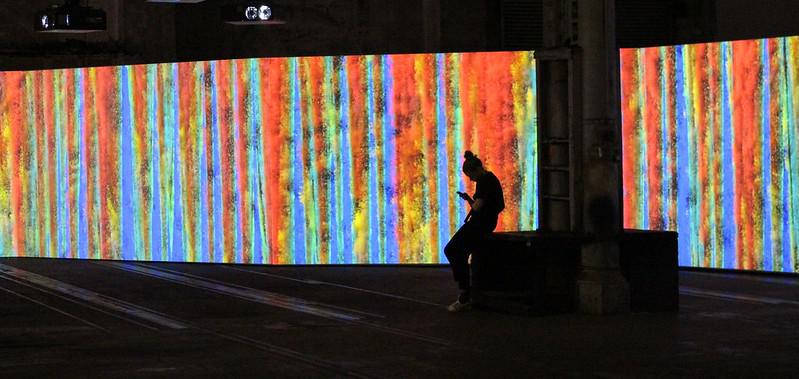

In [73]:
import base64

image_64_decode = base64.b64decode(missed_topics_with_images['b'].at[3,'image']) 
image_result = open('deer_decode.jpg', 'wb') # create a writable image and write the decoding result
image_result.write(image_64_decode)
from IPython.display import Image as IImage
IImage(filename='deer_decode.jpg') 

In [74]:
a_df = missed_topics_with_images['b'].iloc[[3]]
a_df

,caption,topic_id,topic,paragragh,image,image_link,website
3,Biennale Sydney at Carriageworks,309,"line, close, carriageworks, melbourne, rail, a...","From there we had a walk around Redfern, to se...",/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,https://farm1.staticflickr.com/974/42292831751...,https://www.danielbowen.com/2018/05/19/the-noi...


In [75]:
a_df.to_csv(f'pedestrian_sample.tsv', sep="\t", index=False)

# data for fse

In [150]:
def create_data(df, count):
    col = ['uniq_id', 'image_id', 'caption', 'topic_id', 'labels', 'image', 'topic2caption_sim', 'concept2caption_sim', 'caption_length']
    t_df = pd.DataFrame(columns=col)
    t_df['caption'] = df['alt'].apply(remove_special)
    t_df['topic_id'] = df['Topic']
    t_df['topic2caption_sim'] = df['topic2_caption_score']
    t_df['concept2caption_sim'] = df['concept2_caption_score']
    t_df['caption_length'] = df['caption_length']
    t_df['uniq_id'] = df.index + count
    t_df['image_id'] = df.index + count
    t_df['image'] = df['Image']
    t_df['labels'] = ' '
    t_df = t_df[t_df.image.notnull()]
    t_df = t_df.reset_index(drop=True)
    
    return t_df

In [151]:
missed_topics_with_images = dict()
count = 0
for el in missed_topics_dict:
    missed_topics_with_images[el] = create_data(missed_topics_dict[el], count)
    count = len(missed_topics_with_images[el])

In [152]:
missed_topics_with_images[el]

,uniq_id,image_id,caption,topic_id,labels,image,topic2caption_sim,concept2caption_sim,caption_length
0,2235,2235,Several hikers in a line following a path up t...,12,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.516751,0.214211,25
1,2236,2236,The view of Monte Porri from the Fossa delle F...,12,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.321975,0.148667,12
2,2237,2237,Sunbathers relaxing on a beach at Zingaro Natu...,12,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.127708,0.070039,12
3,2238,2238,West coast Passeggio Aretusa pedestrian walkway,12,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.390186,0.487281,6
4,2239,2239,Relaxing in the Sicilian sunshine with friends...,12,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.023291,-0.016580,14
...,...,...,...,...,...,...,...,...,...
2843,5222,5222,water next to gilchrist park during sunset doc...,296,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.262200,0.105148,12
2844,5223,5223,water along rocks on gilchrist beach with tree...,296,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.277304,0.065048,9
2845,5224,5224,along the harbor trees,296,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.212265,0.122179,4
2846,5225,5225,sand and palm trees along the water,296,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.106647,0.087923,7


In [153]:
s = 0
for el in missed_topics_with_images:
    missed_topics_with_images[el] = missed_topics_with_images[el].dropna(subset=['caption'])
    missed_topics_with_images[el]['topics']  = [el] * len(missed_topics_with_images[el])
    print(el, len(missed_topics_with_images[el]))
    s = s + len(missed_topics_with_images[el])
print(s)

a 3138
b 6027
c 3467
d 3595
e 2776
f 1006
g 1564
h 1957
i 4350
j 375
k 2481
l 681
m 1499
n 2223
o 2848
37987


In [154]:
missed_topics_with_images['a']

,uniq_id,image_id,caption,topic_id,labels,image,topic2caption_sim,concept2caption_sim,caption_length,topics
0,0,0,A pedestrian passes a colorful car rapide with...,68,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.390035,0.491275,32,a
1,1,1,A passenger looks out the window of a car rapi...,68,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.313948,0.349382,20,a
2,2,2,Moussa Sock has been driving a car rapide for ...,68,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.226676,0.151556,29,a
3,3,3,Driver Saliou appears in the mirror of his min...,68,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.276037,0.275092,26,a
4,4,4,bikes on board,68,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.144706,0.172105,3,a
...,...,...,...,...,...,...,...,...,...,...
3133,3315,3315,Crowded Asian commuters queuing at train stati...,224,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.441321,0.224544,29,a
3134,3316,3316,View of modern station platform of Tan Kah Kee...,224,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.444838,0.142629,31,a
3135,3317,3317,Singapore Train arrives at the Ang Mo Kio Stat...,224,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.429507,0.145196,23,a
3136,3318,3318,Singapore People waiting train at the station ...,224,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.444747,0.272419,17,a


In [155]:
scol = ['topic2caption_sim', 'concept2caption_sim', 'caption_length']
df_ = pd.DataFrame()
for el in missed_topics_with_images:
    df_ = pd.concat([df_, missed_topics_with_images[el]], ignore_index=True)
# df_
display(df_[scol].describe().round(2))

,topic2caption_sim,concept2caption_sim,caption_length
count,37987.00,37987.00,37987.00
mean,0.26,0.21,13.76
std,0.17,0.14,12.61
min,-0.20,-0.15,2.00
25%,0.12,0.12,5.00
50%,0.26,0.19,10.00
75%,0.39,0.29,19.00
max,0.83,0.83,510.00


In [156]:
scol = ['topic2caption_sim', 'concept2caption_sim', 'caption_length']
for el in missed_topics_with_images:
    print(el)
    display(missed_topics_with_images[el][scol].describe().round(2))

a


,topic2caption_sim,concept2caption_sim,caption_length
count,3138.00,3138.00,3138.00
mean,0.26,0.19,16.69
std,0.16,0.10,13.90
min,-0.20,-0.11,2.00
25%,0.13,0.13,7.00
50%,0.26,0.18,13.00
75%,0.38,0.24,24.00
max,0.71,0.80,212.00


b


,topic2caption_sim,concept2caption_sim,caption_length
count,6027.00,6027.00,6027.00
mean,0.24,0.23,13.39
std,0.15,0.15,15.55
min,-0.20,-0.11,2.00
25%,0.13,0.12,6.00
50%,0.24,0.20,10.00
75%,0.35,0.30,17.00
max,0.77,0.81,510.00


c


,topic2caption_sim,concept2caption_sim,caption_length
count,3467.00,3467.00,3467.00
mean,0.27,0.23,15.59
std,0.14,0.13,13.76
min,-0.12,-0.09,2.00
25%,0.17,0.14,6.00
50%,0.27,0.21,13.00
75%,0.37,0.29,21.00
max,0.75,0.76,140.00


d


,topic2caption_sim,concept2caption_sim,caption_length
count,3595.00,3595.00,3595.00
mean,0.38,0.29,13.25
std,0.19,0.15,11.92
min,-0.11,-0.09,2.00
25%,0.24,0.18,5.00
50%,0.40,0.26,10.00
75%,0.53,0.40,19.00
max,0.82,0.77,176.00


e


,topic2caption_sim,concept2caption_sim,caption_length
count,2776.00,2776.00,2776.00
mean,0.29,0.25,13.34
std,0.17,0.16,11.72
min,-0.09,-0.15,2.00
25%,0.15,0.14,6.00
50%,0.29,0.22,10.00
75%,0.41,0.35,19.00
max,0.78,0.83,141.00


f


,topic2caption_sim,concept2caption_sim,caption_length
count,1006.00,1006.00,1006.00
mean,0.23,0.16,14.66
std,0.19,0.10,12.22
min,-0.16,-0.08,2.00
25%,0.07,0.09,5.00
50%,0.21,0.16,11.00
75%,0.40,0.24,20.00
max,0.83,0.56,95.00


g


,topic2caption_sim,concept2caption_sim,caption_length
count,1564.00,1564.00,1564.00
mean,0.16,0.11,14.71
std,0.16,0.09,12.00
min,-0.19,-0.11,2.00
25%,0.04,0.05,7.00
50%,0.11,0.10,12.00
75%,0.28,0.15,21.00
max,0.66,0.51,164.00


h


,topic2caption_sim,concept2caption_sim,caption_length
count,1957.00,1957.00,1957.00
mean,0.23,0.26,14.52
std,0.14,0.16,10.82
min,-0.10,-0.10,2.00
25%,0.12,0.14,7.00
50%,0.22,0.23,12.00
75%,0.33,0.37,20.00
max,0.61,0.79,136.00


i


,topic2caption_sim,concept2caption_sim,caption_length
count,4350.00,4350.00,4350.00
mean,0.29,0.22,14.07
std,0.19,0.14,11.71
min,-0.12,-0.09,2.00
25%,0.13,0.10,5.00
50%,0.30,0.19,11.00
75%,0.45,0.33,19.00
max,0.83,0.76,210.00


j


,topic2caption_sim,concept2caption_sim,caption_length
count,375.00,375.00,375.00
mean,0.35,0.32,13.40
std,0.19,0.16,8.38
min,-0.08,-0.06,2.00
25%,0.22,0.22,7.00
50%,0.35,0.32,10.00
75%,0.47,0.46,19.00
max,0.80,0.70,33.00


k


,topic2caption_sim,concept2caption_sim,caption_length
count,2481.00,2481.00,2481.00
mean,0.30,0.21,12.35
std,0.17,0.10,8.94
min,-0.13,-0.12,2.00
25%,0.16,0.15,6.00
50%,0.33,0.21,11.00
75%,0.44,0.26,17.00
max,0.66,0.68,142.00


l


,topic2caption_sim,concept2caption_sim,caption_length
count,681.00,681.00,681.00
mean,0.15,0.19,10.20
std,0.13,0.16,10.87
min,-0.14,-0.10,2.00
25%,0.05,0.09,4.00
50%,0.11,0.16,8.00
75%,0.24,0.23,12.00
max,0.55,0.79,113.00


m


,topic2caption_sim,concept2caption_sim,caption_length
count,1499.00,1499.00,1499.00
mean,0.23,0.16,11.54
std,0.16,0.13,9.69
min,-0.16,-0.08,2.00
25%,0.10,0.09,5.00
50%,0.22,0.14,9.00
75%,0.36,0.21,15.00
max,0.71,0.78,123.00


n


,topic2caption_sim,concept2caption_sim,caption_length
count,2223.00,2223.00,2223.00
mean,0.11,0.14,15.14
std,0.12,0.11,12.95
min,-0.16,-0.11,2.00
25%,0.03,0.07,5.00
50%,0.09,0.12,11.00
75%,0.19,0.20,23.00
max,0.61,0.65,93.00


o


,topic2caption_sim,concept2caption_sim,caption_length
count,2848.00,2848.00,2848.00
mean,0.26,0.19,10.51
std,0.16,0.12,10.54
min,-0.14,-0.08,2.00
25%,0.14,0.11,4.00
50%,0.26,0.17,7.00
75%,0.36,0.24,13.00
max,0.80,0.68,154.00


In [157]:
for el in missed_topics_with_images:
    print(el)
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['topic2caption_sim'] >= avg_val]
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['concept2caption_sim'] >= top_val]
    missed_topics_with_images[el] = missed_topics_with_images[el].reset_index(drop=True)
    display(missed_topics_with_images[el][['topic2caption_sim', 'concept2caption_sim', 'caption_length']].describe().round(2))

a


,topic2caption_sim,concept2caption_sim,caption_length
count,67.00,67.00,67.00
mean,0.43,0.51,14.31
std,0.10,0.11,14.29
min,0.30,0.39,2.00
25%,0.35,0.43,5.50
50%,0.42,0.49,8.00
75%,0.49,0.55,22.00
max,0.71,0.80,90.00


b


,topic2caption_sim,concept2caption_sim,caption_length
count,510.00,510.00,510.00
mean,0.38,0.53,13.50
std,0.06,0.10,10.14
min,0.29,0.39,2.00
25%,0.32,0.45,6.00
50%,0.36,0.51,10.00
75%,0.42,0.58,17.00
max,0.68,0.81,71.00


c


,topic2caption_sim,concept2caption_sim,caption_length
count,429.00,429.00,429.00
mean,0.41,0.48,17.38
std,0.07,0.07,11.54
min,0.29,0.39,2.00
25%,0.36,0.43,9.00
50%,0.41,0.48,15.00
75%,0.45,0.52,24.00
max,0.75,0.76,76.00


d


,topic2caption_sim,concept2caption_sim,caption_length
count,910.00,910.00,910.00
mean,0.55,0.50,16.54
std,0.11,0.08,12.74
min,0.29,0.39,2.00
25%,0.48,0.44,7.00
50%,0.56,0.48,14.00
75%,0.62,0.54,24.00
max,0.82,0.77,176.00


e


,topic2caption_sim,concept2caption_sim,caption_length
count,534.00,534.00,534.00
mean,0.47,0.50,16.66
std,0.10,0.10,12.82
min,0.29,0.39,2.00
25%,0.39,0.42,7.00
50%,0.46,0.47,14.00
75%,0.54,0.55,24.00
max,0.77,0.83,112.00


f


,topic2caption_sim,concept2caption_sim,caption_length
count,17.00,17.00,17.00
mean,0.47,0.43,17.94
std,0.09,0.06,16.26
min,0.31,0.39,5.00
25%,0.44,0.39,7.00
50%,0.46,0.40,8.00
75%,0.49,0.43,32.00
max,0.64,0.56,55.00


g


,topic2caption_sim,concept2caption_sim,caption_length
count,1.00,1.00,1.0
mean,0.43,0.46,8.0
std,NaN,NaN,NaN
min,0.43,0.46,8.0
25%,0.43,0.46,8.0
50%,0.43,0.46,8.0
75%,0.43,0.46,8.0
max,0.43,0.46,8.0


h


,topic2caption_sim,concept2caption_sim,caption_length
count,241.00,241.00,241.00
mean,0.39,0.50,14.64
std,0.07,0.08,7.89
min,0.29,0.39,2.00
25%,0.34,0.44,9.00
50%,0.38,0.49,13.00
75%,0.44,0.55,20.00
max,0.61,0.79,42.00


i


,topic2caption_sim,concept2caption_sim,caption_length
count,527.00,527.00,527.00
mean,0.45,0.46,15.94
std,0.08,0.06,10.18
min,0.29,0.39,2.00
25%,0.39,0.41,9.00
50%,0.45,0.44,12.00
75%,0.51,0.49,22.00
max,0.69,0.76,84.00


j


,topic2caption_sim,concept2caption_sim,caption_length
count,108.00,108.00,108.00
mean,0.49,0.51,14.31
std,0.14,0.06,8.04
min,0.29,0.40,2.00
25%,0.36,0.46,8.00
50%,0.47,0.49,13.00
75%,0.60,0.54,21.00
max,0.80,0.70,30.00


k


,topic2caption_sim,concept2caption_sim,caption_length
count,71.00,71.00,71.00
mean,0.45,0.47,13.75
std,0.10,0.07,7.95
min,0.29,0.39,2.00
25%,0.37,0.42,8.00
50%,0.43,0.45,12.00
75%,0.52,0.51,18.50
max,0.66,0.65,35.00


l


,topic2caption_sim,concept2caption_sim,caption_length
count,45.00,45.00,45.00
mean,0.39,0.57,12.44
std,0.07,0.09,22.94
min,0.30,0.39,2.00
25%,0.33,0.51,4.00
50%,0.37,0.57,6.00
75%,0.43,0.63,9.00
max,0.55,0.79,113.00


m


,topic2caption_sim,concept2caption_sim,caption_length
count,86.00,86.00,86.00
mean,0.45,0.51,9.53
std,0.09,0.09,10.18
min,0.29,0.39,2.00
25%,0.37,0.42,6.00
50%,0.42,0.51,6.00
75%,0.52,0.57,10.00
max,0.71,0.78,75.00


n


,topic2caption_sim,concept2caption_sim,caption_length
count,52.00,52.00,52.00
mean,0.34,0.46,21.35
std,0.07,0.05,15.03
min,0.29,0.41,2.00
25%,0.32,0.43,14.00
50%,0.32,0.43,14.00
75%,0.33,0.47,28.25
max,0.61,0.65,73.00


o


,topic2caption_sim,concept2caption_sim,caption_length
count,143.00,143.00,143.00
mean,0.48,0.49,12.97
std,0.16,0.07,9.24
min,0.29,0.39,2.00
25%,0.35,0.43,5.00
50%,0.42,0.47,11.00
75%,0.57,0.53,17.50
max,0.78,0.64,52.00


In [158]:
df_ = pd.DataFrame()
for el in missed_topics_with_images:
    df_ = pd.concat([df_, missed_topics_with_images[el]], ignore_index=True)
# df_
display(df_[scol].describe().round(2))

,topic2caption_sim,concept2caption_sim,caption_length
count,3741.00,3741.00,3741.00
mean,0.46,0.50,15.60
std,0.11,0.08,11.69
min,0.29,0.39,2.00
25%,0.37,0.43,7.00
50%,0.44,0.48,13.00
75%,0.54,0.54,22.00
max,0.82,0.83,176.00


# Remove Test data

In [169]:
def get_portion(df, p1=72, p2=16, p3=12):
    s1 = df.sample(frac = p1/100)
    rest_part_1 = df.drop(s1.index)
    s2 = rest_part_1.sample(frac = p2/(100-p1))
    s3 = rest_part_1.drop(s2.index)
    return s1, s2, s3

In [171]:
names = ['uniq_id', 'image_id', 'caption', 'labels', 'image']

In [159]:
d_path = '.'
dft = pd.read_pickle(f'{d_path}/pd_base.pk')
dft

,uniq_id,image_id,caption,topic_id,labels,image,topic2caption_sim,concept2caption_sim,topics,tag,ofa_caption,gt,h_caption
0,167,167,Car on rural road vector Stock Photo,68,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.376758,0.212455,a,"{'passenger': 0, 'wheel': 1, 'vehicle': 1, 'wa...",a silhouette of a car parked in a field,wheel vehicle,A parked car in a remote area
1,184,184,Bus Only Lane Rendering Kuhio and Walina,112,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.392783,0.160691,a,"{'freight': 1, 'transportation': 1, 'traffic':...",a street with a bus and a white car on the road,freight transportation traffic transport tran...,Two individuals ride bikes on the bus-only rou...
2,187,187,Passenger boarding a bus on Bayshore,112,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.438588,0.197647,a,"{'freight': 1, 'transportation': 1, 'traffic':...",a person is getting on a bus at a bus stop,freight transportation traffic transport tran...,A bus stopped in the bus stop when a passenger...
3,192,192,Passenger boarding a bus on Bayshore,112,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.438588,0.197647,a,"{'freight': 1, 'transportation': 1, 'traffic':...",a person is getting on a bus at a bus stop,freight transportation traffic transport tran...,A bus stopped in the bus stop when a passenger...
4,209,209,Pedestrian Connections Congestion Strategy,112,,/9j/7gAOQWRvYmUAZAAAAAAA/9sAQwAIBgYHBgUIBwcHCQ...,0.612697,0.493012,a,"{'freight': 1, 'transportation': 1, 'traffic':...",a woman and a child in a wheelchair waiting fo...,freight transportation traffic transport cong...,A pedestrian with wheelchair waiting in the road
...,...,...,...,...,...,...,...,...,...,...,...,...,...
615,1228,1228,Westown Commons picnic shelter front view,296,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.395052,0.217862,o,"{'scenic': 0, 'recreation': 1, 'wilderness': 0...",a gazebo with picnic tables in a park,recreation park area,Shed in a park
616,1241,1241,Humboldt Alexander Von Park,296,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.415312,0.211162,o,"{'scenic': 1, 'recreation': 1, 'wilderness': 0...",a bridge over a river with a body of water,scenic recreation park area pedestrian,A bridge over a lake
617,1259,1259,photo of trees and the fenceline at Mason Hill...,296,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.446961,0.234170,o,"{'scenic': 1, 'recreation': 1, 'wilderness': 0...",a tree in a field next to a fence,scenic recreation park area,A park
618,1296,1296,Hogback Ridge Park,296,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.579372,0.235827,o,"{'scenic': 1, 'recreation': 1, 'wilderness': 0...",a person holding a camera on a pile of leaves,scenic recreation park area,Fallen leaves with food


In [160]:
gk = dft.groupby('topics')

In [161]:
def df2_df1__(df1, df2):
    cond = df2['image'].isin(df1['image'])
    df2.drop(df2[cond].index, inplace = True)
    return df2

In [162]:
for el in gk.groups.keys():
    print(len(missed_topics_with_images[el]))
    missed_topics_with_images[el] = df2_df1__(gk.get_group(el), missed_topics_with_images[el])
    missed_topics_with_images[el] = missed_topics_with_images[el].reset_index(drop=True)
    print(len(missed_topics_with_images[el]), el)
#     break

67
65 a
510
476 b
429
406 c
910
864 d
534
463 e
17
17 f
1
1 g
241
223 h
527
505 i
108
101 j
71
65 k
45
41 l
86
70 m
52
51 n
143
135 o


In [163]:
for el in missed_topics_with_images:
    print(el)
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['topic2caption_sim'] >= avg_val]
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['concept2caption_sim'] >= top_val]
    missed_topics_with_images[el] = missed_topics_with_images[el].reset_index(drop=True)
    display(missed_topics_with_images[el][['topic2caption_sim', 'concept2caption_sim', 'caption_length']].describe().round(2))

a


,topic2caption_sim,concept2caption_sim,caption_length
count,65.00,65.00,65.00
mean,0.42,0.51,14.62
std,0.10,0.11,14.40
min,0.30,0.39,2.00
25%,0.35,0.43,6.00
50%,0.40,0.48,9.00
75%,0.49,0.56,22.00
max,0.71,0.80,90.00


b


,topic2caption_sim,concept2caption_sim,caption_length
count,476.00,476.00,476.00
mean,0.37,0.53,13.60
std,0.07,0.10,10.30
min,0.29,0.39,2.00
25%,0.32,0.46,6.00
50%,0.36,0.51,10.00
75%,0.41,0.58,17.25
max,0.68,0.81,71.00


c


,topic2caption_sim,concept2caption_sim,caption_length
count,406.00,406.00,406.00
mean,0.41,0.48,17.40
std,0.07,0.07,11.45
min,0.29,0.39,2.00
25%,0.36,0.42,9.00
50%,0.41,0.47,15.00
75%,0.45,0.52,24.00
max,0.75,0.76,76.00


d


,topic2caption_sim,concept2caption_sim,caption_length
count,864.00,864.00,864.00
mean,0.55,0.50,16.42
std,0.11,0.08,12.66
min,0.29,0.39,2.00
25%,0.48,0.44,7.00
50%,0.55,0.48,14.00
75%,0.62,0.54,24.00
max,0.82,0.77,176.00


e


,topic2caption_sim,concept2caption_sim,caption_length
count,463.00,463.00,463.00
mean,0.46,0.51,16.41
std,0.10,0.10,13.05
min,0.29,0.39,2.00
25%,0.38,0.43,7.00
50%,0.44,0.48,13.00
75%,0.53,0.55,24.00
max,0.77,0.83,112.00


f


,topic2caption_sim,concept2caption_sim,caption_length
count,17.00,17.00,17.00
mean,0.47,0.43,17.94
std,0.09,0.06,16.26
min,0.31,0.39,5.00
25%,0.44,0.39,7.00
50%,0.46,0.40,8.00
75%,0.49,0.43,32.00
max,0.64,0.56,55.00


g


,topic2caption_sim,concept2caption_sim,caption_length
count,1.00,1.00,1.0
mean,0.43,0.46,8.0
std,NaN,NaN,NaN
min,0.43,0.46,8.0
25%,0.43,0.46,8.0
50%,0.43,0.46,8.0
75%,0.43,0.46,8.0
max,0.43,0.46,8.0


h


,topic2caption_sim,concept2caption_sim,caption_length
count,223.00,223.00,223.00
mean,0.39,0.51,14.49
std,0.07,0.08,7.95
min,0.29,0.39,2.00
25%,0.33,0.44,9.00
50%,0.38,0.49,13.00
75%,0.44,0.55,19.00
max,0.61,0.79,42.00


i


,topic2caption_sim,concept2caption_sim,caption_length
count,505.00,505.00,505.00
mean,0.45,0.46,16.07
std,0.08,0.06,10.31
min,0.29,0.39,2.00
25%,0.39,0.41,9.00
50%,0.45,0.44,12.00
75%,0.51,0.49,22.00
max,0.69,0.76,84.00


j


,topic2caption_sim,concept2caption_sim,caption_length
count,101.00,101.00,101.00
mean,0.48,0.51,14.76
std,0.13,0.06,8.11
min,0.29,0.40,2.00
25%,0.35,0.46,8.00
50%,0.45,0.49,13.00
75%,0.59,0.54,21.00
max,0.80,0.70,30.00


k


,topic2caption_sim,concept2caption_sim,caption_length
count,65.00,65.00,65.00
mean,0.44,0.47,13.88
std,0.09,0.07,8.00
min,0.29,0.39,3.00
25%,0.37,0.42,8.00
50%,0.43,0.46,12.00
75%,0.50,0.50,19.00
max,0.62,0.65,35.00


l


,topic2caption_sim,concept2caption_sim,caption_length
count,41.00,41.00,41.00
mean,0.39,0.57,7.85
std,0.07,0.10,7.03
min,0.30,0.39,2.00
25%,0.33,0.50,4.00
50%,0.37,0.57,6.00
75%,0.45,0.63,8.00
max,0.55,0.79,44.00


m


,topic2caption_sim,concept2caption_sim,caption_length
count,70.00,70.00,70.00
mean,0.43,0.50,10.43
std,0.10,0.09,11.05
min,0.29,0.39,2.00
25%,0.37,0.42,6.00
50%,0.40,0.50,7.00
75%,0.50,0.57,10.75
max,0.71,0.78,75.00


n


,topic2caption_sim,concept2caption_sim,caption_length
count,51.00,51.00,51.00
mean,0.34,0.46,21.49
std,0.07,0.05,15.14
min,0.29,0.41,2.00
25%,0.32,0.43,14.00
50%,0.32,0.43,14.00
75%,0.33,0.48,28.50
max,0.61,0.65,73.00


o


,topic2caption_sim,concept2caption_sim,caption_length
count,135.00,135.00,135.00
mean,0.48,0.49,13.13
std,0.16,0.08,9.34
min,0.29,0.39,2.00
25%,0.35,0.43,5.00
50%,0.42,0.47,11.00
75%,0.57,0.54,18.00
max,0.78,0.64,52.00


In [164]:
df_ = pd.DataFrame()
for el in missed_topics_with_images:
    df_ = pd.concat([df_, missed_topics_with_images[el]], ignore_index=True)
# df_
display(df_[scol].describe().round(2))

,topic2caption_sim,concept2caption_sim,caption_length
count,3483.00,3483.00,3483.00
mean,0.45,0.50,15.57
std,0.11,0.08,11.52
min,0.29,0.39,2.00
25%,0.36,0.43,7.00
50%,0.43,0.48,13.00
75%,0.53,0.54,22.00
max,0.82,0.83,176.00


## add missing concept:
avg sim is 0.29 and missing ones are: a, e, g, i, j

### based on sim

In [165]:
len_dict = {'a': 51, 'f': 16, 'g': 25, 'i': 70, 'j': 7, 'k': 41, 'l': 11, 'm': 25, 'n': 29, 'o':49}

In [166]:
missed_ones = ['a', 'f', 'g', 'i', 'j', 'k', 'l', 'm', 'n', 'o']
avg_val = 0.29
top_val = 0.39

In [167]:
for el in missed_ones:
    print(el)
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['topic2caption_sim'] >= avg_val]
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['concept2caption_sim'] >= top_val]
    missed_topics_with_images[el] = missed_topics_with_images[el].reset_index(drop=True)
    display(missed_topics_with_images[el][['topic2caption_sim', 'concept2caption_sim', 'caption_length']].describe().round(2))

a


,topic2caption_sim,concept2caption_sim,caption_length
count,65.00,65.00,65.00
mean,0.42,0.51,14.62
std,0.10,0.11,14.40
min,0.30,0.39,2.00
25%,0.35,0.43,6.00
50%,0.40,0.48,9.00
75%,0.49,0.56,22.00
max,0.71,0.80,90.00


f


,topic2caption_sim,concept2caption_sim,caption_length
count,17.00,17.00,17.00
mean,0.47,0.43,17.94
std,0.09,0.06,16.26
min,0.31,0.39,5.00
25%,0.44,0.39,7.00
50%,0.46,0.40,8.00
75%,0.49,0.43,32.00
max,0.64,0.56,55.00


g


,topic2caption_sim,concept2caption_sim,caption_length
count,1.00,1.00,1.0
mean,0.43,0.46,8.0
std,NaN,NaN,NaN
min,0.43,0.46,8.0
25%,0.43,0.46,8.0
50%,0.43,0.46,8.0
75%,0.43,0.46,8.0
max,0.43,0.46,8.0


i


,topic2caption_sim,concept2caption_sim,caption_length
count,505.00,505.00,505.00
mean,0.45,0.46,16.07
std,0.08,0.06,10.31
min,0.29,0.39,2.00
25%,0.39,0.41,9.00
50%,0.45,0.44,12.00
75%,0.51,0.49,22.00
max,0.69,0.76,84.00


j


,topic2caption_sim,concept2caption_sim,caption_length
count,101.00,101.00,101.00
mean,0.48,0.51,14.76
std,0.13,0.06,8.11
min,0.29,0.40,2.00
25%,0.35,0.46,8.00
50%,0.45,0.49,13.00
75%,0.59,0.54,21.00
max,0.80,0.70,30.00


k


,topic2caption_sim,concept2caption_sim,caption_length
count,65.00,65.00,65.00
mean,0.44,0.47,13.88
std,0.09,0.07,8.00
min,0.29,0.39,3.00
25%,0.37,0.42,8.00
50%,0.43,0.46,12.00
75%,0.50,0.50,19.00
max,0.62,0.65,35.00


l


,topic2caption_sim,concept2caption_sim,caption_length
count,41.00,41.00,41.00
mean,0.39,0.57,7.85
std,0.07,0.10,7.03
min,0.30,0.39,2.00
25%,0.33,0.50,4.00
50%,0.37,0.57,6.00
75%,0.45,0.63,8.00
max,0.55,0.79,44.00


m


,topic2caption_sim,concept2caption_sim,caption_length
count,70.00,70.00,70.00
mean,0.43,0.50,10.43
std,0.10,0.09,11.05
min,0.29,0.39,2.00
25%,0.37,0.42,6.00
50%,0.40,0.50,7.00
75%,0.50,0.57,10.75
max,0.71,0.78,75.00


n


,topic2caption_sim,concept2caption_sim,caption_length
count,51.00,51.00,51.00
mean,0.34,0.46,21.49
std,0.07,0.05,15.14
min,0.29,0.41,2.00
25%,0.32,0.43,14.00
50%,0.32,0.43,14.00
75%,0.33,0.48,28.50
max,0.61,0.65,73.00


o


,topic2caption_sim,concept2caption_sim,caption_length
count,135.00,135.00,135.00
mean,0.48,0.49,13.13
std,0.16,0.08,9.34
min,0.29,0.39,2.00
25%,0.35,0.43,5.00
50%,0.42,0.47,11.00
75%,0.57,0.54,18.00
max,0.78,0.64,52.00


In [168]:
df_ = pd.DataFrame()
for el in missed_ones:
    df_ = pd.concat([df_, missed_topics_with_images[el]], ignore_index=True)
# df_
display(df_[scol].describe().round(2))

,topic2caption_sim,concept2caption_sim,caption_length
count,1051.00,1051.00,1051.00
mean,0.44,0.48,14.93
std,0.11,0.08,10.80
min,0.29,0.39,2.00
25%,0.36,0.42,7.00
50%,0.43,0.46,12.00
75%,0.51,0.52,20.00
max,0.80,0.80,90.00


In [170]:
name_lsit = ['stage1_train', 'stage2_train', 'val']
por_dict = dict()
data_dict = dict()
for n in name_lsit:
    data_dict[n] = pd.DataFrame() 
for el in missed_ones:
    s1, s2, v = get_portion(missed_topics_with_images[el])
    
    s1 = s1.reset_index(drop=True)
    data_dict['stage1_train'] = pd.concat([data_dict['stage1_train'], s1], ignore_index=True)
    
    s2 = s2.reset_index(drop=True)
    data_dict['stage2_train'] = pd.concat([data_dict['stage2_train'], s2], ignore_index=True)
    
    v = v.reset_index(drop=True)
    data_dict['val'] = pd.concat([data_dict['val'], v], ignore_index=True)
#     data_dict[el] = por_dict

In [172]:
print(len(data_dict['stage1_train']))
print(len(data_dict['stage2_train']))
print(len(data_dict['val']))

758
167
126


In [173]:
! mkdir -p /raid/AISSEL/htest/datasets/ped_data/ped_ftest/missed_q50_over_avg
saved_path = '/raid/AISSEL/htest/datasets/ped_data/ped_ftest/missed_q50_over_avg'
for el in data_dict:
    name = f'caption_{el}.tsv'
    df_s = data_dict[el][names]
    df_s.to_csv(f'{saved_path}/{name}', sep="\t", index=False, header=False)

    print(name)

caption_stage1_train.tsv
caption_stage2_train.tsv
caption_val.tsv


### based on cider

In [174]:
missed_ones = ['f', 'g', 'h', 'j', 'l','n']
avg_val = 0.29
top_val = 0.39

In [175]:
for el in missed_ones:
    print(el)
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['topic2caption_sim'] >= avg_val]
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['concept2caption_sim'] >= top_val]
    missed_topics_with_images[el] = missed_topics_with_images[el].reset_index(drop=True)
    display(missed_topics_with_images[el][['topic2caption_sim', 'concept2caption_sim', 'caption_length']].describe().round(2))

f


,topic2caption_sim,concept2caption_sim,caption_length
count,17.00,17.00,17.00
mean,0.47,0.43,17.94
std,0.09,0.06,16.26
min,0.31,0.39,5.00
25%,0.44,0.39,7.00
50%,0.46,0.40,8.00
75%,0.49,0.43,32.00
max,0.64,0.56,55.00


g


,topic2caption_sim,concept2caption_sim,caption_length
count,1.00,1.00,1.0
mean,0.43,0.46,8.0
std,NaN,NaN,NaN
min,0.43,0.46,8.0
25%,0.43,0.46,8.0
50%,0.43,0.46,8.0
75%,0.43,0.46,8.0
max,0.43,0.46,8.0


h


,topic2caption_sim,concept2caption_sim,caption_length
count,223.00,223.00,223.00
mean,0.39,0.51,14.49
std,0.07,0.08,7.95
min,0.29,0.39,2.00
25%,0.33,0.44,9.00
50%,0.38,0.49,13.00
75%,0.44,0.55,19.00
max,0.61,0.79,42.00


j


,topic2caption_sim,concept2caption_sim,caption_length
count,101.00,101.00,101.00
mean,0.48,0.51,14.76
std,0.13,0.06,8.11
min,0.29,0.40,2.00
25%,0.35,0.46,8.00
50%,0.45,0.49,13.00
75%,0.59,0.54,21.00
max,0.80,0.70,30.00


l


,topic2caption_sim,concept2caption_sim,caption_length
count,41.00,41.00,41.00
mean,0.39,0.57,7.85
std,0.07,0.10,7.03
min,0.30,0.39,2.00
25%,0.33,0.50,4.00
50%,0.37,0.57,6.00
75%,0.45,0.63,8.00
max,0.55,0.79,44.00


n


,topic2caption_sim,concept2caption_sim,caption_length
count,51.00,51.00,51.00
mean,0.34,0.46,21.49
std,0.07,0.05,15.14
min,0.29,0.41,2.00
25%,0.32,0.43,14.00
50%,0.32,0.43,14.00
75%,0.33,0.48,28.50
max,0.61,0.65,73.00


In [176]:
df_ = pd.DataFrame()
for el in missed_ones:
    df_ = pd.concat([df_, missed_topics_with_images[el]], ignore_index=True)
# df_
display(df_[scol].describe().round(2))

,topic2caption_sim,concept2caption_sim,caption_length
count,434.00,434.00,434.00
mean,0.41,0.50,14.87
std,0.10,0.08,9.94
min,0.29,0.39,2.00
25%,0.33,0.44,8.00
50%,0.38,0.49,13.00
75%,0.46,0.55,19.75
max,0.80,0.79,73.00


In [177]:
name_lsit = ['stage1_train', 'stage2_train', 'val']
por_dict = dict()
data_dict = dict()
for n in name_lsit:
    data_dict[n] = pd.DataFrame() 
for el in missed_ones:
    s1, s2, v = get_portion(missed_topics_with_images[el])
    
    s1 = s1.reset_index(drop=True)
    data_dict['stage1_train'] = pd.concat([data_dict['stage1_train'], s1], ignore_index=True)
    
    s2 = s2.reset_index(drop=True)
    data_dict['stage2_train'] = pd.concat([data_dict['stage2_train'], s2], ignore_index=True)
    
    v = v.reset_index(drop=True)
    data_dict['val'] = pd.concat([data_dict['val'], v], ignore_index=True)
#     data_dict[el] = por_dict

In [178]:
print(len(data_dict['stage1_train']))
print(len(data_dict['stage2_train']))
print(len(data_dict['val']))

314
68
52


In [179]:
! mkdir -p /raid/AISSEL/htest/datasets/ped_data/ped_ftest/missed_q50_over_avg_cider
saved_path = '/raid/AISSEL/htest/datasets/ped_data/ped_ftest/missed_q50_over_avg_cider'
for el in data_dict:
    name = f'caption_{el}.tsv'
    df_s = data_dict[el][names]
    df_s.to_csv(f'{saved_path}/{name}', sep="\t", index=False, header=False)

    print(name)

caption_stage1_train.tsv
caption_stage2_train.tsv
caption_val.tsv


### CIDEr web

In [183]:
missed_ones = ['e', 'f', 'g', 'h', 'j', 'm','n']
avg_val = 0.29
top_val = 0.39

In [184]:
for el in missed_ones:
    print(el)
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['topic2caption_sim'] >= avg_val]
    missed_topics_with_images[el] = missed_topics_with_images[el][missed_topics_with_images[el]['concept2caption_sim'] >= top_val]
    missed_topics_with_images[el] = missed_topics_with_images[el].reset_index(drop=True)
    display(missed_topics_with_images[el][['topic2caption_sim', 'concept2caption_sim', 'caption_length']].describe().round(2))

e


,topic2caption_sim,concept2caption_sim,caption_length
count,463.00,463.00,463.00
mean,0.46,0.51,16.41
std,0.10,0.10,13.05
min,0.29,0.39,2.00
25%,0.38,0.43,7.00
50%,0.44,0.48,13.00
75%,0.53,0.55,24.00
max,0.77,0.83,112.00


f


,topic2caption_sim,concept2caption_sim,caption_length
count,17.00,17.00,17.00
mean,0.47,0.43,17.94
std,0.09,0.06,16.26
min,0.31,0.39,5.00
25%,0.44,0.39,7.00
50%,0.46,0.40,8.00
75%,0.49,0.43,32.00
max,0.64,0.56,55.00


g


,topic2caption_sim,concept2caption_sim,caption_length
count,1.00,1.00,1.0
mean,0.43,0.46,8.0
std,NaN,NaN,NaN
min,0.43,0.46,8.0
25%,0.43,0.46,8.0
50%,0.43,0.46,8.0
75%,0.43,0.46,8.0
max,0.43,0.46,8.0


h


,topic2caption_sim,concept2caption_sim,caption_length
count,223.00,223.00,223.00
mean,0.39,0.51,14.49
std,0.07,0.08,7.95
min,0.29,0.39,2.00
25%,0.33,0.44,9.00
50%,0.38,0.49,13.00
75%,0.44,0.55,19.00
max,0.61,0.79,42.00


j


,topic2caption_sim,concept2caption_sim,caption_length
count,101.00,101.00,101.00
mean,0.48,0.51,14.76
std,0.13,0.06,8.11
min,0.29,0.40,2.00
25%,0.35,0.46,8.00
50%,0.45,0.49,13.00
75%,0.59,0.54,21.00
max,0.80,0.70,30.00


m


,topic2caption_sim,concept2caption_sim,caption_length
count,70.00,70.00,70.00
mean,0.43,0.50,10.43
std,0.10,0.09,11.05
min,0.29,0.39,2.00
25%,0.37,0.42,6.00
50%,0.40,0.50,7.00
75%,0.50,0.57,10.75
max,0.71,0.78,75.00


n


,topic2caption_sim,concept2caption_sim,caption_length
count,51.00,51.00,51.00
mean,0.34,0.46,21.49
std,0.07,0.05,15.14
min,0.29,0.41,2.00
25%,0.32,0.43,14.00
50%,0.32,0.43,14.00
75%,0.33,0.48,28.50
max,0.61,0.65,73.00


In [185]:
df_l = pd.DataFrame()
for el in missed_ones:
    df_l = pd.concat([df_l, missed_topics_with_images[el]], ignore_index=True)
# df_
display(df_l[['topic2caption_sim', 'concept2caption_sim']].describe().round(2))

,topic2caption_sim,concept2caption_sim
count,926.00,926.00
mean,0.44,0.50
std,0.10,0.09
min,0.29,0.39
25%,0.35,0.43
50%,0.42,0.48
75%,0.50,0.54
max,0.80,0.83


In [187]:
name_lsit = ['stage1_train', 'stage2_train', 'val']
por_dict = dict()
data_dict = dict()
for n in name_lsit:
    data_dict[n] = pd.DataFrame() 
for el in missed_ones:
    s1, s2, v = get_portion(missed_topics_with_images[el])
    
    s1 = s1.reset_index(drop=True)
    data_dict['stage1_train'] = pd.concat([data_dict['stage1_train'], s1], ignore_index=True)
    
    s2 = s2.reset_index(drop=True)
    data_dict['stage2_train'] = pd.concat([data_dict['stage2_train'], s2], ignore_index=True)
    
    v = v.reset_index(drop=True)
    data_dict['val'] = pd.concat([data_dict['val'], v], ignore_index=True)
#     data_dict[el] = por_dict

In [188]:
print(len(data_dict['stage1_train']))
print(len(data_dict['stage2_train']))
print(len(data_dict['val']))

667
147
112


In [189]:
! mkdir -p /raid/AISSEL/htest/datasets/ped_data/ped_ftest/missed_q50_over_avg_cider_web
saved_path = '/raid/AISSEL/htest/datasets/ped_data/ped_ftest/missed_q50_over_avg_cider_web'
for el in data_dict:
    name = f'caption_{el}.tsv'
    df_s = data_dict[el][names]
    df_s.to_csv(f'{saved_path}/{name}', sep="\t", index=False, header=False)

    print(name)

caption_stage1_train.tsv
caption_stage2_train.tsv
caption_val.tsv


## Recalculate the sim

In [78]:
df_ = pd.DataFrame()
for el in missed_topics_with_images:
    df_ = pd.concat([df_, missed_topics_with_images[el]], ignore_index=True)
# df_
display(df_[scol].describe().round(2))

,topic2caption_sim,concept2caption_sim,caption_length
count,5595.00,5595.00,5595.00
mean,0.47,0.42,16.01
std,0.13,0.10,16.54
min,0.18,0.18,2.00
25%,0.38,0.35,6.00
50%,0.47,0.41,11.00
75%,0.57,0.48,22.00
max,0.82,0.84,206.00


In [123]:
0.08 * 8997

719.76

In [124]:
0.08 * 6013

481.04

In [79]:
for el in missed_topics_with_images:
    print(el)
    display(missed_topics_with_images[el][['topic2caption_sim', 'concept2caption_sim', 'caption_length']].describe().round(2))

a


,topic2caption_sim,concept2caption_sim,caption_length
count,115.00,115.00,115.00
mean,0.53,0.33,11.50
std,0.06,0.07,10.61
min,0.45,0.22,2.00
25%,0.48,0.27,4.00
50%,0.53,0.32,6.00
75%,0.57,0.38,12.00
max,0.71,0.55,44.00


b


,topic2caption_sim,concept2caption_sim,caption_length
count,452.00,452.00,452.00
mean,0.53,0.46,15.24
std,0.06,0.08,8.83
min,0.42,0.33,2.00
25%,0.48,0.40,8.00
50%,0.52,0.45,13.00
75%,0.56,0.51,21.25
max,0.73,0.84,54.00


c


,topic2caption_sim,concept2caption_sim,caption_length
count,514.00,514.00,514.00
mean,0.41,0.50,13.35
std,0.07,0.09,13.12
min,0.20,0.33,2.00
25%,0.38,0.43,8.00
50%,0.41,0.53,8.00
75%,0.44,0.56,18.00
max,0.68,0.83,103.00


d


,topic2caption_sim,concept2caption_sim,caption_length
count,654.00,654.00,654.00
mean,0.37,0.42,9.97
std,0.10,0.10,13.56
min,0.20,0.24,2.00
25%,0.29,0.34,3.00
50%,0.36,0.41,6.00
75%,0.44,0.52,12.00
max,0.69,0.79,198.00


e


,topic2caption_sim,concept2caption_sim,caption_length
count,659.00,659.00,659.00
mean,0.50,0.42,20.48
std,0.12,0.08,21.88
min,0.18,0.28,2.00
25%,0.43,0.36,5.00
50%,0.50,0.41,13.00
75%,0.58,0.46,26.00
max,0.82,0.81,121.00


f


,topic2caption_sim,concept2caption_sim,caption_length
count,497.00,497.00,497.00
mean,0.37,0.34,9.37
std,0.14,0.11,10.25
min,0.18,0.18,2.00
25%,0.25,0.24,3.00
50%,0.33,0.34,7.00
75%,0.47,0.41,11.00
max,0.82,0.84,81.00


g


,topic2caption_sim,concept2caption_sim,caption_length
count,166.00,166.00,166.00
mean,0.41,0.43,9.14
std,0.09,0.10,7.58
min,0.19,0.23,2.00
25%,0.36,0.36,4.00
50%,0.42,0.43,7.00
75%,0.48,0.48,12.00
max,0.63,0.71,55.00


h


,topic2caption_sim,concept2caption_sim,caption_length
count,1424.00,1424.00,1424.00
mean,0.56,0.40,22.12
std,0.11,0.07,20.14
min,0.25,0.25,2.00
25%,0.50,0.35,8.00
50%,0.58,0.39,18.00
75%,0.63,0.45,28.00
max,0.81,0.72,206.00


i


,topic2caption_sim,concept2caption_sim,caption_length
count,286.00,286.00,286.00
mean,0.41,0.40,14.97
std,0.10,0.11,15.09
min,0.24,0.25,2.00
25%,0.33,0.30,5.00
50%,0.39,0.39,10.00
75%,0.48,0.46,21.00
max,0.68,0.84,104.00


j


,topic2caption_sim,concept2caption_sim,caption_length
count,828.00,828.00,828.00
mean,0.46,0.43,15.12
std,0.12,0.09,12.42
min,0.22,0.28,2.00
25%,0.37,0.36,7.00
50%,0.46,0.42,12.00
75%,0.56,0.48,22.00
max,0.76,0.74,156.00


In [80]:
s = 0
for el in missed_topics_with_images:
    s = s + len(missed_topics_with_images[el])
print(s)

5595


In [81]:
 
def get_portion(df, p1=72, p2=16, p3=12):
    s1 = df.sample(frac = p1/100)
    rest_part_1 = df.drop(s1.index)
    s2 = rest_part_1.sample(frac = p2/(100-p1))
    s3 = rest_part_1.drop(s2.index)
    return s1, s2, s3

In [82]:
name_lsit = ['stage1_train', 'stage2_train', 'val']
por_dict = dict()
data_dict = dict()
for n in name_lsit:
    data_dict[n] = pd.DataFrame() 
for el in missed_topics_with_images:
    s1, s2, v = get_portion(missed_topics_with_images[el])
    
    s1 = s1.reset_index(drop=True)
    data_dict['stage1_train'] = pd.concat([data_dict['stage1_train'], s1], ignore_index=True)
    
    s2 = s2.reset_index(drop=True)
    data_dict['stage2_train'] = pd.concat([data_dict['stage2_train'], s2], ignore_index=True)
    
    v = v.reset_index(drop=True)
    data_dict['val'] = pd.concat([data_dict['val'], v], ignore_index=True)
#     data_dict[el] = por_dict

In [83]:
666/5558

0.11982727599856063

In [84]:
len(data_dict['stage1_train'])

3971

In [85]:
len(data_dict['stage2_train'])

883

In [88]:
len(data_dict['val'])

662

In [91]:
( 3971 / 6024)* 100

65.91965471447543

In [92]:
( 883 / 6024)* 100

14.658034528552458

In [93]:
( 662 / 6024)* 100

10.98937583001328

In [94]:
( 508 / 6024)* 100

8.432934926958831

In [89]:
3971 + 883 + 662 

5516

In [90]:
5516 + 508

6024

In [88]:
for el in data_dict:
    print(el)

stage1_train
stage2_train
val


In [89]:
! mkdir -p /raid/AISSEL/htest/datasets/av_data/ftest/all_q50
saved_path = '/raid/AISSEL/htest/datasets/av_data/ftest/all_q50'
for el in data_dict:
    name = f'caption_{el}_all_topics_av.tsv'
    df_s = data_dict[el][names]
    df_s.to_csv(f'{saved_path}/{name}', sep="\t", index=False, header=False)

    print(name)

caption_stage1_train_all_topics_av.tsv
caption_stage2_train_all_topics_av.tsv
caption_val_all_topics_av.tsv


In [83]:
## con_avg: 42
# missed  a, e, f, h, i,

In [116]:
def get_portion(df, p1=70, p2=14, p3=8, p4=8):
    s1 = df.sample(frac = p1/100)
    rest_part_1 = df.drop(s1.index)
    s2 = rest_part_1.sample(frac = p2/(100-p1))
    rest_part_2 = rest_part_1.drop(s2.index)
    s3 = rest_part_2.sample(frac = p3/(100 - p1 - p2))
    s4 = rest_part_2.drop(s3.index)
    return s1, s2, s3, s4

In [117]:
name_lsit = ['stage1_train', 'stage2_train', 'val', 'test']
por_dict = dict()
data_dict = dict()
for n in name_lsit:
    data_dict[n] = pd.DataFrame() 
for el in missed_topics_with_images:
    s1, s2, v, t = get_portion(missed_topics_with_images[el])
    
    s1 = s1.reset_index(drop=True)
    data_dict['stage1_train'] = pd.concat([data_dict['stage1_train'], s1], ignore_index=True)
    
    s2 = s2.reset_index(drop=True)
    data_dict['stage2_train'] = pd.concat([data_dict['stage2_train'], s2], ignore_index=True)
    
    t = t.reset_index(drop=True)
    data_dict['test'] = pd.concat([data_dict['test'], t], ignore_index=True)
    
    v = v.reset_index(drop=True)
    data_dict['val'] = pd.concat([data_dict['val'], v], ignore_index=True)
#     data_dict[el] = por_dict

In [118]:
len(data_dict['stage1_train'])

4208

In [119]:
len(data_dict['stage2_train'])

843

In [120]:
len(data_dict['test'])

482

In [121]:
len(data_dict['val'])

480

In [90]:
names = ['uniq_id', 'image_id', 'caption', 'labels', 'image']

In [91]:
! mkdir -p /raid/AISSEL/htest/datasets/av_data/ftest/all

In [92]:
saved_path = '/raid/AISSEL/htest/datasets/av_data/ftest/all'
for el in data_dict:
    name = f'caption_{el}_all_topics_av.tsv'
    df_s = data_dict[el][names]
    df_s.to_csv(f'{saved_path}/{name}', sep="\t", index=False, header=False)

    print(name)

caption_stage1_train_all_topics_av.tsv
caption_stage2_train_all_topics_av.tsv
caption_val_all_topics_av.tsv
caption_test_all_topics_av.tsv


### save just missing one !

missed a, e, f, h, i,

In [91]:
sel_list = ['a', 'e', 'f', 'h', 'i']
miss_list = ['a', 'e', 'f', 'h', 'i']

In [92]:
sel_topics_dict = dict()
for el in miss_list:
    sel_topics_dict[el] = pg_dict[el]

In [93]:
for el in sel_topics_dict:
    sel_topics_dict[el] = sel_topics_dict[el]
    sel_topics_dict[el] = sel_topics_dict[el].drop_duplicates(keep=False)
    sel_topics_dict[el] = sel_topics_dict[el].reset_index(drop=True)

In [94]:
for el in sel_topics_dict:
    print(el, len(sel_topics_dict[el]))

a 142
e 856
f 581
h 1845
i 336


In [95]:
sorted_key = []
for k in sorted(sel_topics_dict, key=lambda k: len(sel_topics_dict[k])):
    print(k, len(sel_topics_dict[k]))
    sorted_key.append(k)

a 142
i 336
f 581
e 856
h 1845


In [96]:
for idx, k in enumerate(sorted_key):
    print(sorted_key[idx:], k)
    for el in sorted_key[idx:]:
        if el == k:
            continue
        print(f'we are going to calc: {el} - {k}')
        sel_topics_dict[el] = df2_df1(sel_topics_dict[k], sel_topics_dict[el])
#     break

['a', 'i', 'f', 'e', 'h'] a
we are going to calc: i - a
we are going to calc: f - a
we are going to calc: e - a
we are going to calc: h - a
['i', 'f', 'e', 'h'] i
we are going to calc: f - i
we are going to calc: e - i
we are going to calc: h - i
['f', 'e', 'h'] f
we are going to calc: e - f
we are going to calc: h - f
['e', 'h'] e
we are going to calc: h - e
['h'] h


In [99]:
sorted_key = []
for k in sorted(sel_topics_dict, key=lambda k: len(sel_topics_dict[k])):
    print(k, len(sel_topics_dict[k]))
    sorted_key.append(k)

a 142
i 336
f 577
e 855
h 1742


In [98]:
sel_topics_dict[el]

,Topic,Number of link,website,Image link,Image,alt,title,Paragragh,caption_length,topic2_caption_score,concept2_caption_score
0,145,10,https://www.diecastairplane.com/aeroflot-sovie...,https://www.diecastairplane.com/resize/Shared/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Aeroflot Soviet Airlines Tu-134A CCCP-65134 1:400,NaN,New!\n\n\n\n\nAeroflot Soviet Airlines Tu-134A...,6,0.589005,0.432472
1,145,12,https://www.airlinemuseum.com/store/c/116-1-40...,https://www.airlinemuseum.com/resize/Shared/im...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Aeroflot A320neo RA-73733 (1:400),NaN,Preorder!\n\n\n\n\n\n\n\n\nAeroflot A320neo RA...,4,0.501740,0.366970
2,145,15,https://simpleflying.com/aeroflot-superjet-eng...,https://static1.simpleflyingimages.com/wordpre...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Aeroflot-Sukhoi-superjet-100s-ra89105-engine f...,NaN,"':""""}function we(e){var n=!(arguments.length>1...",2,0.525862,0.292505
3,145,19,https://www.diecastairplane.com/aeroflot-russi...,https://www.diecastairplane.com/resize/Shared/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Aeroflot - Russian Airlines DC-10-40(F) VP-BDF...,NaN,Aeroflot Russian Airlines DC-10-40(F) VP-BDF (...,7,0.674462,0.491232
4,145,20,https://www.diecastairplane.com/aeroflot-russi...,https://www.diecastairplane.com/resize/Shared/...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,Aeroflot - Russian Airlines A350-900 VP-BXD (1...,NaN,New!\n\n\n\n\nAeroflot Russian Airlines A350-9...,7,0.673831,0.483836
...,...,...,...,...,...,...,...,...,...,...,...
1840,295,97,https://www.jetphotos.com/country/Malaysia,https://cdn.jetphotos.com/400/5/34135_16586626...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,9M-MTJ - Airbus A330-323 - Malaysia Airlines,Photo of 9M-MTJ - Airbus A330-323 - Malaysia A...,waiping\n\n\nAirbus A330-323\n\n\n\n9M-MTJ ful...,7,0.645954,0.366934
1841,295,97,https://www.jetphotos.com/country/Malaysia,https://cdn.jetphotos.com/400/5/73645_16598676...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,9M-LRD - Boeing 737-8 MAX - Batik Air Malaysia,Photo of 9M-LRD - Boeing 737-8 MAX - Batik Air...,Prestley Shim\n\n\nBoeing 737-8 MAX\n\n\n\n9M-...,9,0.578407,0.444647
1842,295,97,https://www.jetphotos.com/country/Malaysia,https://cdn.jetphotos.com/400/6/38665_16598548...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,9N-ALM - Airbus A320-214 - Himalaya Airlines,Photo of 9N-ALM - Airbus A320-214 - Himalaya A...,Lzl\n\n\nAirbus A320-214\n\n\n\n9N-ALM photos\...,7,0.620622,0.488442
1843,295,97,https://www.jetphotos.com/country/Malaysia,https://cdn.jetphotos.com/400/5/17292_16597916...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,9M-AQY - Airbus A320-216 - AirAsia,Photo of 9M-AQY - Airbus A320-216 - AirAsia,Luo Chun Hui\n\n\nAirbus A320-216\n\n\n\n9M-AQ...,6,0.538693,0.420767


In [100]:
sel_topics_with_images = dict()
count = 0
for el in sel_topics_dict:
    sel_topics_with_images[el] = create_data(sel_topics_dict[el], count)
    count = len(sel_topics_with_images[el])

In [101]:
d_path = '/raid/AISSEL/htest/datasets/av_data/ftest'
dft = pd.read_pickle(f'{d_path}/df_av_test_after_tags.pk')
dft

,uniq_id,image_id,caption,topic_id,labels,image,topic2caption_sim,concept2caption_sim,topics,tag,ofa_caption,gt
0,4,4,Firefighting Drones,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.512088,0.489315,a,"{'aircraft': 0, 'drone': 0, 'sensor': 0, 'uav'...",Airmen with a drone in front of a gas pipeline,uav uavs unmanned uas
1,27,27,DJI mavic 2 pro in flight,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.506123,0.303162,a,"{'aircraft': 0, 'drone': 1, 'sensor': 0, 'uav'...",Cessna A drone flying in the air,drone uav uavs unmanned uas
2,51,51,A small UAS is seen flying during at the US Ar...,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.456664,0.440849,a,"{'aircraft': 0, 'drone': 1, 'sensor': 0, 'uav'...",A drone flies through the air with arrows in t...,drone uav uavs unmanned uas
3,102,102,Ruko F11 GIM2 Drone with Camera for Adults 4K ...,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.425304,0.273581,a,"{'aircraft': 0, 'drone': 1, 'sensor': 0, 'uav'...",Cessna B17 with 4 Drones and 4 Brones with 4 d,drone uav uavs unmanned uas
4,130,130,The MQ9 Reaper,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.246585,0.226430,a,"{'aircraft': 0, 'drone': 1, 'sensor': 0, 'uav'...",Cessna B17 B17 in flight,drone uav uavs unmanned uas
...,...,...,...,...,...,...,...,...,...,...,...,...
677,1931,1931,In our globalized world aviation increasingly ...,220,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.265668,0.481348,j,"{'aircraft': 1, 'airline': 1, 'tower': 0, '911...",Airports logo on the door of an airplane,aircraft airline
678,1947,1947,Lufthansa Business Class on longhaul aircraft,220,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.333263,0.526307,j,"{'aircraft': 1, 'airline': 1, 'tower': 0, '911...",A passenger sleeps in the aisle of an airplane,aircraft airline flight
679,1969,1969,The Boeing 7478 has inherited the good looks o...,220,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.309636,0.431361,j,"{'aircraft': 1, 'airline': 1, 'tower': 0, '911...",Lufthansa is the worlds largest airline,aircraft airline plane flight
680,1979,1979,911 Attacks Pentagon,220,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.655778,0.354867,j,"{'aircraft': 1, 'airline': 0, 'tower': 0, '911...",A painting of two pilots in a cockpit with a f...,aircraft pentagon plane flight


In [102]:
dff_t = dft.copy()


In [103]:
def get_dup(top):
    dff_h = dff_t[dff_t['topics'] == top]
    df_f = sel_topics_with_images[top]
    h_idx = []
    for index, row in tqdm(dff_h.iterrows(), total=dff_h.shape[0]):
        res = df_f[df_f['caption'] == row['caption']]
        for el in res.index.tolist():
            h_idx.append(el)
    h_idx = list(set(h_idx))
    return h_idx

In [104]:
from tqdm.notebook import tqdm, trange
tqdm.pandas()

In [105]:
dup_dict = dict()
for el in miss_list:
    dup_dict[el] = get_dup(el)
    

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

In [106]:
dff_t

,uniq_id,image_id,caption,topic_id,labels,image,topic2caption_sim,concept2caption_sim,topics,tag,ofa_caption,gt
0,4,4,Firefighting Drones,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.512088,0.489315,a,"{'aircraft': 0, 'drone': 0, 'sensor': 0, 'uav'...",Airmen with a drone in front of a gas pipeline,uav uavs unmanned uas
1,27,27,DJI mavic 2 pro in flight,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.506123,0.303162,a,"{'aircraft': 0, 'drone': 1, 'sensor': 0, 'uav'...",Cessna A drone flying in the air,drone uav uavs unmanned uas
2,51,51,A small UAS is seen flying during at the US Ar...,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.456664,0.440849,a,"{'aircraft': 0, 'drone': 1, 'sensor': 0, 'uav'...",A drone flies through the air with arrows in t...,drone uav uavs unmanned uas
3,102,102,Ruko F11 GIM2 Drone with Camera for Adults 4K ...,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.425304,0.273581,a,"{'aircraft': 0, 'drone': 1, 'sensor': 0, 'uav'...",Cessna B17 with 4 Drones and 4 Brones with 4 d,drone uav uavs unmanned uas
4,130,130,The MQ9 Reaper,31,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.246585,0.226430,a,"{'aircraft': 0, 'drone': 1, 'sensor': 0, 'uav'...",Cessna B17 B17 in flight,drone uav uavs unmanned uas
...,...,...,...,...,...,...,...,...,...,...,...,...
677,1931,1931,In our globalized world aviation increasingly ...,220,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.265668,0.481348,j,"{'aircraft': 1, 'airline': 1, 'tower': 0, '911...",Airports logo on the door of an airplane,aircraft airline
678,1947,1947,Lufthansa Business Class on longhaul aircraft,220,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.333263,0.526307,j,"{'aircraft': 1, 'airline': 1, 'tower': 0, '911...",A passenger sleeps in the aisle of an airplane,aircraft airline flight
679,1969,1969,The Boeing 7478 has inherited the good looks o...,220,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.309636,0.431361,j,"{'aircraft': 1, 'airline': 1, 'tower': 0, '911...",Lufthansa is the worlds largest airline,aircraft airline plane flight
680,1979,1979,911 Attacks Pentagon,220,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,0.655778,0.354867,j,"{'aircraft': 1, 'airline': 0, 'tower': 0, '911...",A painting of two pilots in a cockpit with a f...,aircraft pentagon plane flight


In [108]:
dff_t.to_pickle('/raid/AISSEL/htest/datasets/av_data/ftest/df_test.pk')

In [107]:
for el in sel_topics_with_images:
    print(el, len(sel_topics_with_images[el]))

a 142
e 855
f 577
h 1742
i 336


In [108]:
for el in miss_list:
    sel_topics_with_images[el] = sel_topics_with_images[el].drop(sel_topics_with_images[el].index[dup_dict[el]])

In [109]:
for el in sel_topics_with_images:
    print(el, len(sel_topics_with_images[el]))

a 125
e 756
f 531
h 1538
i 287


In [110]:
for el in sel_topics_with_images:
    sel_topics_with_images[el] = sel_topics_with_images[el].dropna(subset=['caption'])
    sel_topics_with_images[el]['topics']  = [el] * len(sel_topics_with_images[el])
    print(el, len(sel_topics_with_images[el]))

a 125
e 756
f 531
h 1538
i 287


In [111]:
scol = ['topic2caption_sim', 'concept2caption_sim']
for el in sel_topics_with_images:
    print(el)
    display(sel_topics_with_images[el][scol].describe().round(2))

a


,topic2caption_sim,concept2caption_sim
count,125.00,125.00
mean,0.52,0.32
std,0.07,0.08
min,0.42,0.11
25%,0.45,0.27
50%,0.51,0.31
75%,0.55,0.37
max,0.69,0.55


e


,topic2caption_sim,concept2caption_sim
count,756.00,756.00
mean,0.47,0.40
std,0.14,0.10
min,0.17,0.10
25%,0.40,0.34
50%,0.47,0.41
75%,0.58,0.47
max,0.83,0.81


f


,topic2caption_sim,concept2caption_sim
count,531.00,531.00
mean,0.36,0.31
std,0.14,0.12
min,0.17,-0.00
25%,0.24,0.22
50%,0.32,0.32
75%,0.48,0.41
max,0.79,0.62


h


,topic2caption_sim,concept2caption_sim
count,1538.00,1538.00
mean,0.54,0.38
std,0.13,0.10
min,0.25,0.04
25%,0.47,0.33
50%,0.56,0.38
75%,0.63,0.44
max,0.82,0.72


i


,topic2caption_sim,concept2caption_sim
count,287.00,287.00
mean,0.42,0.39
std,0.10,0.12
min,0.23,0.05
25%,0.34,0.30
50%,0.41,0.39
75%,0.51,0.46
max,0.69,0.84


In [113]:
gk = dff_t.groupby('topics')
def df2_df1__(df1, df2):
    cond = df2['image'].isin(df1['image'])
    df2.drop(df2[cond].index, inplace = True)
    return df2


In [114]:
for el in sel_topics_with_images:
    print(len(sel_topics_with_images[el]))
    sel_topics_with_images[el] = df2_df1__(gk.get_group(el), sel_topics_with_images[el])
    sel_topics_with_images[el] = sel_topics_with_images[el].reset_index(drop=True)
    print(len(sel_topics_with_images[el]))
#     break

125
125
756
756
531
531
1538
1530
287
287


In [115]:
scol = ['topic2caption_sim', 'concept2caption_sim']
for el in sel_topics_with_images:
    print(el)
    display(sel_topics_with_images[el][scol].describe().round(2))

a


,topic2caption_sim,concept2caption_sim
count,125.00,125.00
mean,0.52,0.32
std,0.07,0.08
min,0.42,0.11
25%,0.45,0.27
50%,0.51,0.31
75%,0.55,0.37
max,0.69,0.55


e


,topic2caption_sim,concept2caption_sim
count,756.00,756.00
mean,0.47,0.40
std,0.14,0.10
min,0.17,0.10
25%,0.40,0.34
50%,0.47,0.41
75%,0.58,0.47
max,0.83,0.81


f


,topic2caption_sim,concept2caption_sim
count,531.00,531.00
mean,0.36,0.31
std,0.14,0.12
min,0.17,-0.00
25%,0.24,0.22
50%,0.32,0.32
75%,0.48,0.41
max,0.79,0.62


h


,topic2caption_sim,concept2caption_sim
count,1530.00,1530.00
mean,0.54,0.38
std,0.13,0.10
min,0.25,0.04
25%,0.47,0.33
50%,0.56,0.38
75%,0.63,0.44
max,0.82,0.72


i


,topic2caption_sim,concept2caption_sim
count,287.00,287.00
mean,0.42,0.39
std,0.10,0.12
min,0.23,0.05
25%,0.34,0.30
50%,0.41,0.39
75%,0.51,0.46
max,0.69,0.84


In [117]:
for el in sel_topics_with_images:
    print(len(sel_topics_with_images[el]))
    sel_topics_with_images[el] = df2_df1__(gk.get_group(el), sel_topics_with_images[el])
    sel_topics_with_images[el] = sel_topics_with_images[el].reset_index(drop=True)
    print(len(sel_topics_with_images[el]))

113
113
680
680
478
478
1377
1377
258
258


In [118]:
for el in sel_topics_with_images:
    print(el)
    sel_topics_with_images[el] = sel_topics_with_images[el][sel_topics_with_images[el]['concept2caption_sim'] >= sel_topics_with_images[el]['concept2caption_sim'].quantile(.10)]
    sel_topics_with_images[el] = sel_topics_with_images[el].reset_index(drop=True)
    display(sel_topics_with_images[el][['topic2caption_sim', 'concept2caption_sim']].describe().round(2))

a


,topic2caption_sim,concept2caption_sim
count,101.00,101.00
mean,0.51,0.34
std,0.06,0.06
min,0.43,0.26
25%,0.45,0.30
50%,0.51,0.33
75%,0.55,0.39
max,0.69,0.55


e


,topic2caption_sim,concept2caption_sim
count,616.00,616.00
mean,0.48,0.44
std,0.15,0.07
min,0.17,0.31
25%,0.42,0.38
50%,0.49,0.43
75%,0.60,0.48
max,0.83,0.81


f


,topic2caption_sim,concept2caption_sim
count,430.00,430.00
mean,0.39,0.35
std,0.15,0.09
min,0.17,0.20
25%,0.26,0.27
50%,0.37,0.36
75%,0.50,0.42
max,0.79,0.62


h


,topic2caption_sim,concept2caption_sim
count,1239.00,1239.00
mean,0.56,0.41
std,0.11,0.07
min,0.25,0.30
25%,0.50,0.36
50%,0.58,0.40
75%,0.64,0.46
max,0.82,0.72


i


,topic2caption_sim,concept2caption_sim
count,232.00,232.00
mean,0.43,0.43
std,0.10,0.10
min,0.23,0.28
25%,0.36,0.36
50%,0.42,0.42
75%,0.51,0.48
max,0.69,0.84


In [119]:
name_lsit = ['stage1_train', 'stage2_train', 'val']
por_dict = dict()
data_dict = dict()
for n in name_lsit:
    data_dict[n] = pd.DataFrame() 
for el in sel_topics_with_images:
    s1, s2, v = get_portion(sel_topics_with_images[el])
    
    s1 = s1.reset_index(drop=True)
    data_dict['stage1_train'] = pd.concat([data_dict['stage1_train'], s1], ignore_index=True)
    
    s2 = s2.reset_index(drop=True)
    data_dict['stage2_train'] = pd.concat([data_dict['stage2_train'], s2], ignore_index=True)
    
    v = v.reset_index(drop=True)
    data_dict['val'] = pd.concat([data_dict['val'], v], ignore_index=True)

In [120]:
len(data_dict['stage1_train'])

1886

In [121]:
len(data_dict['stage2_train'])

418

In [122]:
len(data_dict['val'])

314

In [123]:
names = ['uniq_id', 'image_id', 'caption', 'labels', 'image']
df_s = data_dict['stage1_train'][names]
df_s

,uniq_id,image_id,caption,labels,image
0,132,132,aovo Drone with 4K Camera for Adults2Axis Gimb...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,88,88,Agriculture Drones Infographic,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2,107,107,Wind Turbine Inspection Drones,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3,7,7,Crop Inspection Drones,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4,133,133,Super Endurance Foldable Quadcopter Drone for ...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
...,...,...,...,...,...
1881,1885,1885,Two Legends of WWII The Spitfire and Mustang S...,,iVBORw0KGgoAAAANSUhEUgAAASoAAAGMCAMAAABaoR/uAA...
1882,2051,2051,What does it mean to be a pilot at Eurowings,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1883,1861,1861,The Northrup Grumman B2 Stealth Spirit of Penn...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1884,1993,1993,Microsoft Flight Simulator 2020 specs,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [124]:
! mkdir -p /raid/AISSEL/htest/datasets/av_data/ftest/missed_q50
saved_path = '/raid/AISSEL/htest/datasets/av_data/ftest/missed_q50'
for el in data_dict:
    name = f'caption_{el}_miss_topics_av.tsv'
    df_s = data_dict[el][names]
    df_s.to_csv(f'{saved_path}/{name}', sep="\t", index=False, header=False)

    print(name)

caption_stage1_train_miss_topics_av.tsv
caption_stage2_train_miss_topics_av.tsv
caption_val_miss_topics_av.tsv


In [114]:
name_lsit = ['stage1_train', 'stage2_train', 'val', 'test']
por_dict = dict()
data_dict = dict()
for n in name_lsit:
    data_dict[n] = pd.DataFrame() 
for el in miss_list:
    s1, s2, v, t = get_portion(sel_topics_with_images[el])
    
    s1 = s1.reset_index(drop=True)
    data_dict['stage1_train'] = pd.concat([data_dict['stage1_train'], s1], ignore_index=True)
    
    s2 = s2.reset_index(drop=True)
    data_dict['stage2_train'] = pd.concat([data_dict['stage2_train'], s2], ignore_index=True)
    
    t = t.reset_index(drop=True)
    data_dict['test'] = pd.concat([data_dict['test'], t], ignore_index=True)
    
    v = v.reset_index(drop=True)
    data_dict['val'] = pd.concat([data_dict['val'], v], ignore_index=True)
#     data_dict[el] = por_dict

In [115]:
len(data_dict['stage1_train'])

2116

In [116]:
len(data_dict['stage2_train'])

423

In [117]:
len(data_dict['val'])

243

In [118]:
len(data_dict['test'])

241

In [119]:
names = ['uniq_id', 'image_id', 'caption', 'labels', 'image']
df_s = data_dict['stage1_train'][names]
df_s

,uniq_id,image_id,caption,labels,image
0,68,68,Dedicated reconnaissance aircraft such as the ...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,288,288,Airplane Components,,UklGRlIqAABXRUJQVlA4IEYqAAAwzQCdASqsAR4BPm0uk0...
2,234,234,02 Flying V,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3,43,43,Caproni biplane Ca 100 hydro 191020,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4,845,845,was to feature modified engine air intakes hav...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
...,...,...,...,...,...
2111,456,456,North American B26 Bombers of the 131st Fighte...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2112,501,501,3rd Air Division 8th Air Force USAF 194245 Fly...,,iVBORw0KGgoAAAANSUhEUgAAASoAAAGMCAMAAABaoR/uAA...
2113,684,684,Jet Airways orders 75 Boeing 737 MAX,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2114,477,477,People surrounding an airplane,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [120]:
! mkdir -p /raid/AISSEL/htest/datasets/av_data/ftest/missed

In [121]:
saved_path = '/raid/AISSEL/htest/datasets/av_data/ftest/missed'
for el in data_dict:
    name = f'caption_{el}_miss_topics_av.tsv'
    df_s = data_dict[el][names]
    df_s.to_csv(f'{saved_path}/{name}', sep="\t", index=False, header=False)

    print(name)

caption_stage1_train_miss_topics_av.tsv
caption_stage2_train_miss_topics_av.tsv
caption_val_miss_topics_av.tsv
caption_test_miss_topics_av.tsv


In [122]:
import urllib
import base64
import copy
from os.path import exists

In [123]:
def get_image(idx, df):
    image_64_decode = base64.b64decode(df.at[idx,'image'])
    cap = df.at[idx,'caption']
    image_result = open('deer_decode.jpg', 'wb')
    image_result.write(image_64_decode)
    return cap

300


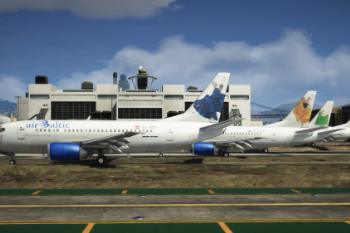

Ee4580 unknown30

301


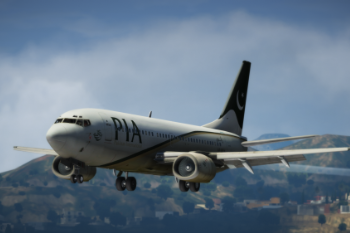

Ee4580 unknownhs14

302


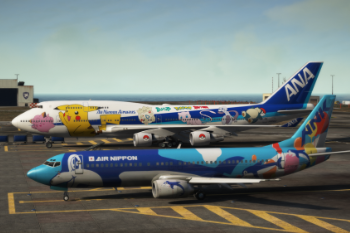

Ee4580 unknownhs42

303


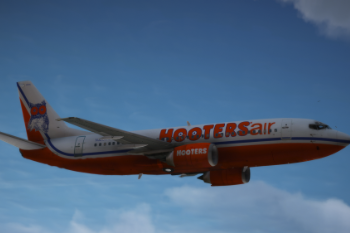

Ee4580 unknownhs5

304


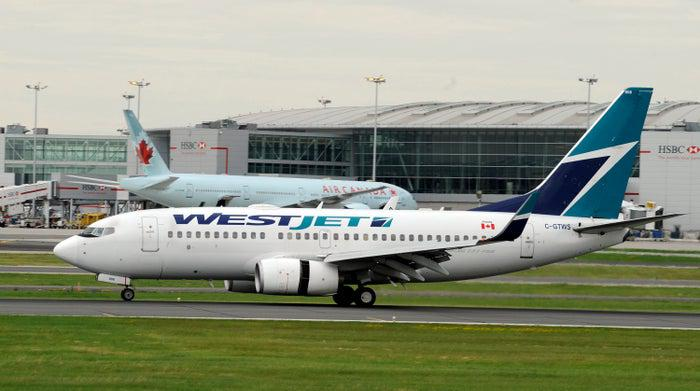

A Westjet Boeing 737700 lands on runway 24R at Pearson Airport this morning TONY BOCKTORONTO STAR JUNE 19 2010 Photo by Tony BockToronto Star via Getty Images

305


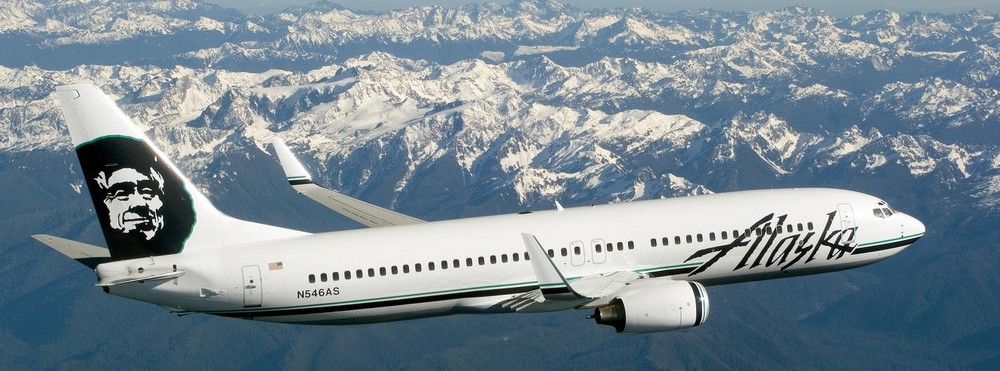

Alaska Airlines Boeing 737800

306


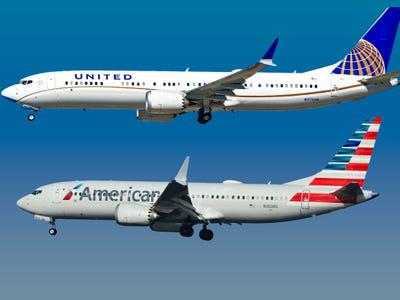

Boeing 737 Max

307


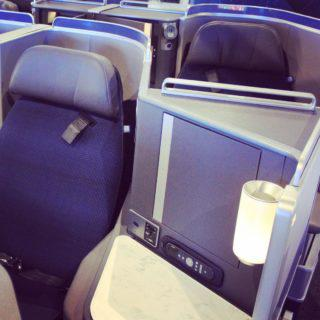

United Airlines new Polaris seat is a huge improvement over UAs current business class seat Check out my blog at liveandletsflycom for 70 photos of how united is transforming its entire business class experience starting this December

308


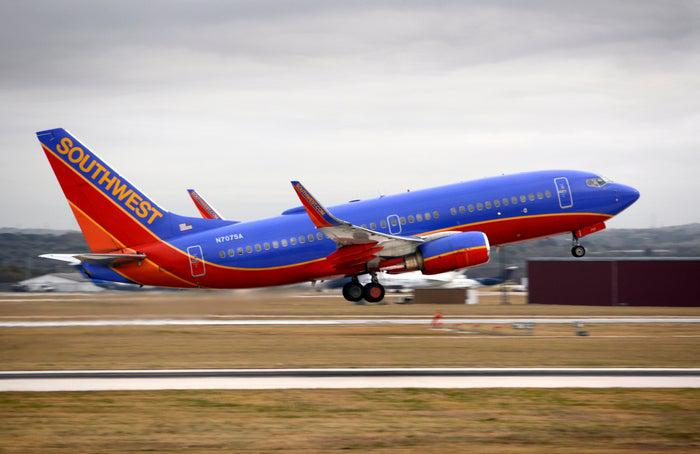

SAN ANTONIO TEXAS  DECEMBER 12 2018 A Southwest Airlines Boeing 737 passenger jet takes off from San Antonio International Airport in Texas Photo by Robert AlexanderGetty Images

309


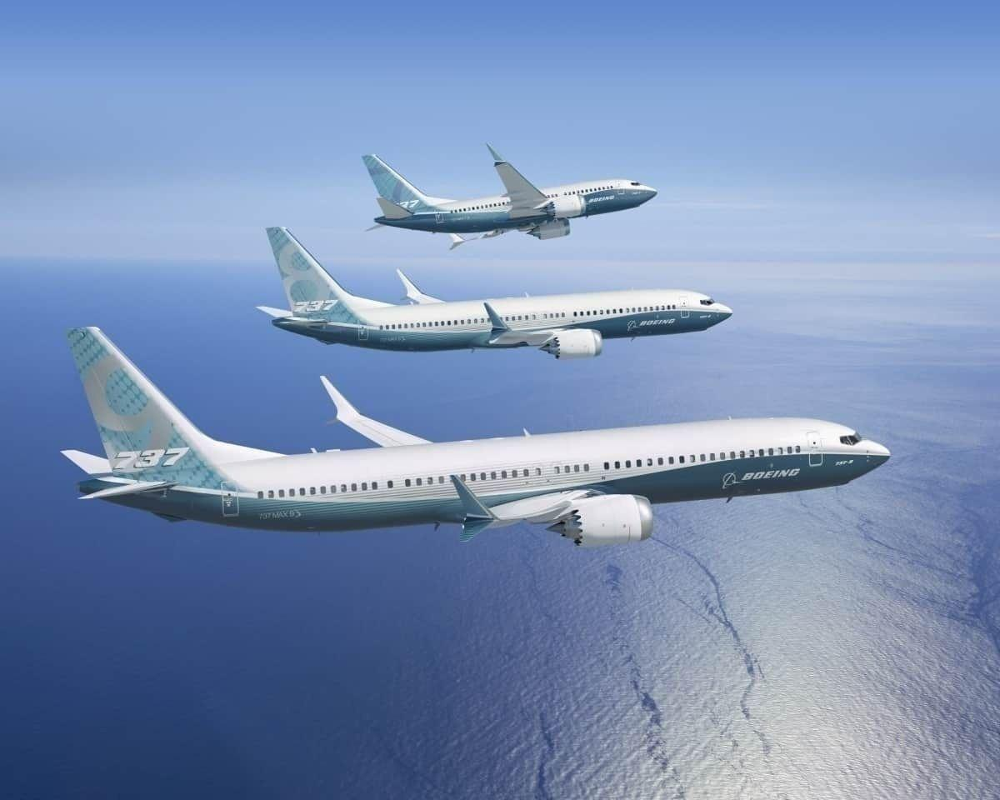

Boeing 737 MAX series

310


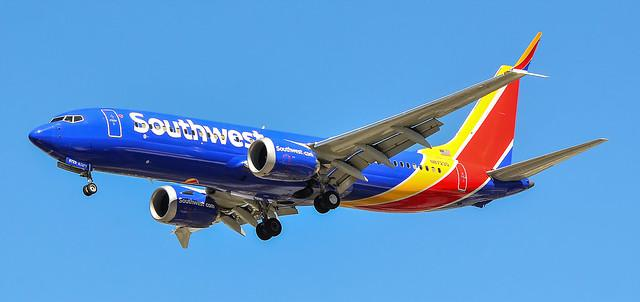

Photo of N8723Q

311


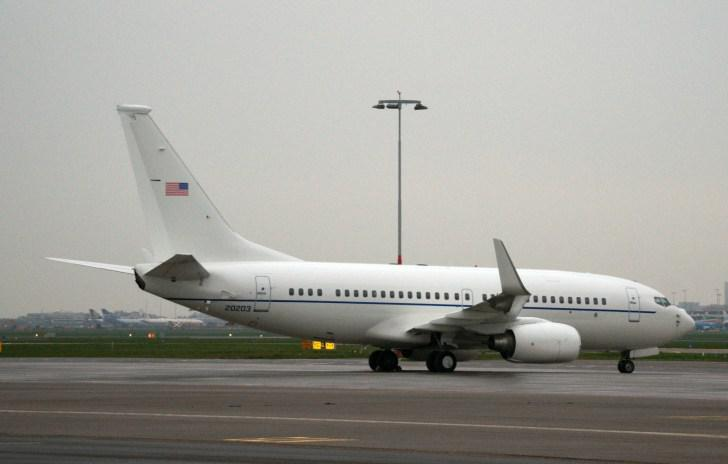

Boeing C40C Clipper 020203 201st AS USAF

312


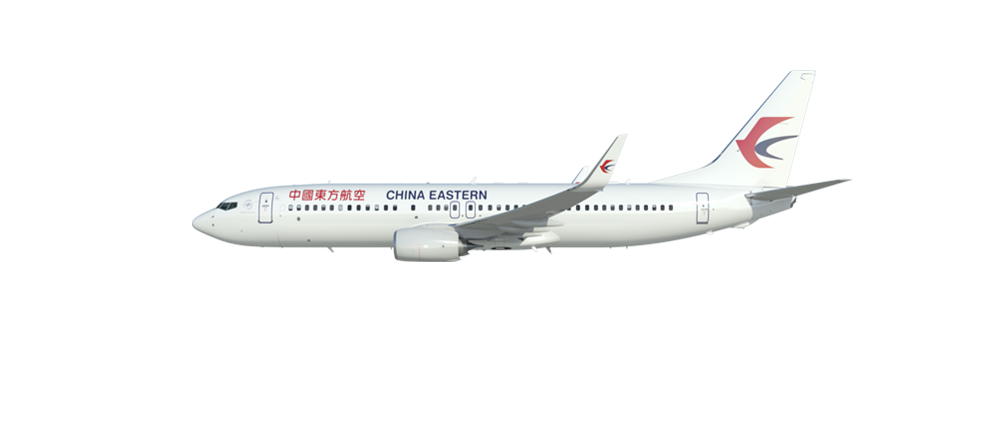

Things to Know about the Boeing 737800

313


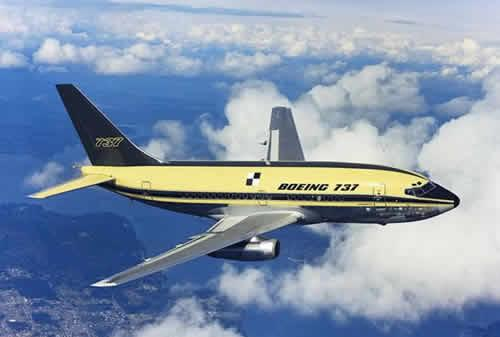

Boeing 737100 Prototype  N73700

314


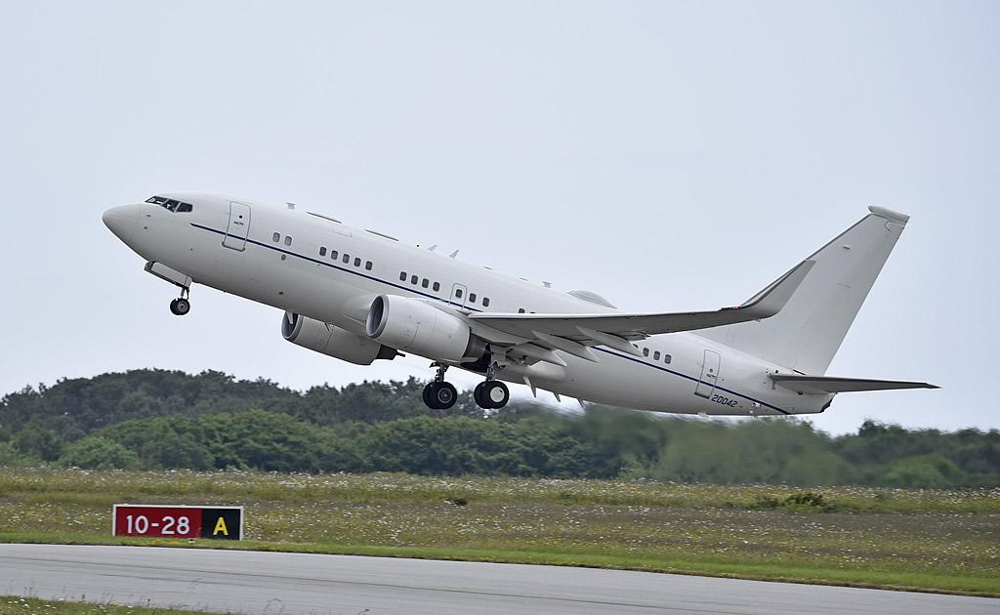

Boeing 737 USAF C40B BBJ SN 020042 msn 33500

315


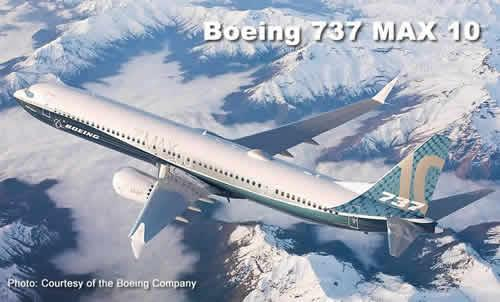

Boeing 737 MAX 10

316


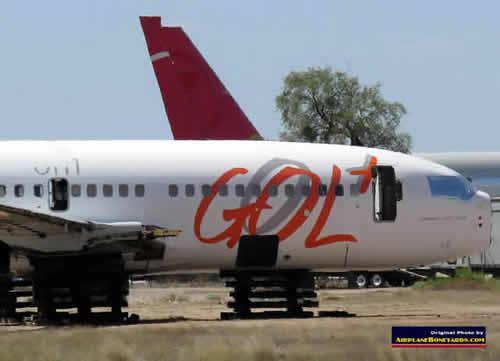

Boeing 737700 of GOL Brazilian airlines registration N320GL

317


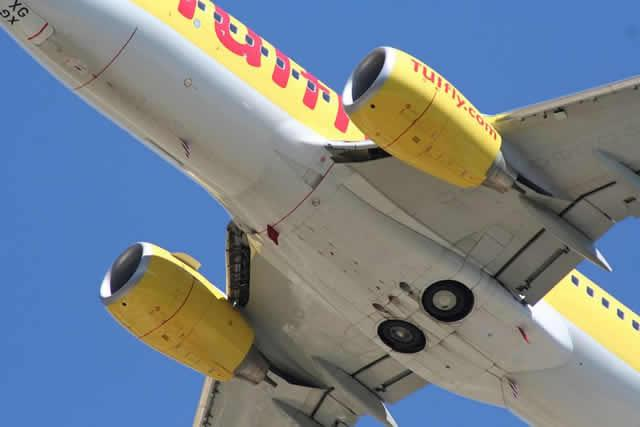

Retracted landing gear on a Boeing 737 are not enclosed in the fuselage but are openair

318


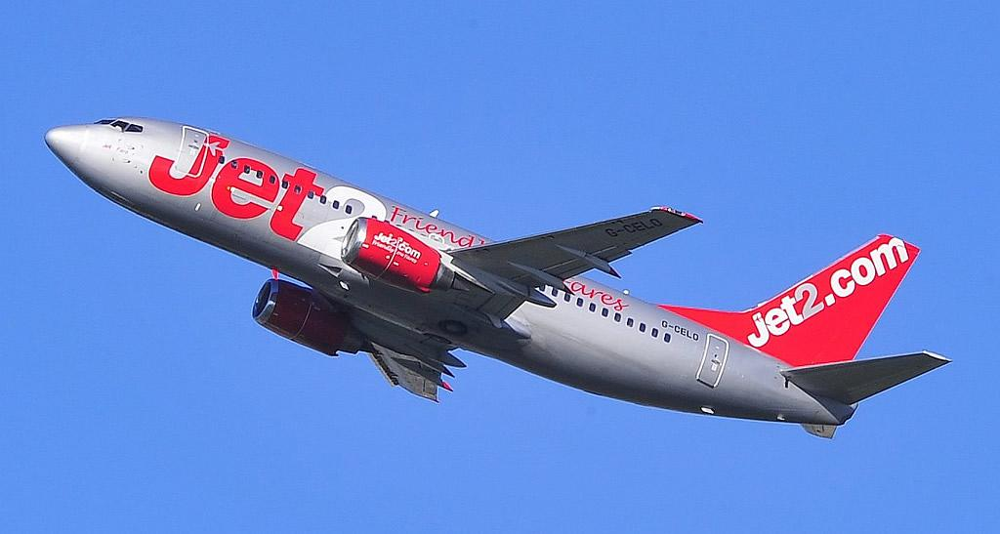

Boeing B737 of Jet2 Registration GCELD

319


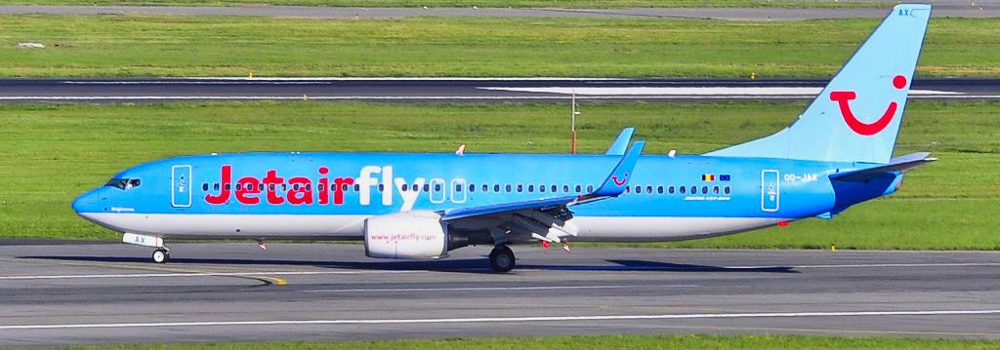

Boeing B737700 of Jetair

320


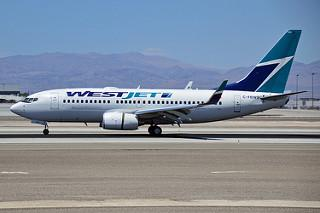

Photo of CFBWS

321


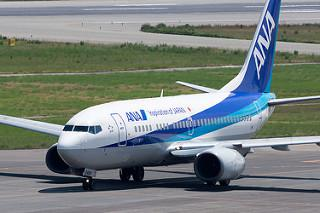

Photo of JA04AN

322


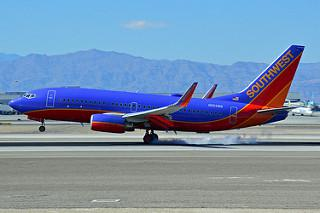

Photo of N253WN

323


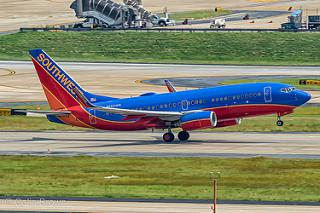

Photo of N552WN

324


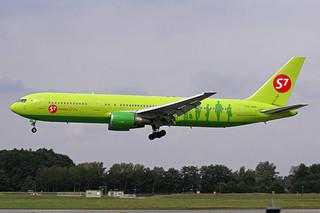

Photo of VQBBI

325


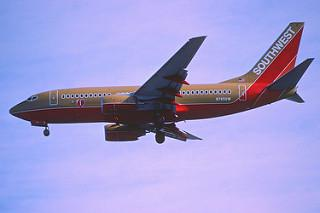

Photo of N765SW

326


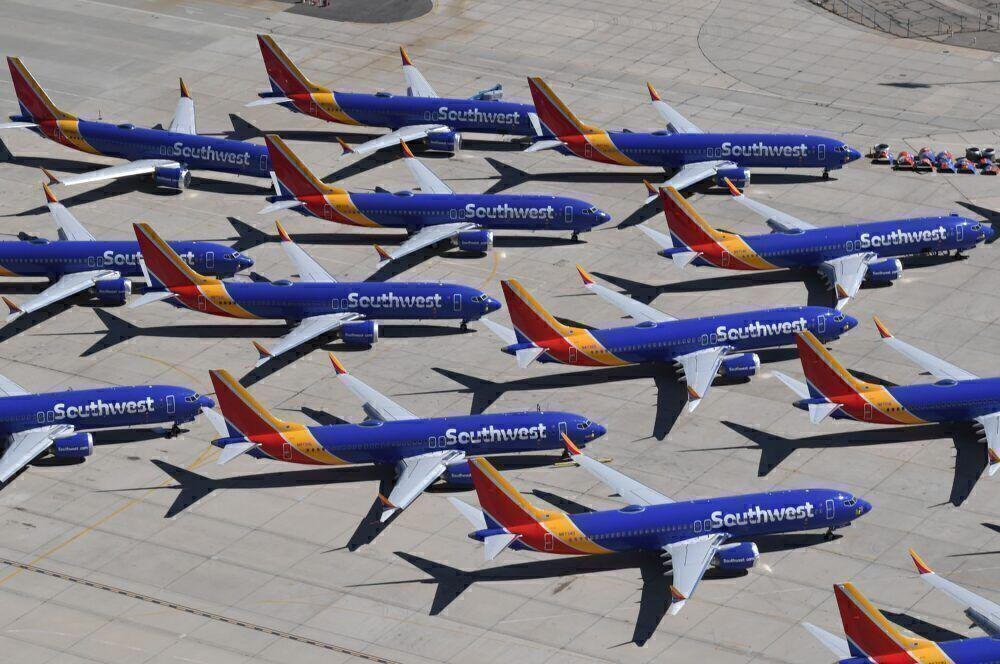

Southwest Boeing 737 MAX Jets

327


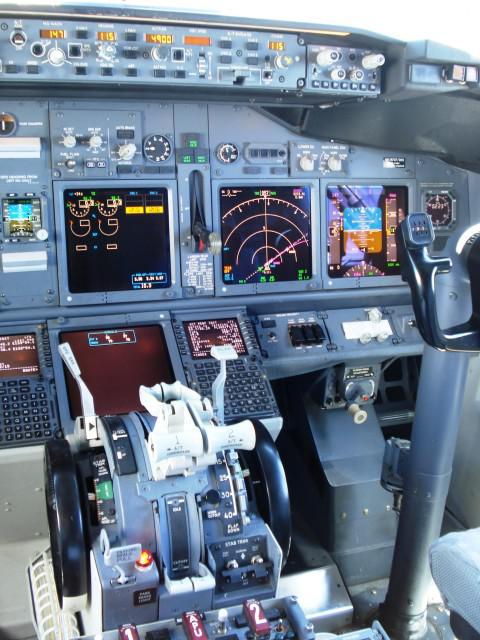

The flight deck of a Boeing 737800 Photo by Owen Zupp

328


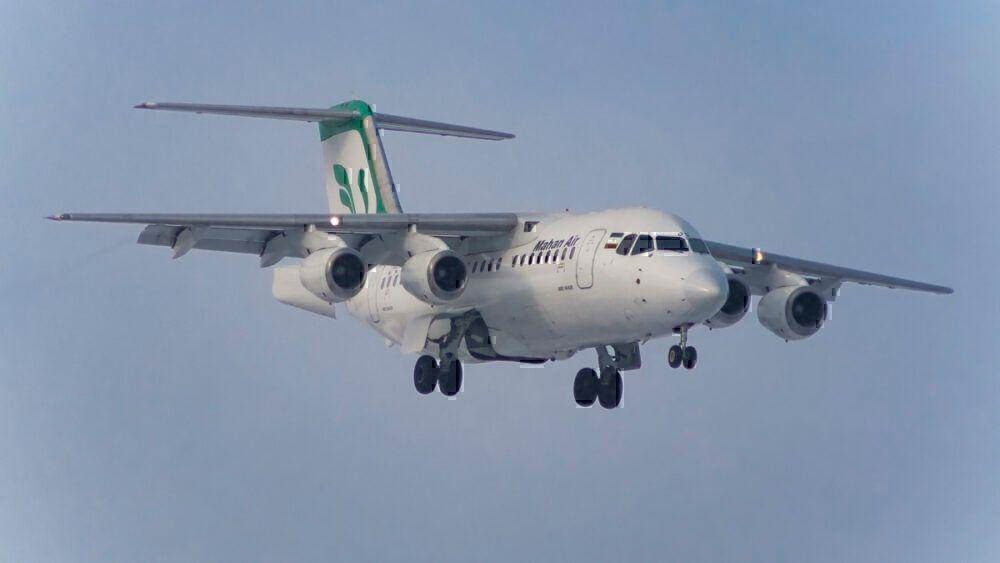

Mahan Air BAe 146

329


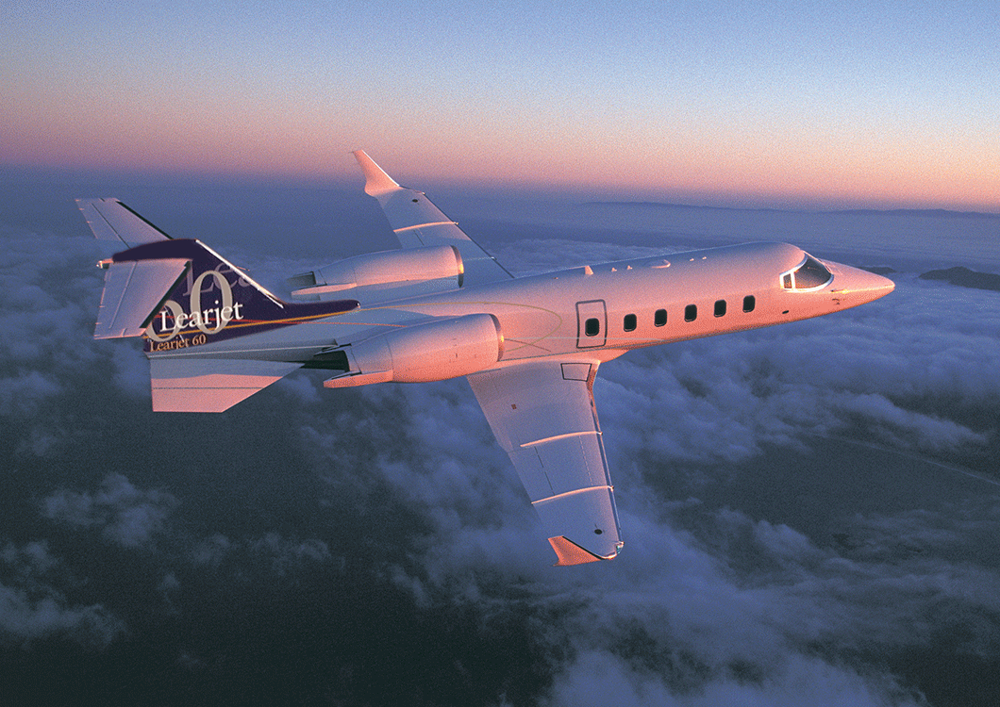

Learjet 60

330


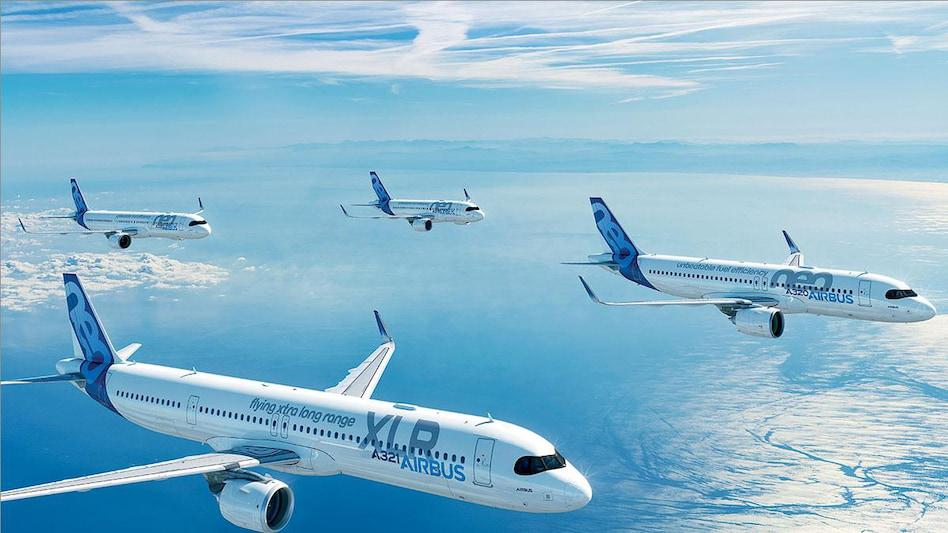

Indias civil aviation market had a fleet of 716 aircraft at the end of 2021 according to regulator DGCA

331


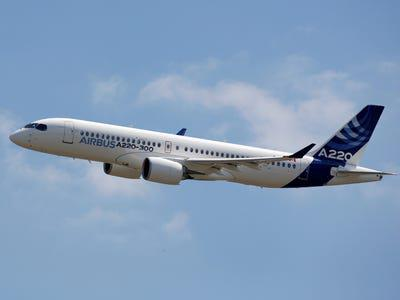

Airbus A220

332


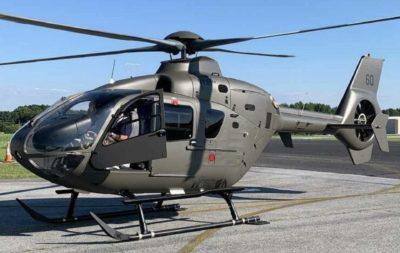

HeliTrader listing for Airbus EC135T1

333


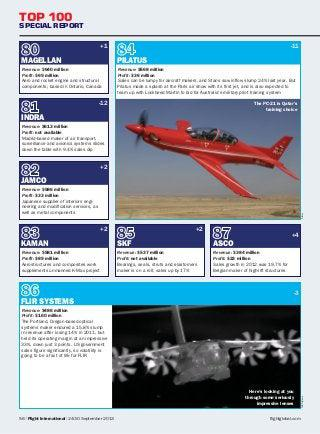

TOP 100SPECIAL REPORT111MAGELLANPILATUSRevenue 640 millionProfit 69 millionAero and rocket engine and s

334


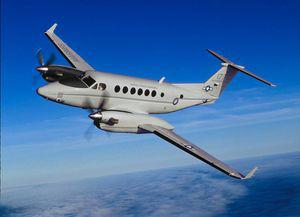

military aircraft

335


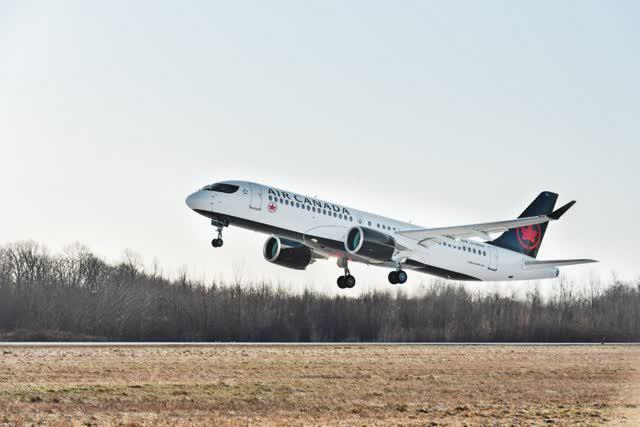

Airbus A220 Canada Québec

336


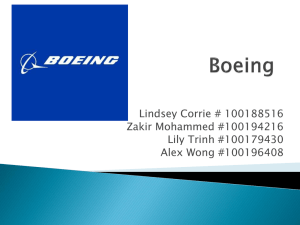

ENTR3120 Group 4 Presentation Boeing

337


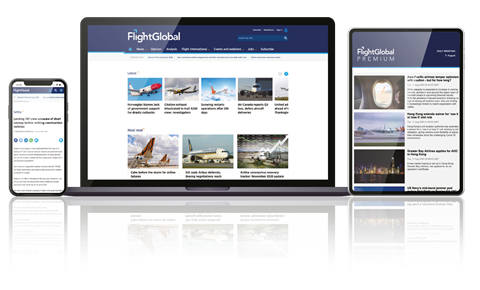

FlightGlobal Premium Digital and Print

338


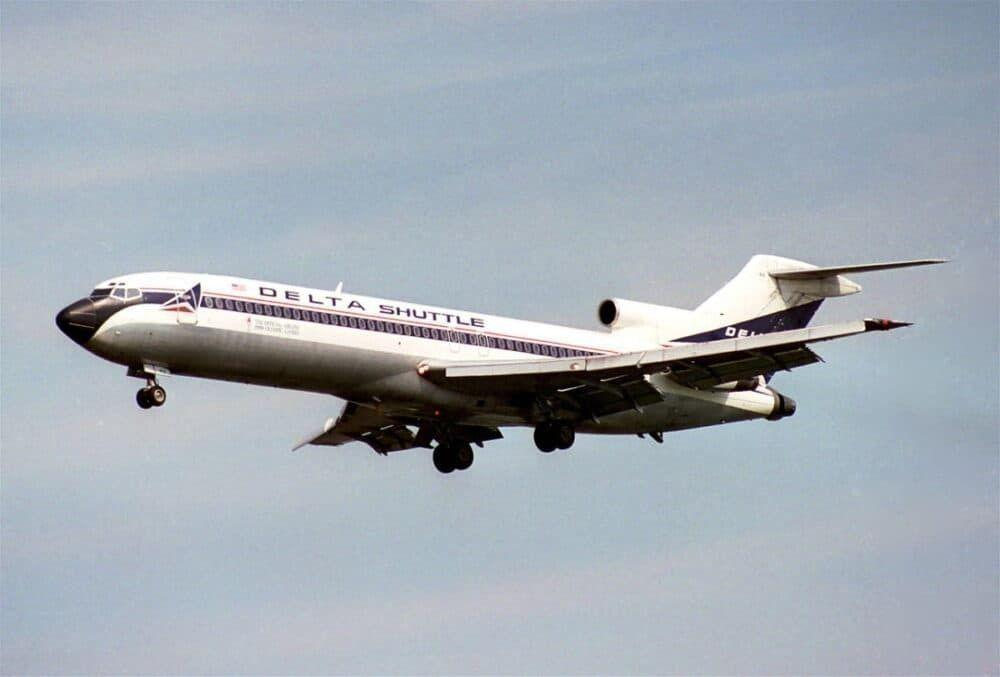

Boeing 727

339


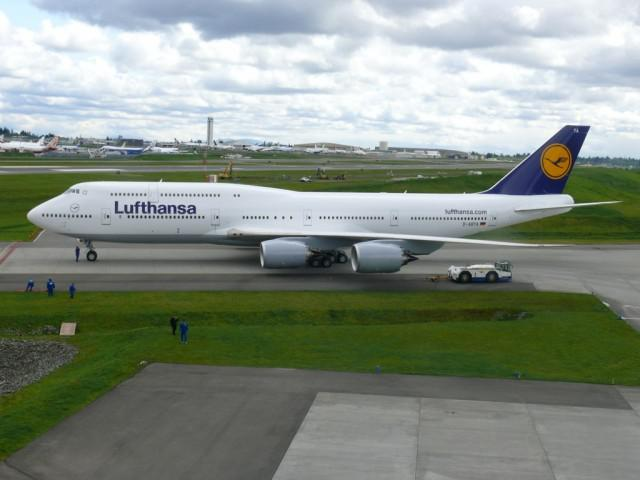

Lufthansas Boeing 7478I taxiing next to the Future of Flight Photo by Chris Sloan  Airchivecom

340


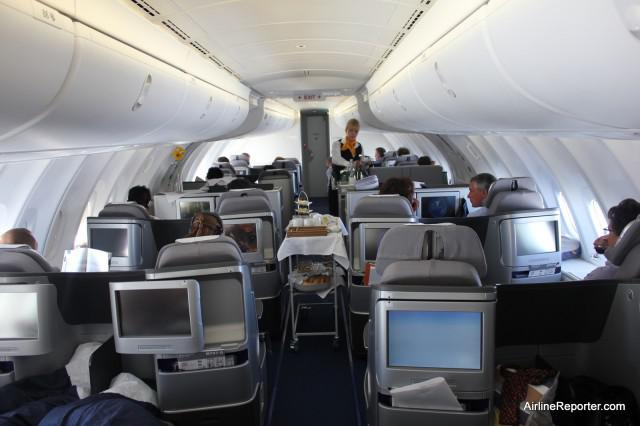

The upper deck of Lufthansas Boeing 7478 Intercontinental 

341


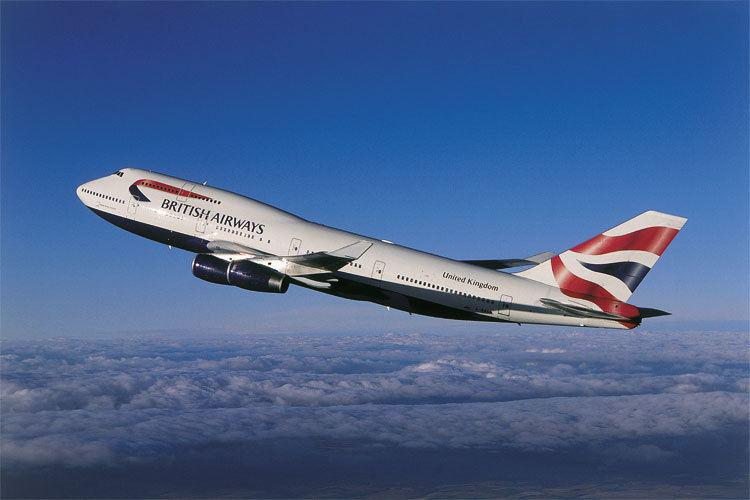

Boeing 747 Boeing 747400 About BA British Airways

342


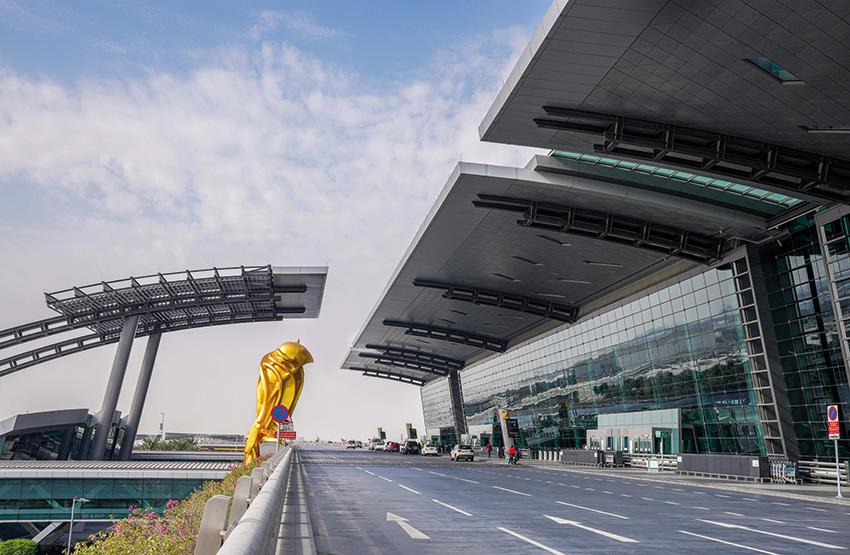

Hamad International Airport Out to impress

343


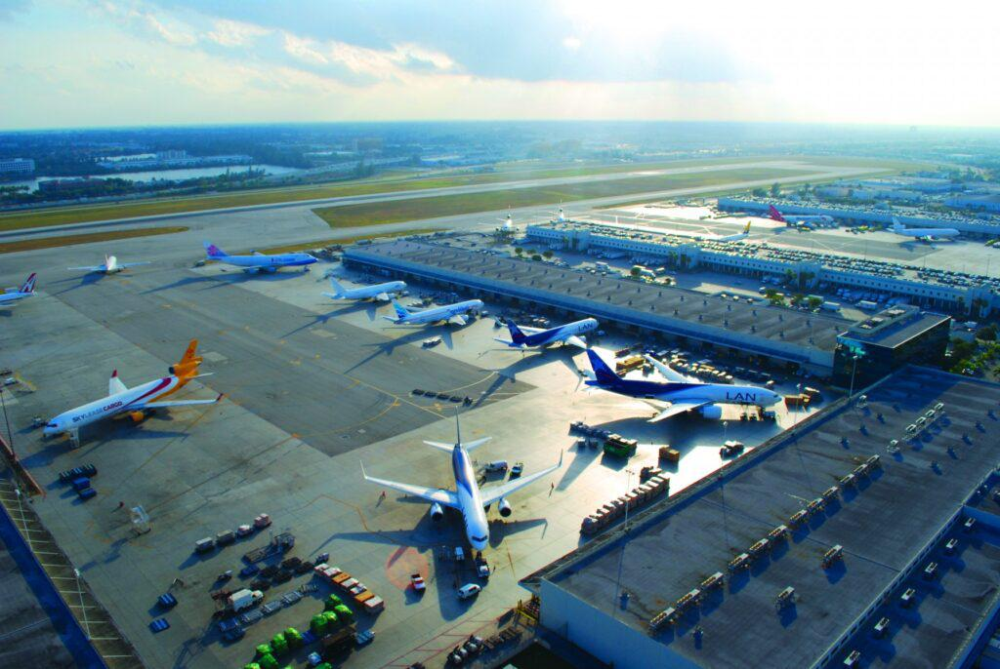

Miami breaks cargo record for second year running

344


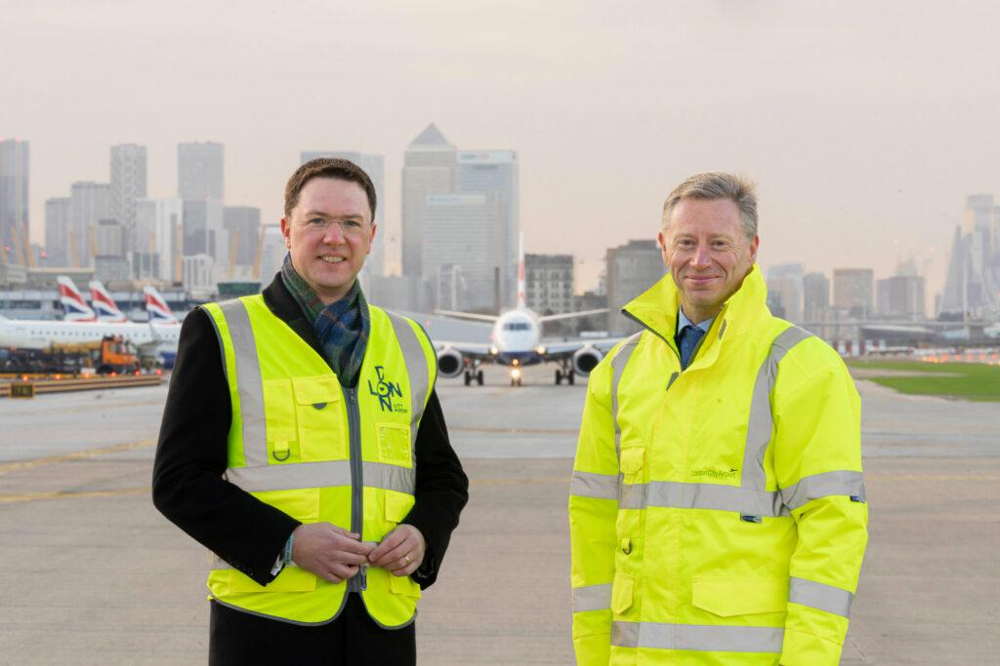

New government funding to help modernise the UKs airspace

345


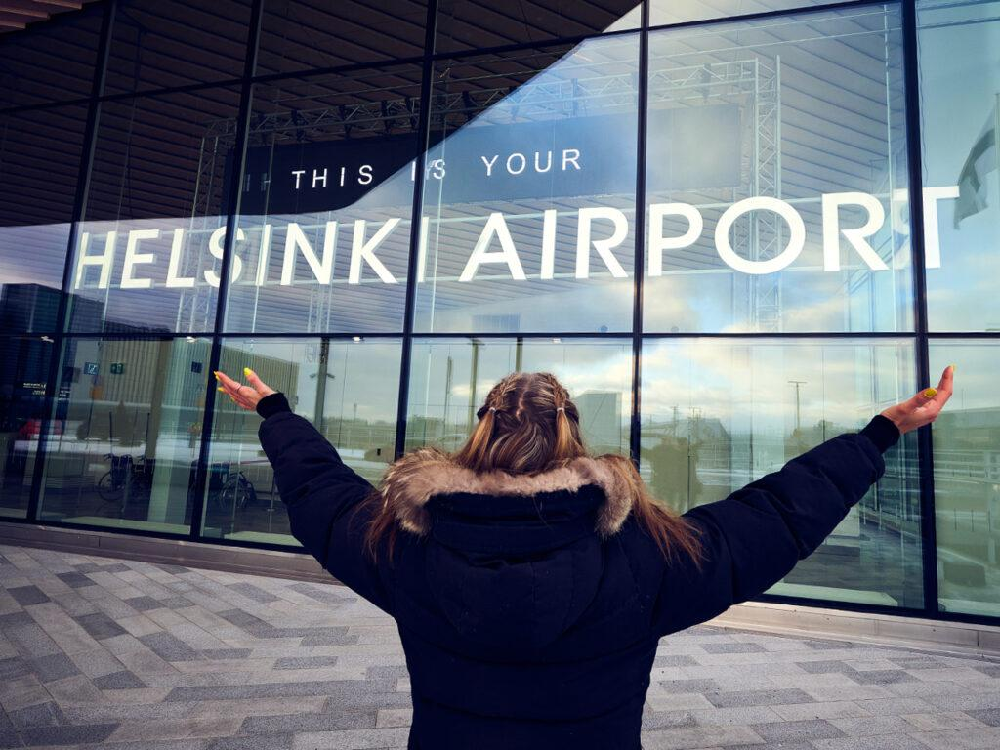

Helsinki becomes the worlds most named airport

346


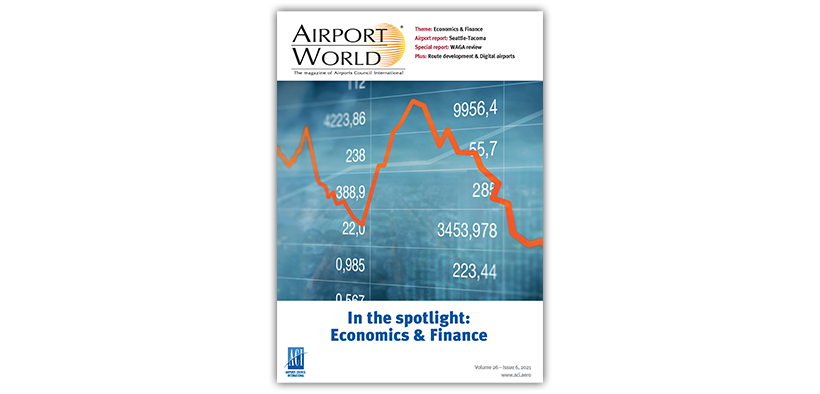

AIRPORT WORLD 2021 ISSUE 06

347


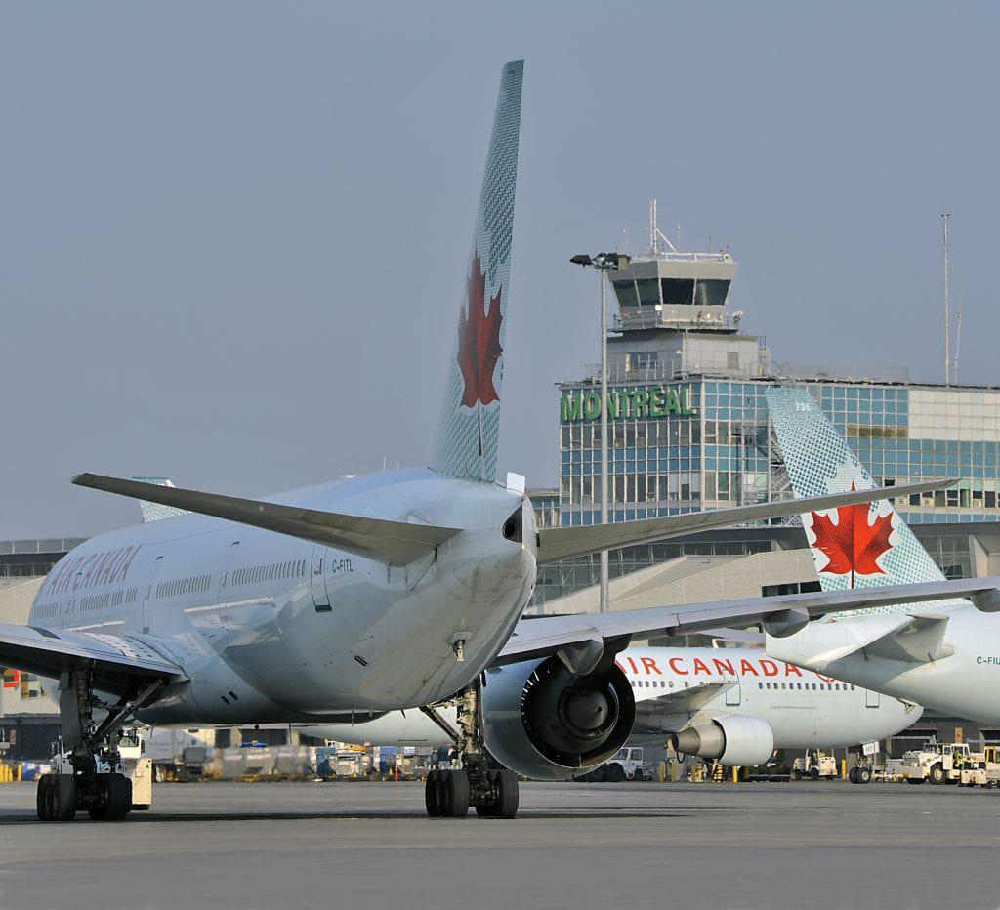

Aéroports de Montréal to accelerate efforts to achieve carbon neutrality

348


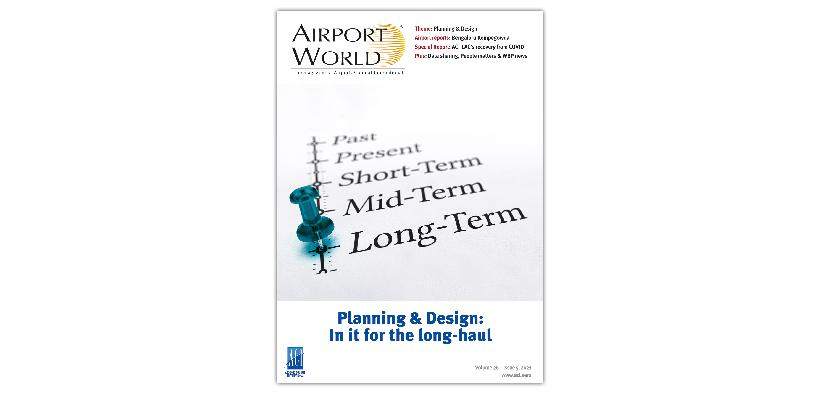

AIRPORT WORLD 2021 ISSUE 05

349


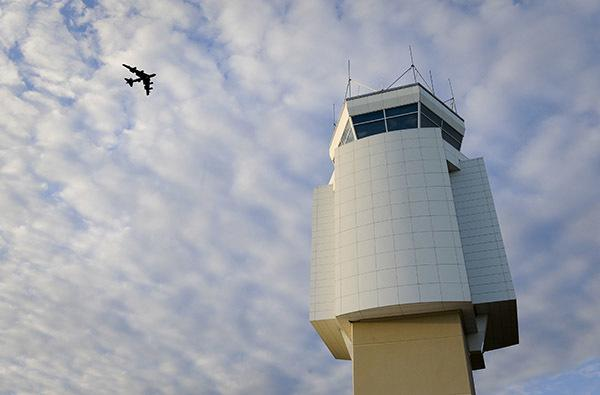

FAA looking for designers to create ATC towers of the future

350


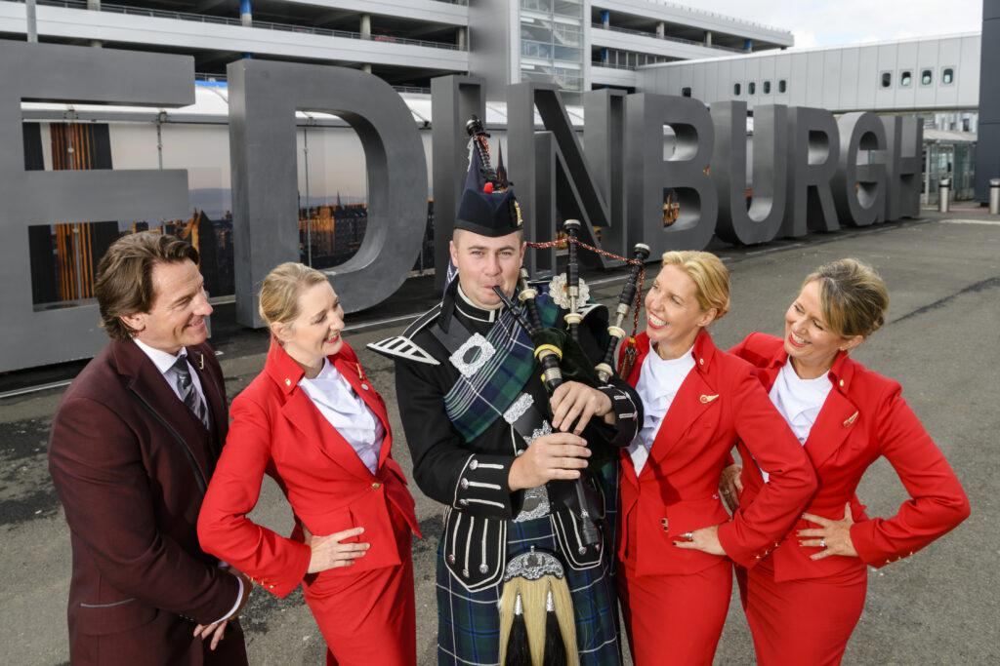

Virgin Atlantic to launch flights to Barbados from Edinburgh

351


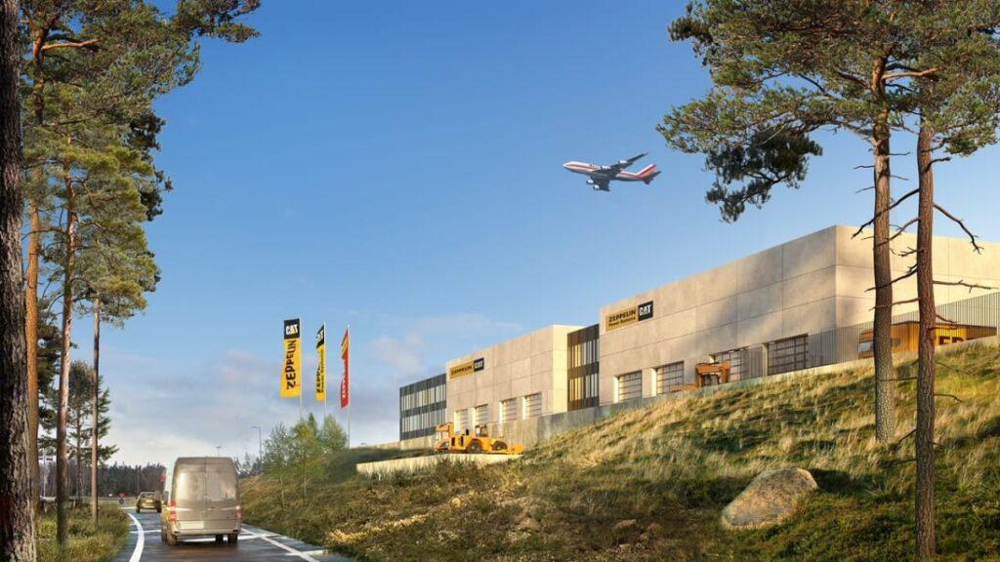

Göteborg Landvetters airport city boosted by Zeppelin Sverige deal

352


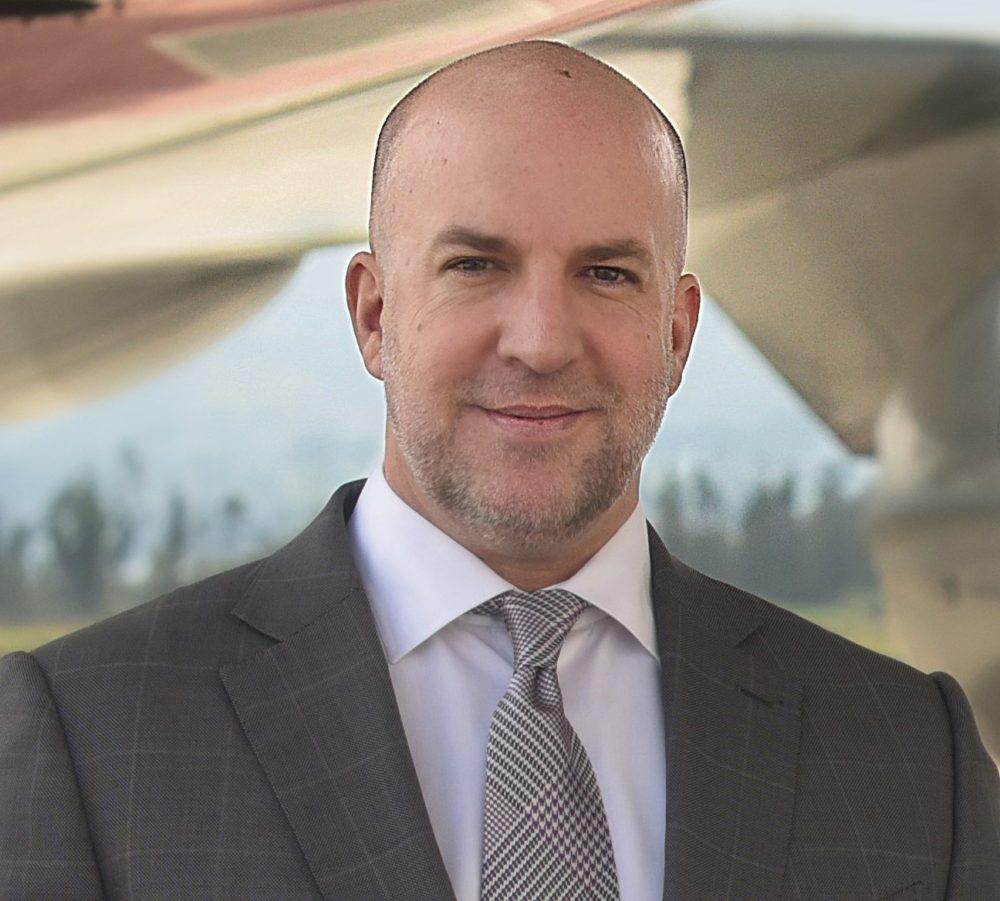

Quitos OBrian to become CEO of Reach Airports

353


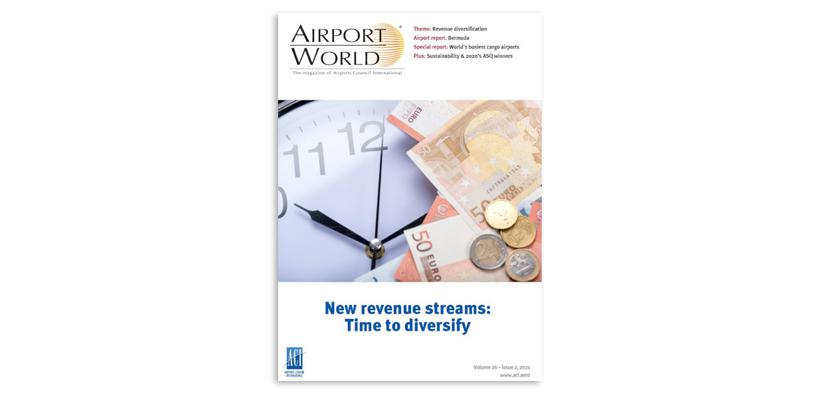

AIRPORT WORLD 2021 ISSUE 02

354


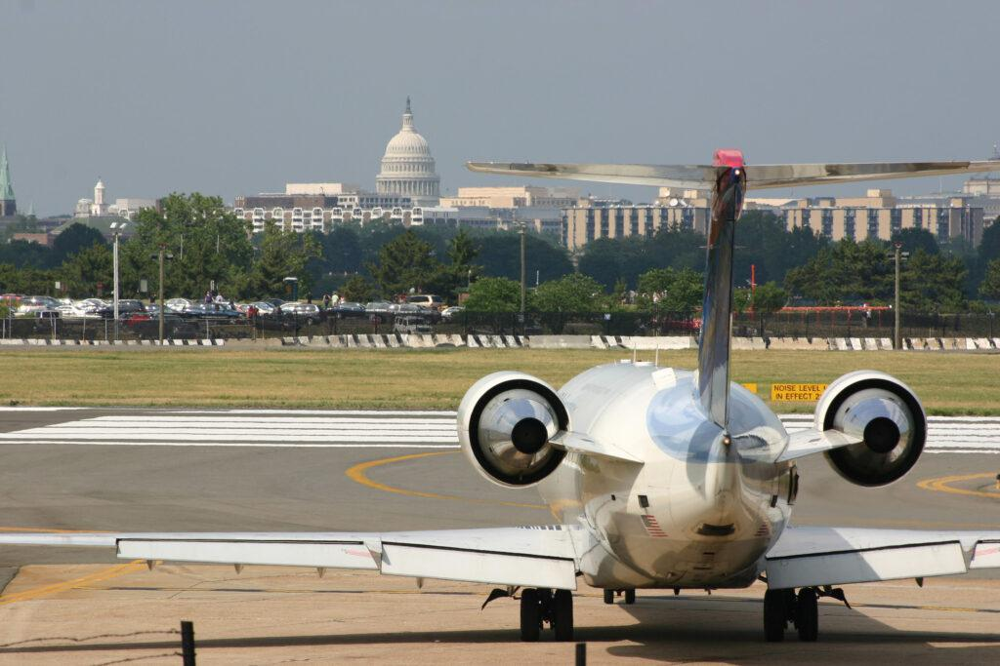

Washington DCs airports look to enhance passenger experience

355


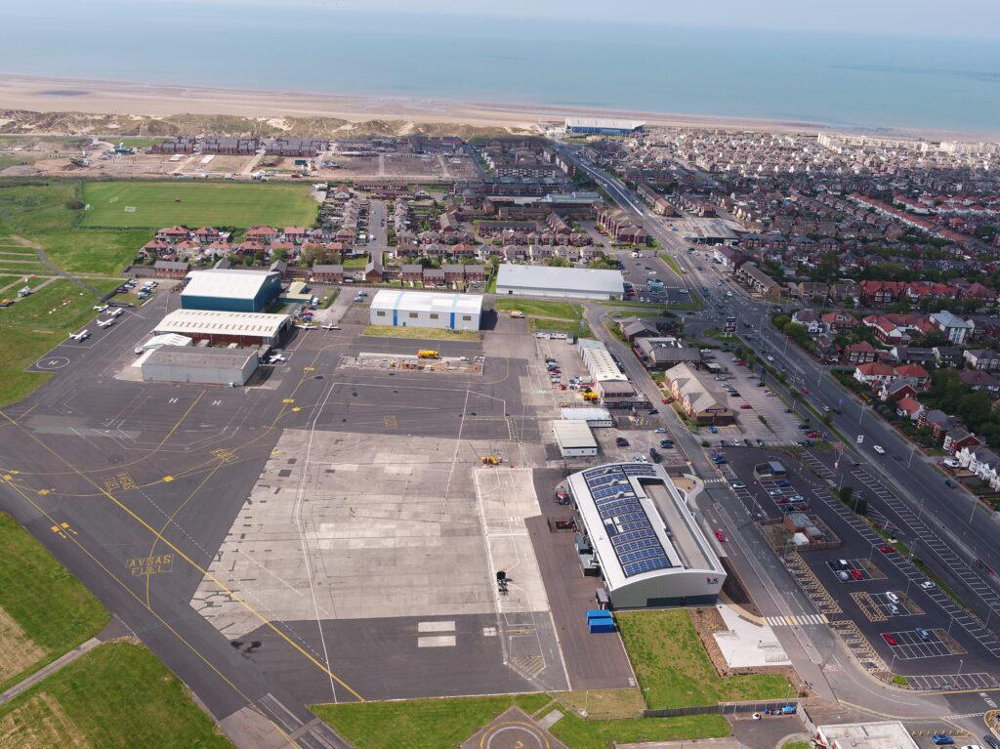

New operator of Blackpool Airport planning for better days

356


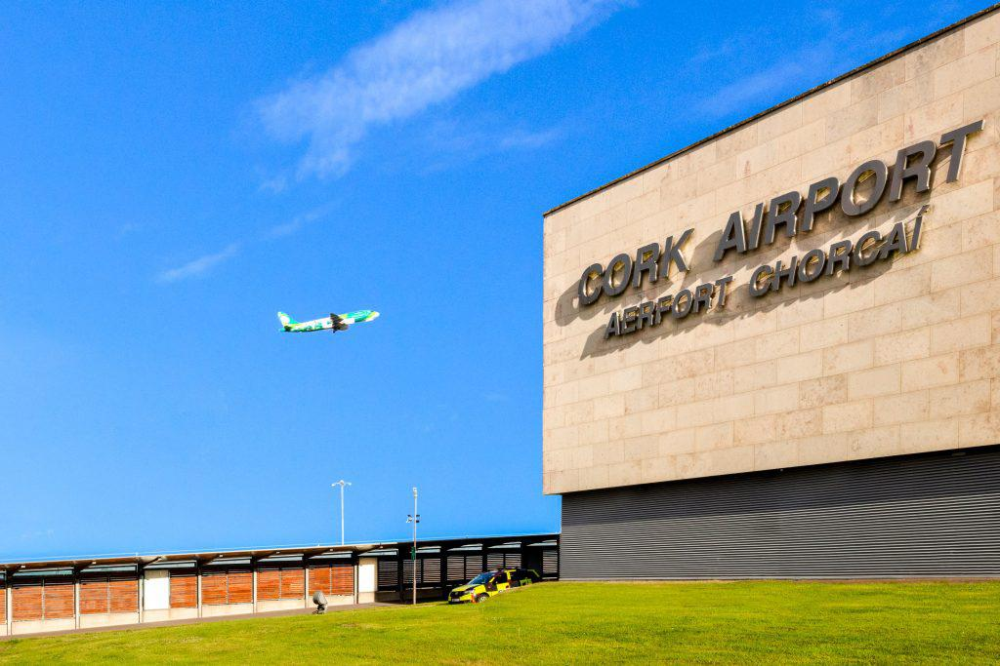

Cork Airport loses two million passengers in 2020

357


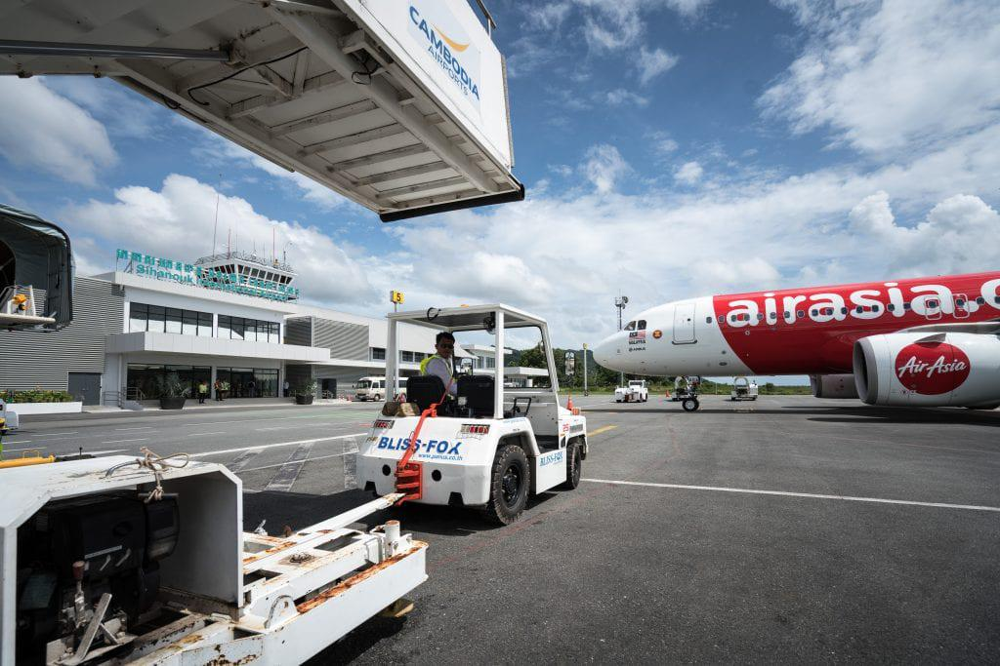

Cambodias airports step up their efforts to achieve carbon neutrality

358


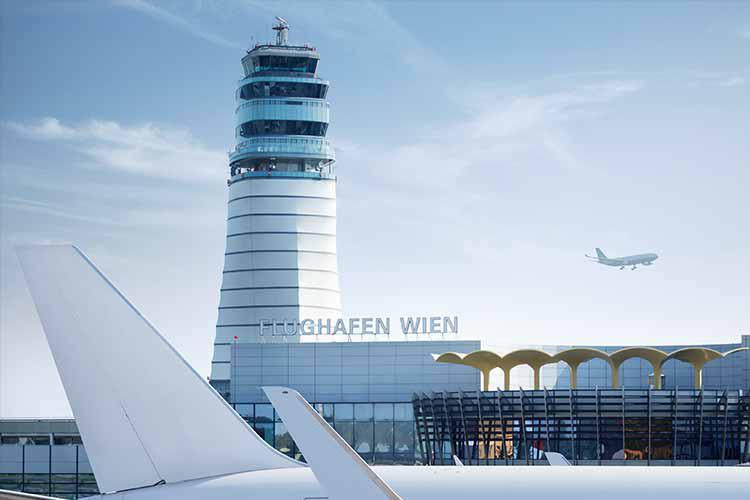

Work continues on upgrade of Vienna Airport

359


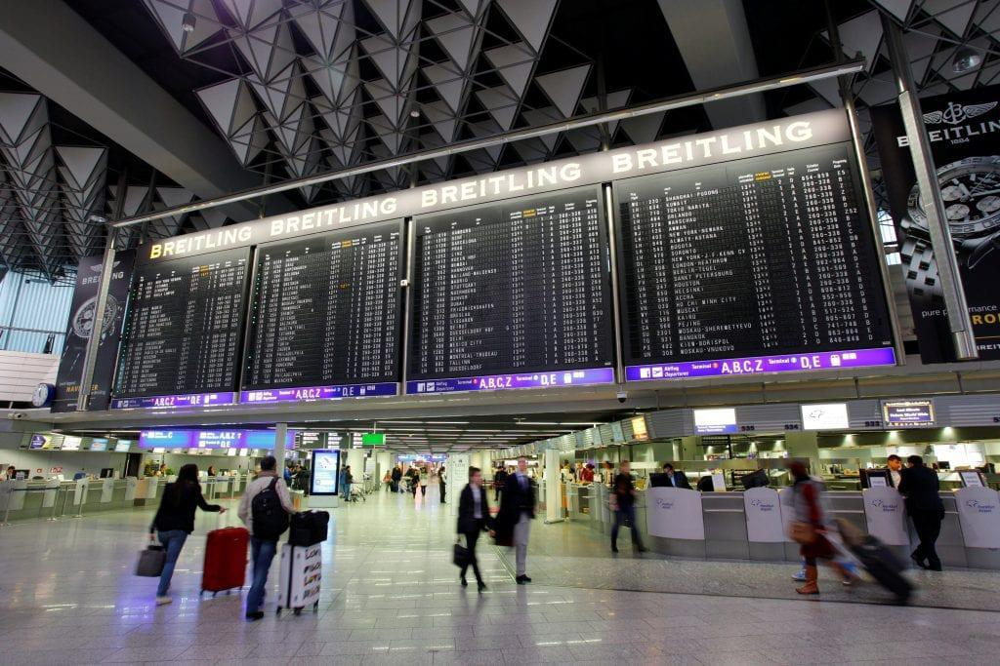

Europe looking at ways to restore air connectivity

360


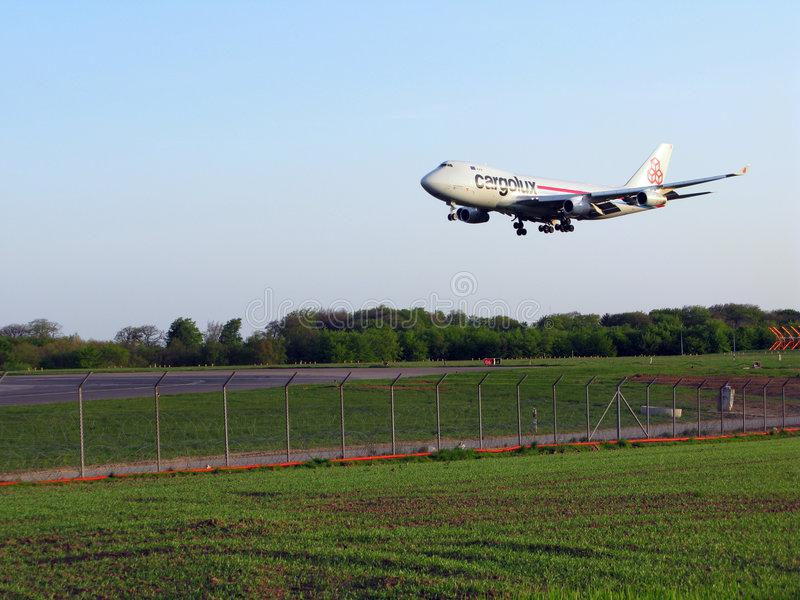

Cargolux Landing At the airport of Luxembourg City stock photo

361


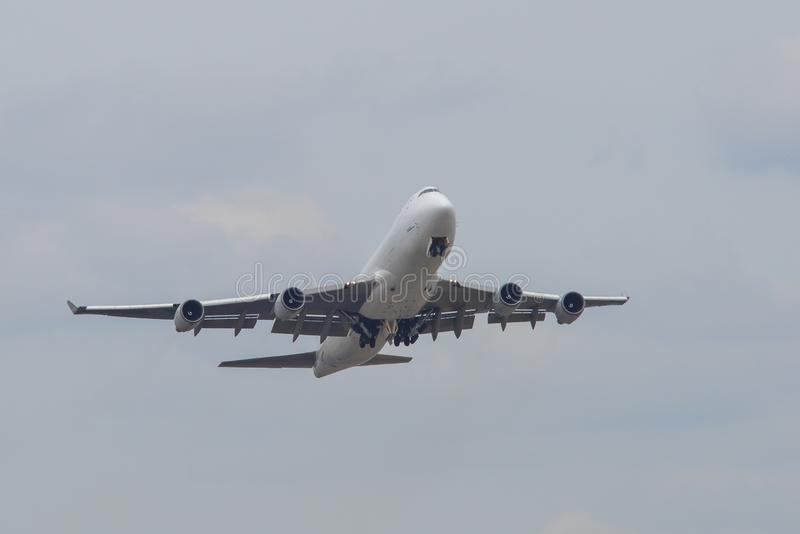

Airplane takingoff from Narita Airport Tokyo Japan  Apr 17 2019 N405KZ Atlas Air Boeing 747400F takingoff from Narita Airport NRT Narita is one of the royalty free stock photos

362


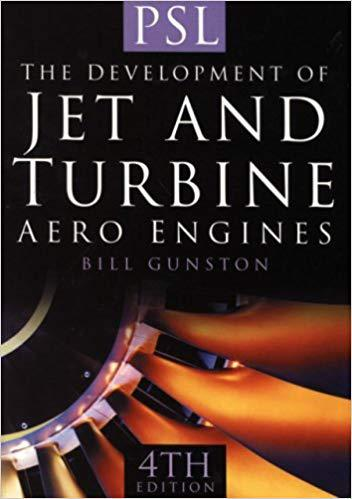

The Development of Jet and Turbine Aero Engines by Bill Gunston

363


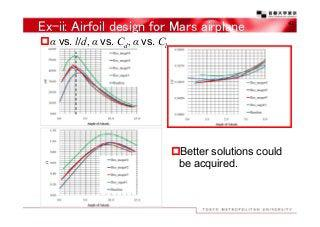

bExii Airfoil design for Mars airplanenxefx81xb0xcexb1 vs ld xcexb1 vs Cd xcexb1 vs Clnnxefx81xb0Better solutions couldnbe acquirednn42nn 

364


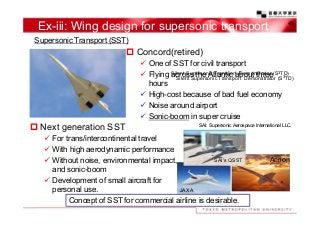

bExiii Wing design for supersonic transportnn49nnSupersonic Transport SSTnnxefx81xb0 Concordretirednxefx83xbc One of SST for civil tr

365


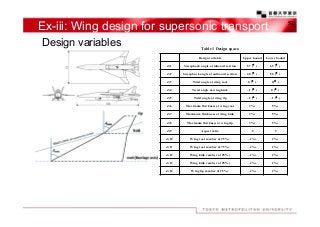

Exiii Wing design for supersonic transportDesign variables52Table 1 Design spaceDesign variableUpper boundLow

366


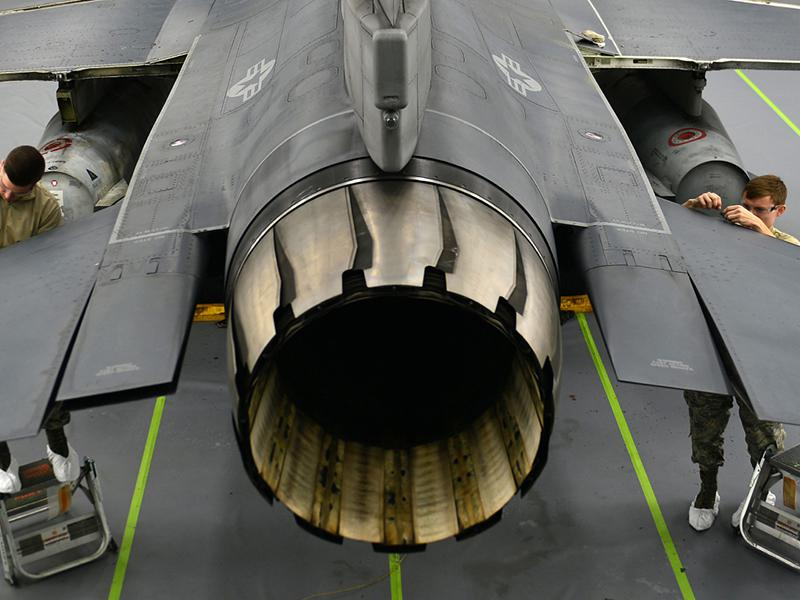

military aviation services nav

367


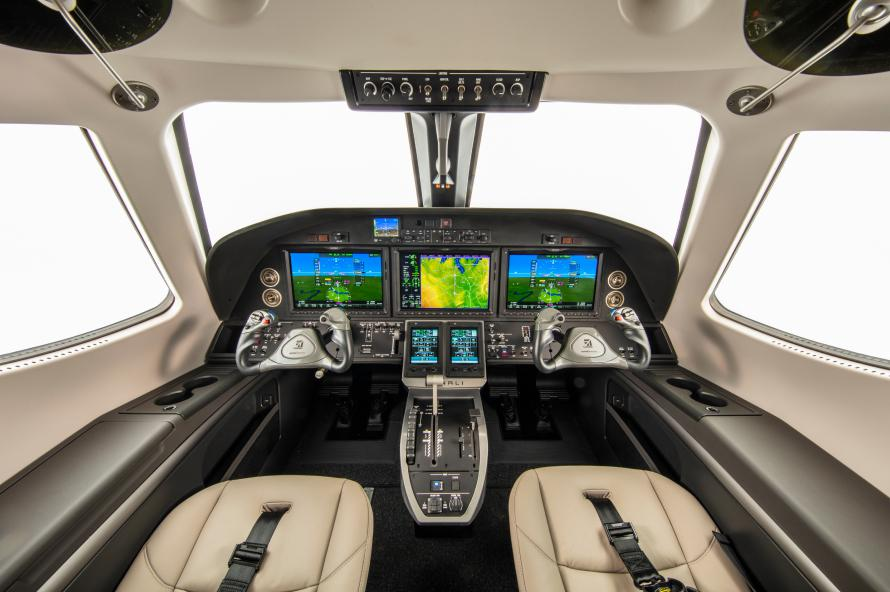

catalyst jet experience

368


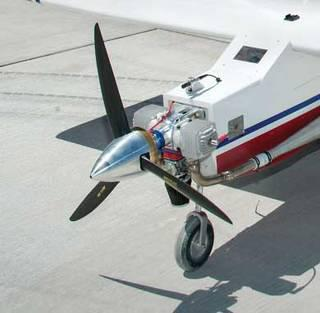

Photo of a propeller on the front of an aircraft

369


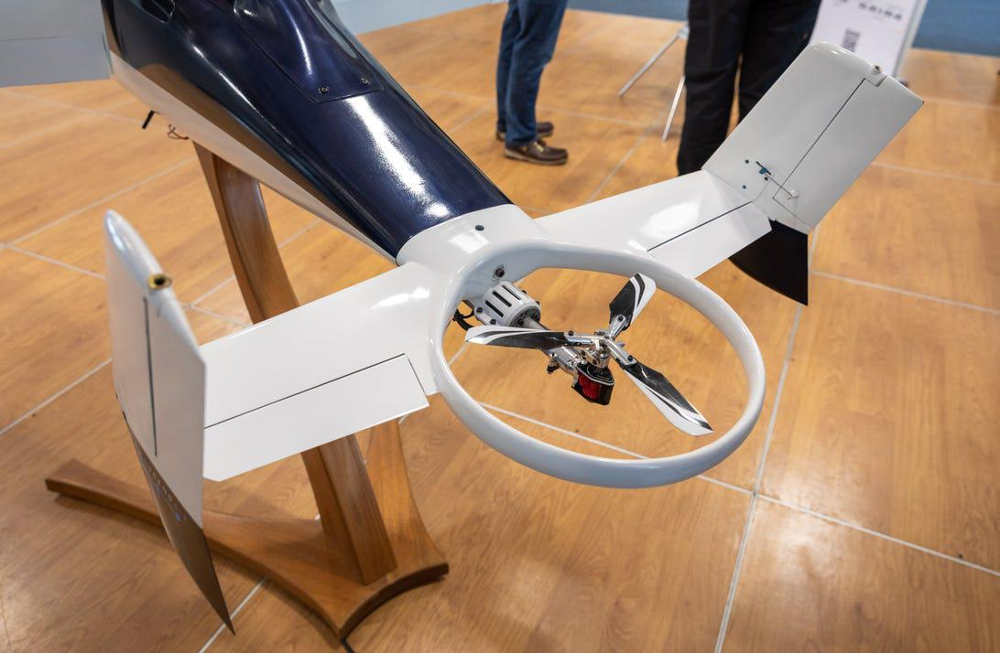

Transcend Air Vy 400 tail rotor

370


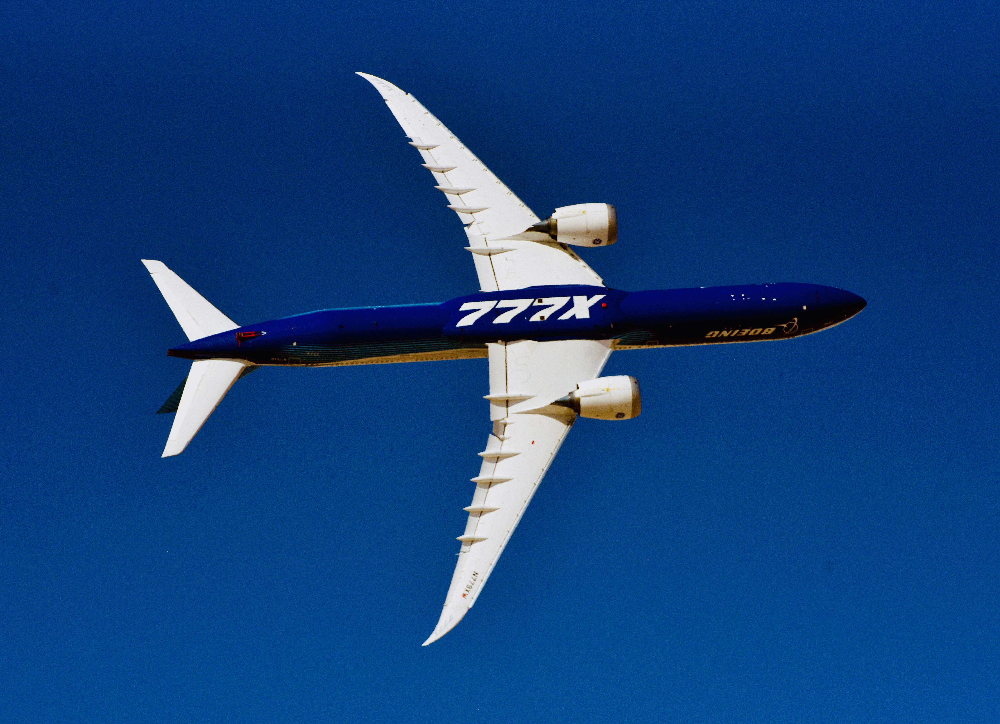

GE Aviation Boeing GE9X 777X Dubai Airshow

371


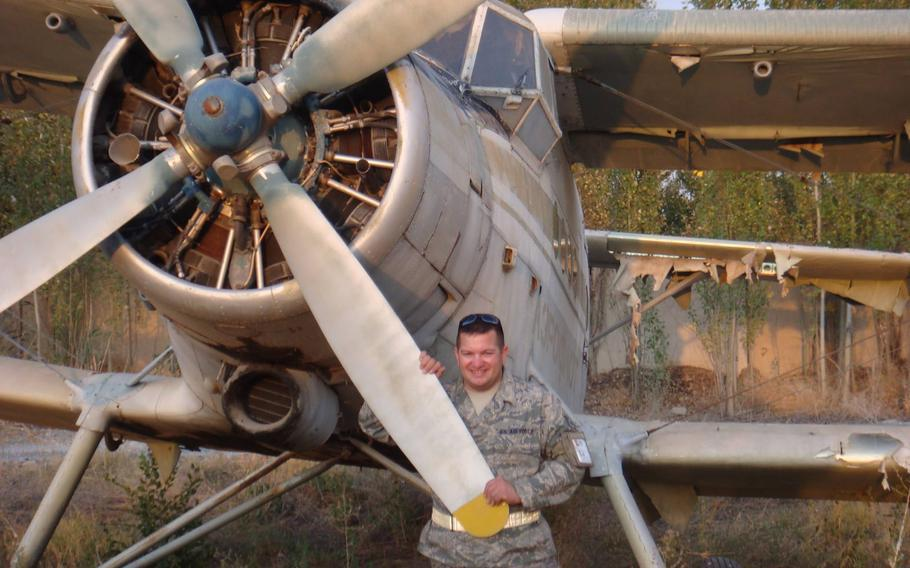

ThenAir Force Tech Sgt Gino Lucci stands by a prop plane at Manas Air Base in Kyrgyzstan in 2010 Lucci who deployed around the world during his 25 years in the service retired in 2015 Four years later he turned a World War IIera plane into a roadworthy motor home

372


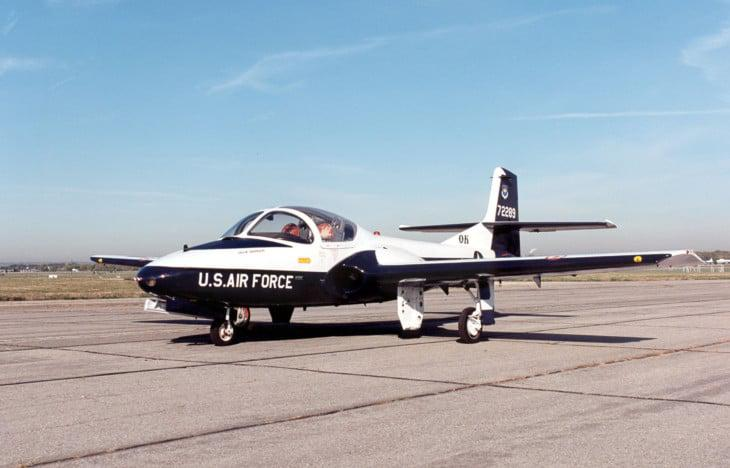

Cessna T 37B Tweety Bird at the National Museum of the United States Air Force

373


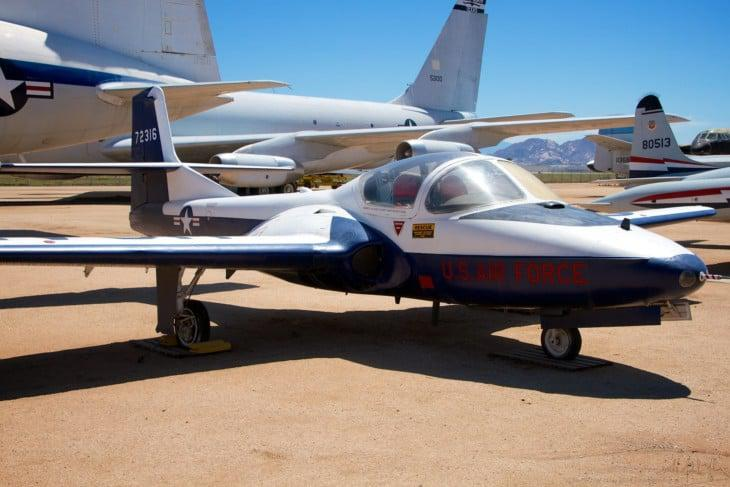

Cessna T 37 Tweety Bird

374


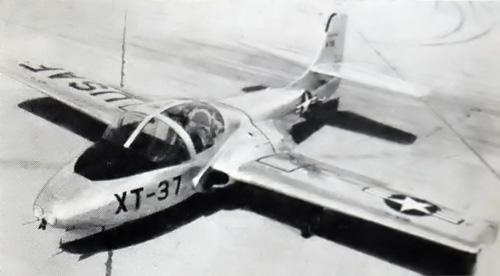

Cessna T37 03

375


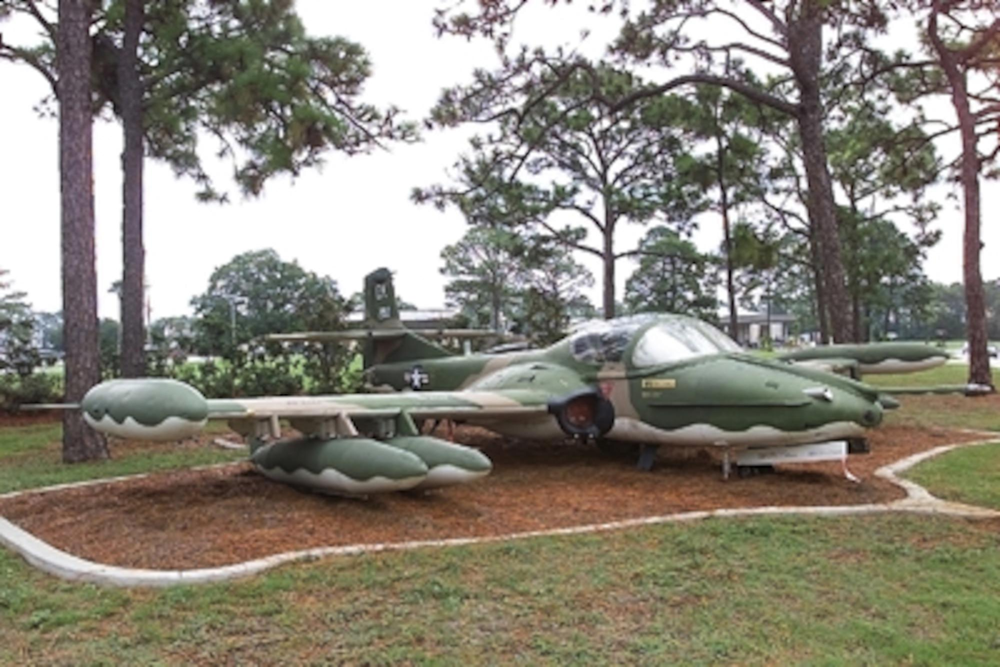

The A37 Dragonfly was developed in 1963 by modifying the Cessnabuilt T37 trainer It sported two General Electric J85GE17A turbojet engines which developed 2850 pounds of thrust The wingspan of this plane was 35 feet 10 inches Its length was 29 feet 3 inches and the planes height was 8 feet 10 inches The aircraft weight 14000 pounds fully loaded Its maximum speed was 507 mph at 16000 feet with a range of 460 miles

376


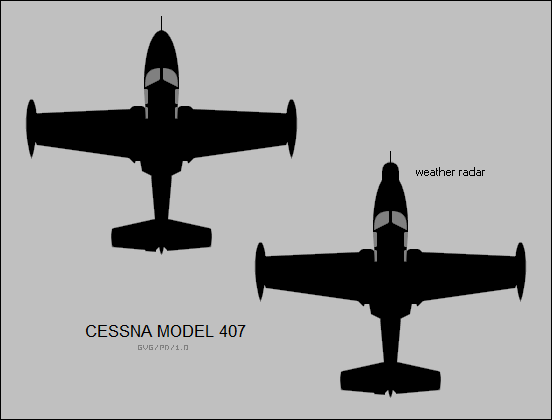

Cessna Model 407

377


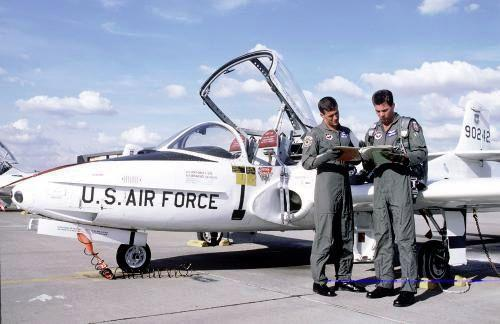

T37 Williams AFB AZ Military Jets Military Aircraft Military Brat Fighter Aircraft Fighter Jets Flying Wing Pilot Training Dog Whistle Jet Age

378


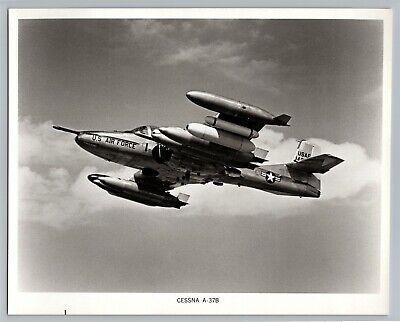

USAF Cessna A37B Dragonfly Super Tweet Jet Aircraft BW Official Photo C10

379


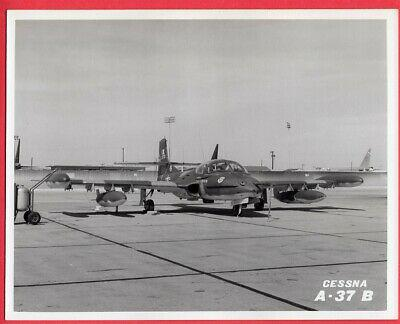

1960s USAF Cessna A37B 68970 Dragonfly at Carswell AFB 8x10 Original Photo 1

380


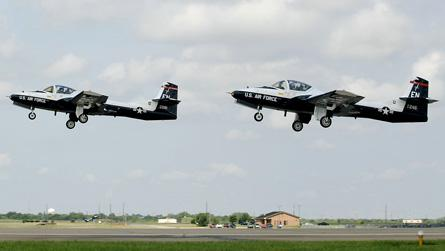

Last T37 Tweets  Harry Toneman USAF

381


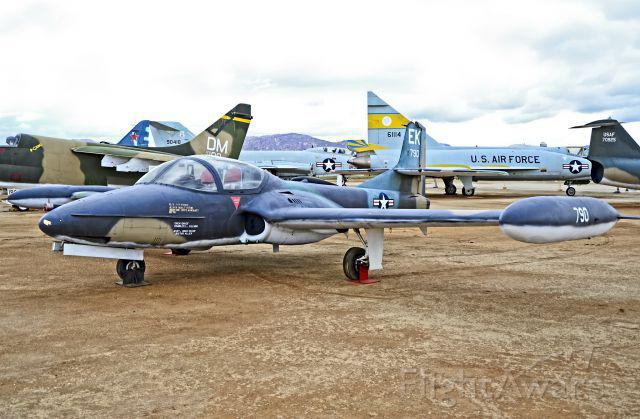

bCessna Dragonfly twinjet A37 Aircraft xe2x9cx88 FlightAware Jet Aircraft Military Aircraft Airplane Graveyard Aviation Industry Military Combat Cessna Us Air Force Vintage Military Air Travel

382


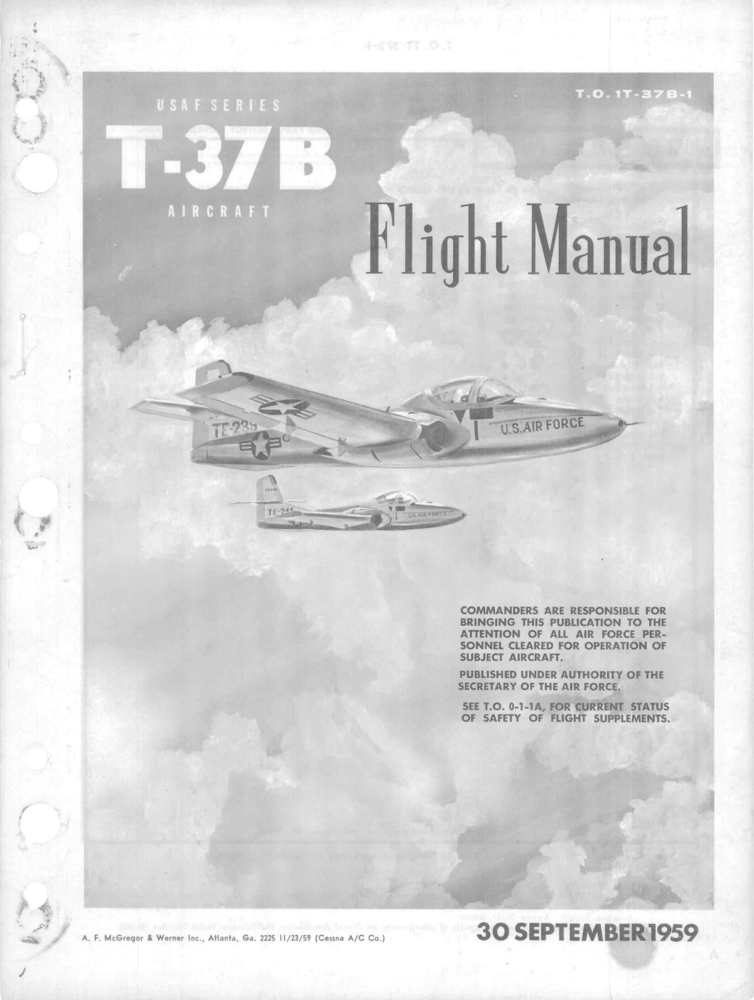

Flight Manual for the Cessna T37

383


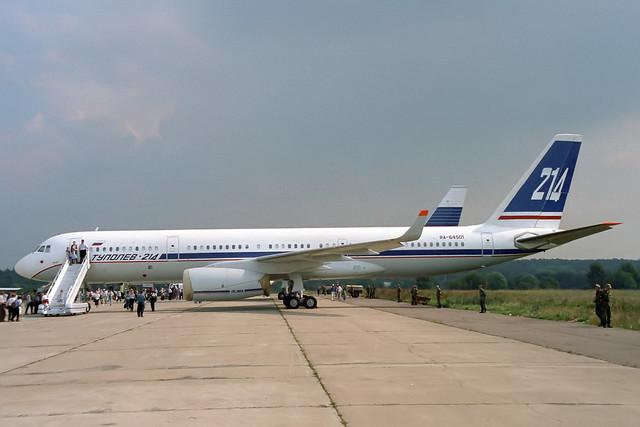

RA64501 Tupolev TU214 Tupolev Design Bureau

384


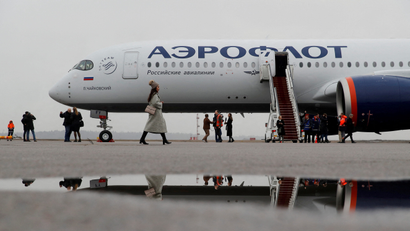

Aeroflot presents its first Airbus A350900 at Sheremetyevo International Airport outside Moscow in 2020

385


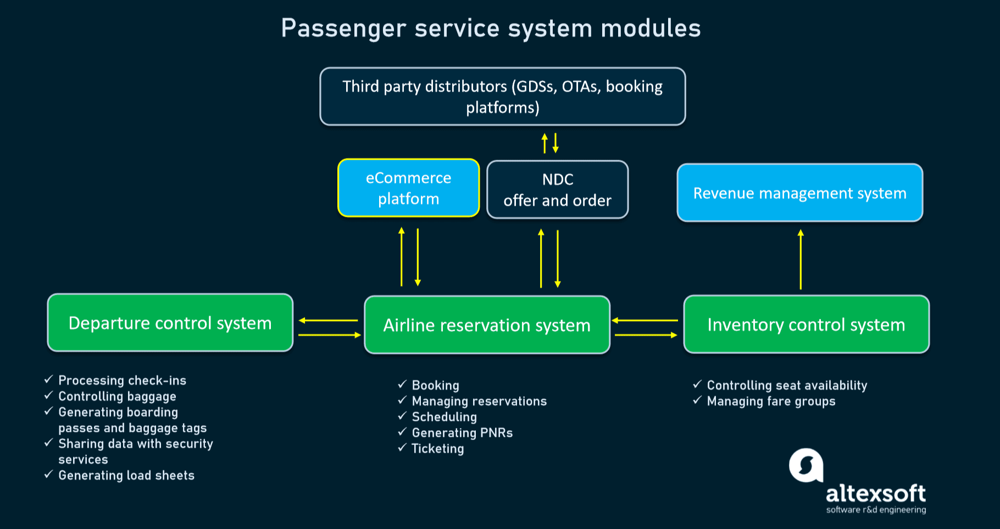

Passenger service system modules

386


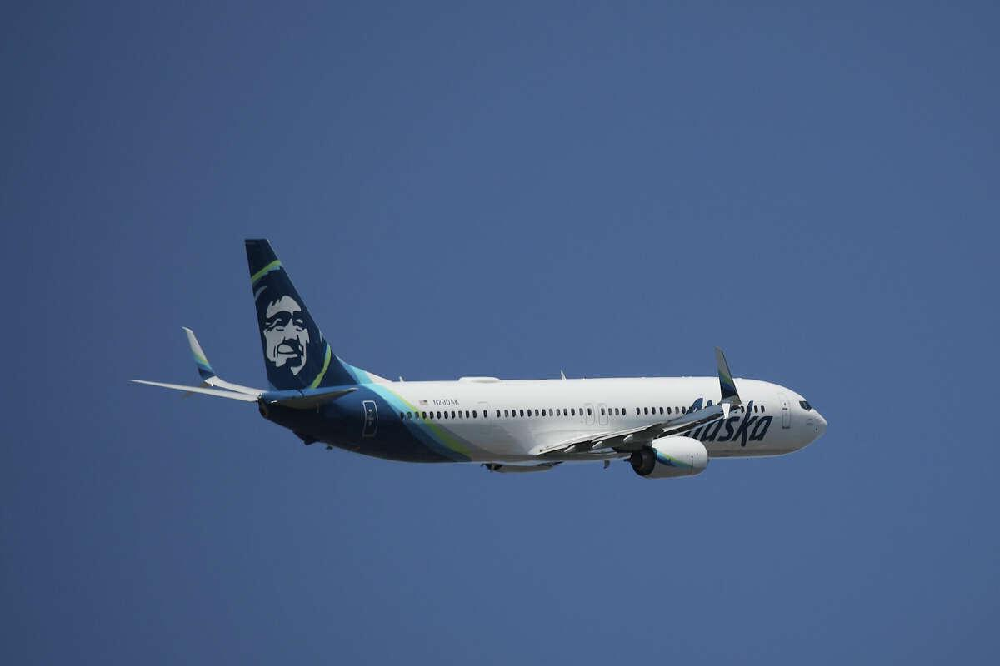

A Boeing 737990 ER operated by Alaska Airlines takes off from JFK Airport in August 2019

387


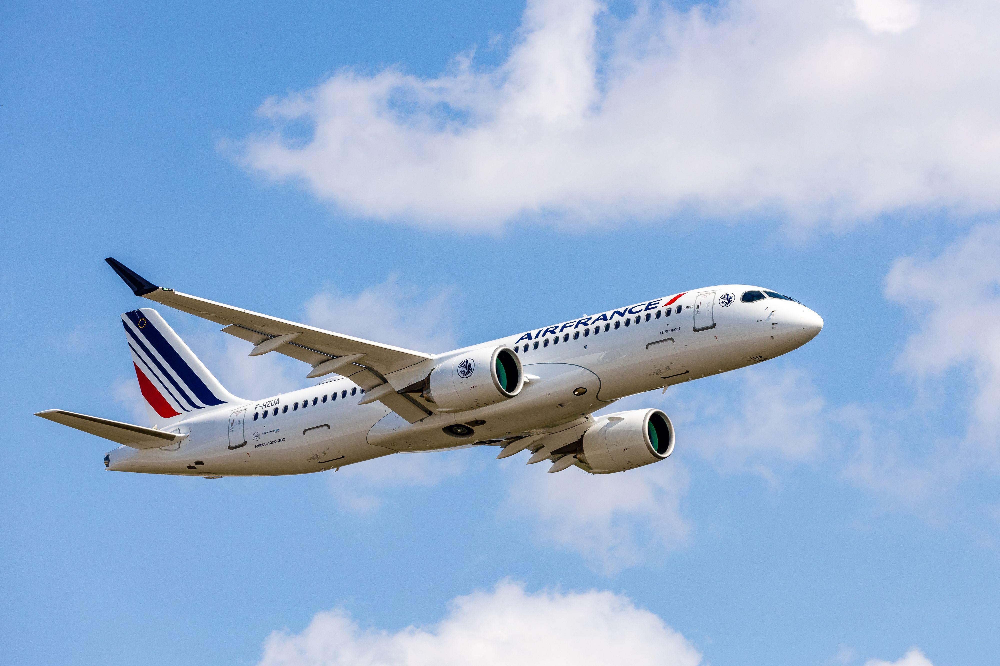

A220 Air France in flight

388


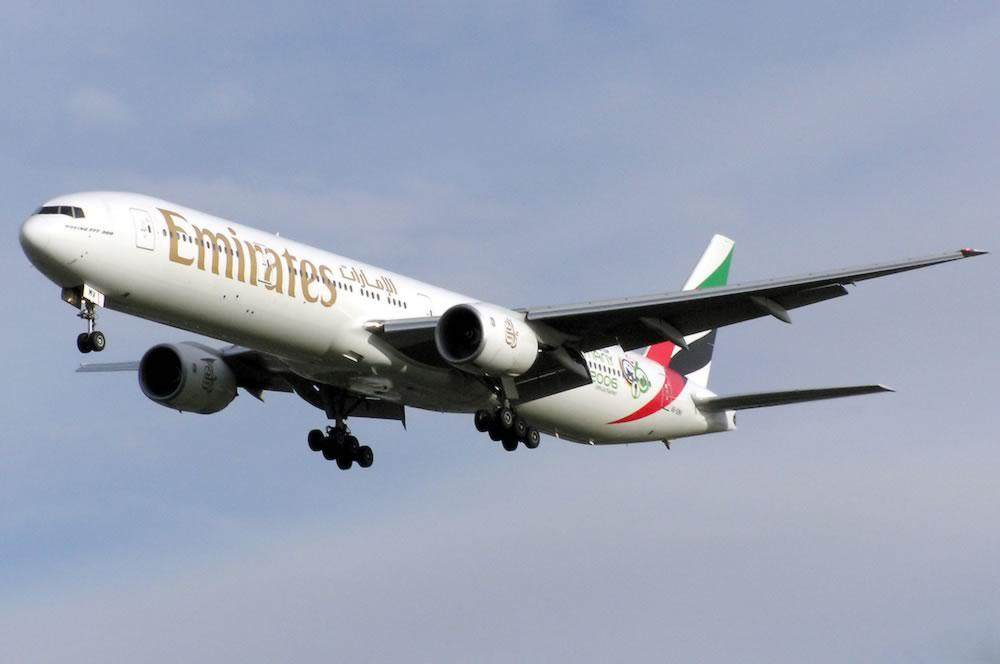

EEmirates Boeing 77731H Registration Number A6EMV This is a 777300 series aircraft originally purchased by Emirates Boeing Airline Customer Code 1H

389


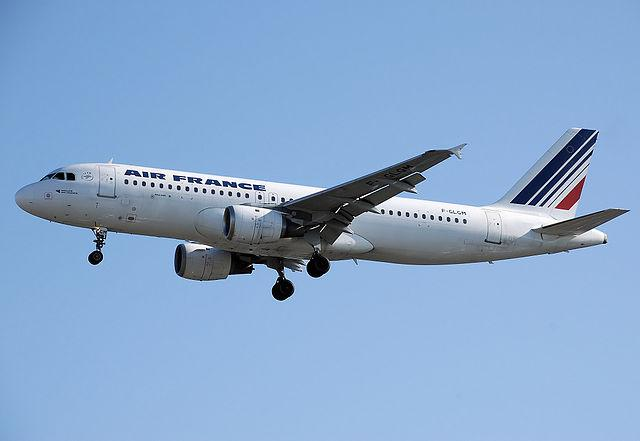

Air France Airbus A320214 Registration FGLGM

390


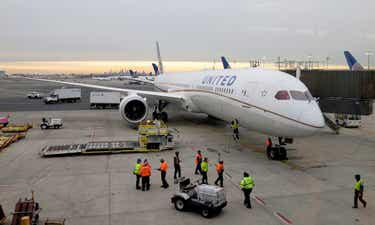

pA Dreamliner 78710 arriving from Los Angeles pulls up to a gate at Newark Liberty International Airport in Newark NJ Monday Jan 7 2019 Federal safety officials are directing operators of some Boeing planes to adopt extra procedures when landing on wet or snowy runways near impending 5G service because they say interference from the wireless networks could mean that the planes need more room to landp

391


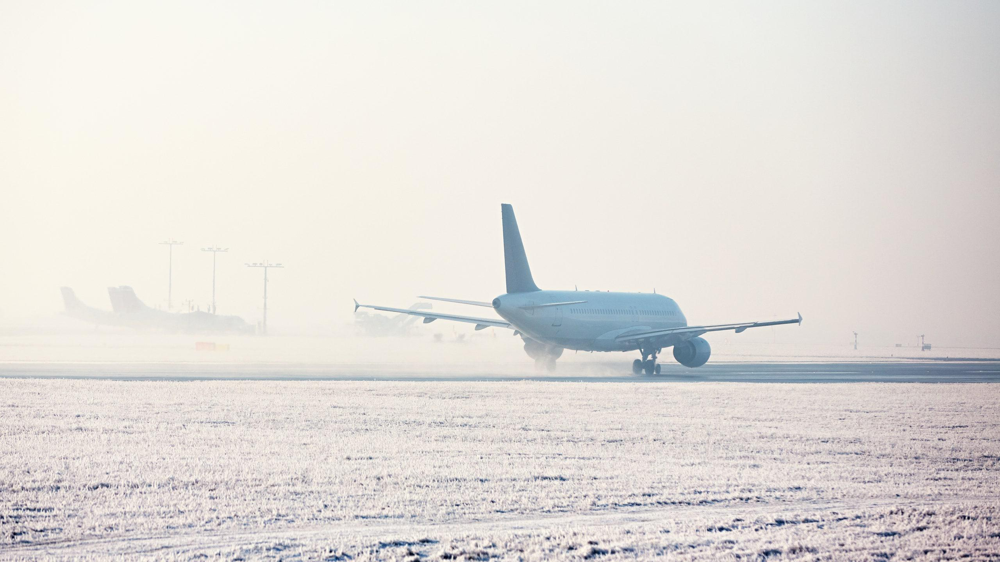

Airport in winter Airplane is taking off in snowy day

392


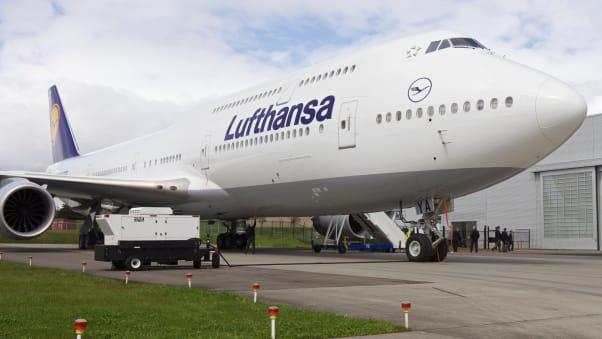

Lufthansa boeing plane

393


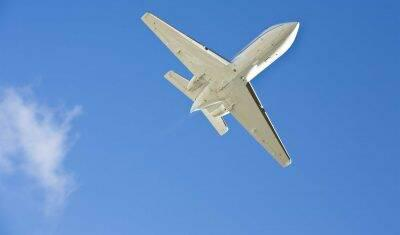

In Flight Safety

394


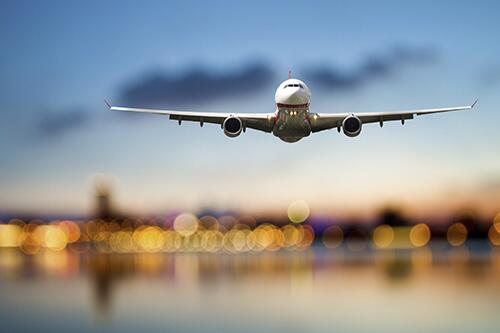

Image of an airplane taking off over a runway

395


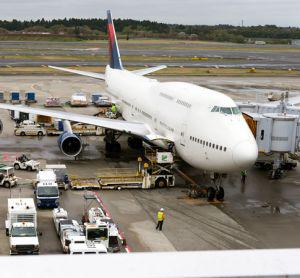

Connected technology for safer more efficient airports

396


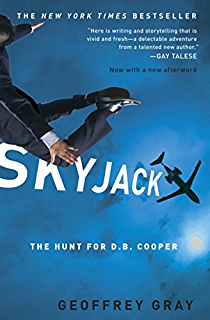

Skyjack The Hunt for D B Cooper

397


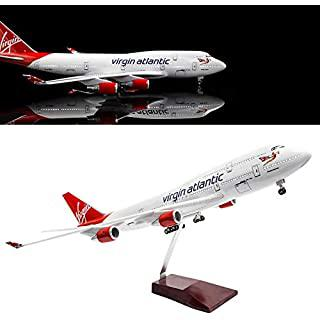

24Hours 18 1130 Scale Model Jet British Airways Virgin B747 Model Planes Kits Display Diecast Airplane with LED LightTouch or Sound Control

398


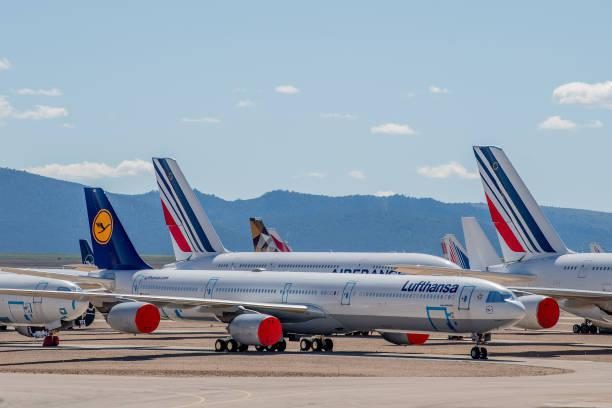

An Airbus A340 passenger aircraft operated by Lufthansa stand next to Air France aircraft parked in a storage facility operated by TARMAC Aerosave at

399


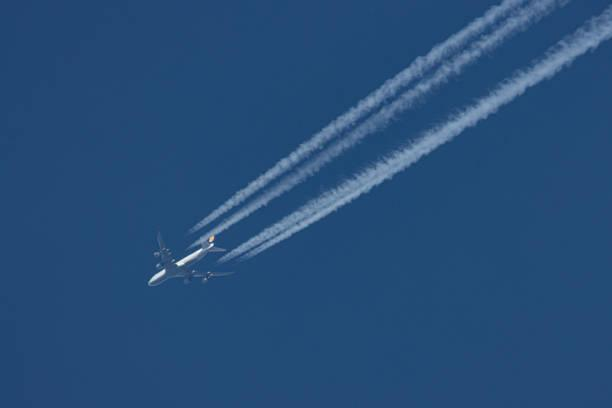

Lufthansa Boeing 7478 aircraft spotted flying at 34000 feet in the blue sky performing a flight from Frankfurt FRA airport in Germany to Chicago



In [127]:
s_ind = 300
e_ind = 400
for idx, row in dff_t.iterrows():
    if idx >=s_ind and idx < e_ind:
        print(idx)
        cap = get_image(idx, dff_t)
        display(IImage(filename='deer_decode.jpg', width = 300, height = 200))
        print(cap)
        print()
